In this project we want to use RNN and LSTM for removing noise from signals.

# **Import Packages**

In [ ]:
import numpy as np 
import math
import matplotlib.pyplot as plt
import cv2
import random

# Audio
import librosa, librosa.display
import soundfile

# Network
from tensorflow import keras
import keras.layers as L
import keras.models as M
from scipy import signal 
from keras.models import Sequential
from keras.layers import Dense, SimpleRNN, LSTM



# **Some Functions**


In [ ]:
# Function for plotting loss and accuracy signals
def plothist(hist):
    plt.plot(hist.history['accuracy'],color='b',linewidth=2.0)
    plt.plot(hist.history['val_accuracy'],color='r',linewidth=2.0)

    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.grid()
    plt.show()

def plothist_loss(hist):
    plt.plot(hist.history['loss'],color='b',linewidth=2.0)
    plt.plot(hist.history['val_loss'],color='r',linewidth=2.0)
  
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.grid()
    plt.show()
    
# Calculation of power of signal
def signalPower(x):
  s=np.square(x)
  average = sum(s) / len(s)
  return average

# Calculation of SNR 
def SNRsystem(inputSig, outputSig):
    noise = outputSig-inputSig
    
    powS = signalPower(outputSig)
    powN = signalPower(noise)
    return 10*math.log10((powS-powN)/powN)

# Add noise to the image (gaussian noise and salt and pepper noise)
def noisy(noise_typ,image):
    if noise_typ == "gauss":
        row,col= image.shape
        mean = 0
        sigma = 100
        # Create random gaussian
        gauss = np.random.normal(mean,sigma,(row,col))
        # Make sure it has the same shape
        gauss = gauss.reshape(row,col)
        noisy = image + gauss
        return noisy
    elif noise_typ == "snp":
        row,col = image.shape
        s_vs_p = 0.5
        amount = 0.02
        out = np.copy(image)
        # Number of salt (half of total)
        num_salt = np.ceil(amount * image.size * s_vs_p)
        # Random locations
        coords = tuple([np.random.randint(0, i - 1, int(num_salt)) for i in image.shape])
        out[coords] = 255

        # Number of pepper (half of total)
        num_pepper = np.ceil(amount* image.size * (1. - s_vs_p))
        # Random locations
        coords = tuple([np.random.randint(0, i - 1, int(num_pepper)) for i in image.shape])
        out[coords] = 0
        return out


# **الف و ب: Generating true signals and noisy ones and splitting dataset**

***True waves and noisy ones***

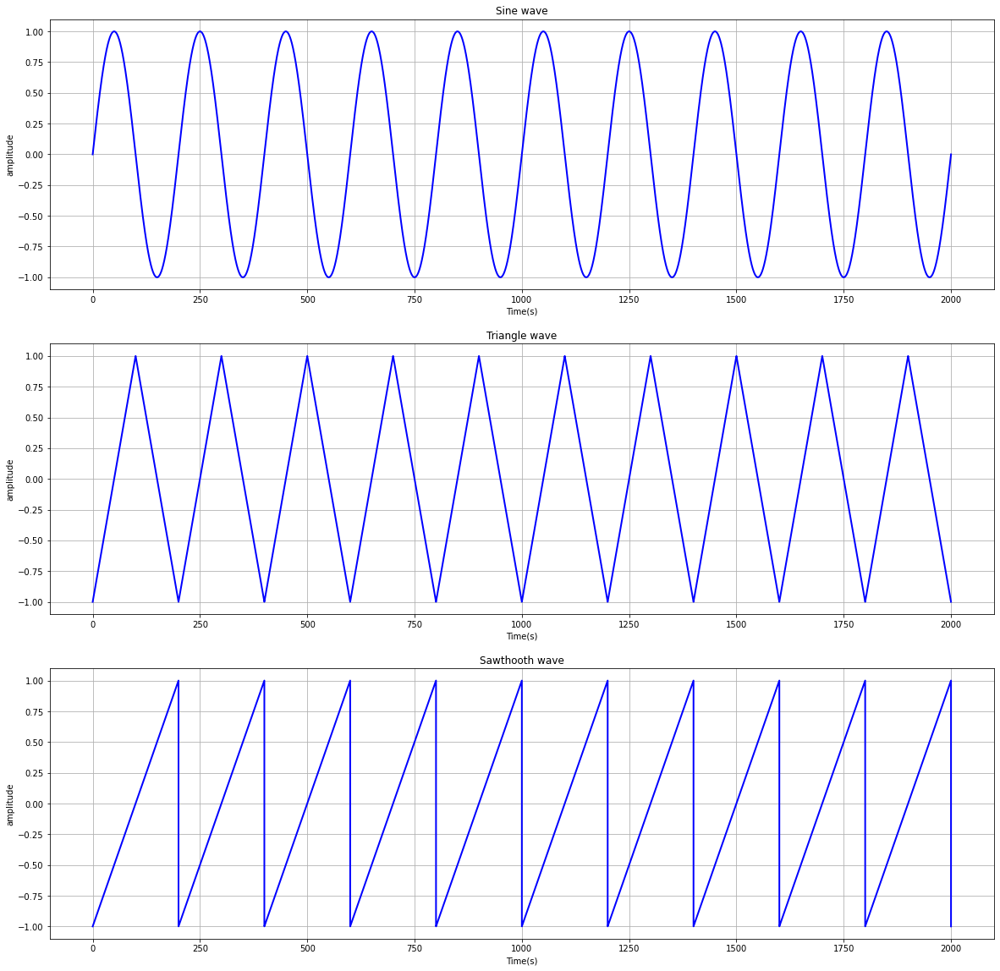

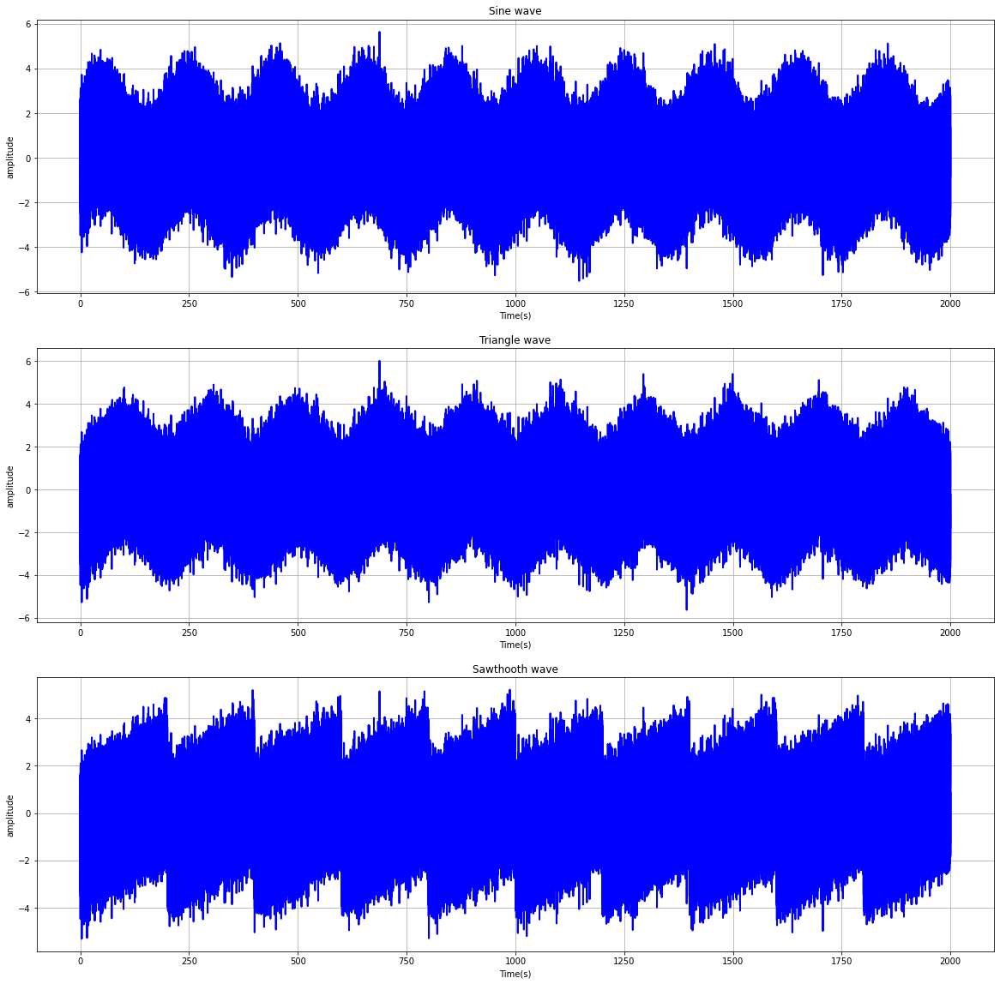

In [ ]:
dur        = 2000        # Second
sample_rate= 1000
freq       = 1/200       #Hz, each periods of these waves is 200 second
T          = 200         #Second

# time, 2000 seconds
t = np.linspace(0, dur, dur*sample_rate)

#true signals 
sin       = np.sin(2*np.pi*freq * t)
saw_tooth = signal.sawtooth(2 * np.pi * freq * t)
triangle  = signal.sawtooth(2 * np.pi * freq * t,0.5)

# gaussian noise with mean=0 and variance=1
noise = np.random.normal(0,1,len(sin))

# signals with noise
noisy_sin       = sin       + noise
noisy_saw_tooth = saw_tooth + noise
noisy_triangle  = triangle  + noise



#plotting the true waves
plt.figure(figsize=(20,20))
plt.subplot(3,1,1)
plt.plot(t,sin,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Sine wave')
plt.grid()

plt.subplot(3,1,2)
plt.plot(t,triangle,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Triangle wave')
plt.grid()

plt.subplot(3,1,3)
plt.plot(t,saw_tooth,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Sawthooth wave')
plt.grid()

#plotting noisy signals
plt.figure(figsize=(20,20))
plt.subplot(3,1,1)
plt.plot(t,noisy_sin,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Sine wave')
plt.grid()

plt.subplot(3,1,2)
plt.plot(t,noisy_triangle,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Triangle wave')
plt.grid()

plt.subplot(3,1,3)
plt.plot(t,noisy_saw_tooth,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Sawthooth wave')
plt.grid()




**Splitting dataset**

In [ ]:
true_signal = np.array([sin,triangle,saw_tooth]).T
noisy_signal= np.array([noisy_sin,noisy_triangle,noisy_saw_tooth]).T
print('Shape of signal')
print(true_signal.shape)

# splitting data into 1 second chunks for our 3 signals
input_data  = np.zeros((dur, sample_rate, 3)) # (2000, 1000, 3)
target_data = np.zeros((dur, sample_rate,3)) # (2000, 1000, 3)
for i in range(dur):
    st = i*sample_rate
    et = (i+1)*sample_rate
    input_data[i,:]  = noisy_signal [st:et]
    target_data[i,:] = true_signal  [st:et]

# each period of these signals is 200 seconds; so
# 7 periods for training data
# train on 7*200 = 1400 seconds
ts=7*T
x_train = input_data[:ts, :]
y_train = target_data[:ts, :]


# 1 periods for validation data
# train on 1*200 = 200 seconds
x_valid = input_data [ts:ts+T, :]
y_valid = target_data[ts:ts+T, :]

# test data is the rest of data 
t_test=dur-(ts+T)
x_test = input_data [ts+T:, :]
y_test = target_data[ts+T:, :]
########

print('x_train, y_train', x_train.shape, y_train.shape)
print('x_valid, y_valid', x_valid.shape, y_valid.shape)
print('x_test, y_test', x_test.shape, y_test.shape)

Shape of signal
(2000000, 3)
x_train, y_train (1400, 1000, 3) (1400, 1000, 3)
x_valid, y_valid (200, 1000, 3) (200, 1000, 3)
x_test, y_test (400, 1000, 3) (400, 1000, 3)


#  **ج : LSTM, RNN, calculation of SNR**

## **ج.1: LSTM Network**

**LSTM**
* Optimizer: ADAM
* Learning Rate: 0.01
* Loss Function: MSE
* Batch Size: 16
* Number of Epochs:60

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_B16LSTM=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=16, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
88/88 [==============================] - 13s 127ms/step - loss: 0.1955 - accuracy: 0.6891 - val_loss: 0.0473 - val_accuracy: 0.9457
Epoch 2/60
88/88 [==============================] - 10s 116ms/step - loss: 0.0306 - accuracy: 0.9562 - val_loss: 0.0201 - val_accuracy: 0.9686
Epoch 3/60
88/88 [==============================] - 10s 117ms/step - loss: 0.0143 - accuracy: 0.9729 - val_loss: 0.0083 - val_accuracy: 0.9821
Epoch 4/60
88/88 [==============================] - 10s 114ms/step - loss: 0.0064 - accuracy: 0.9799 - val_loss: 0.0049 - val_accuracy: 0.9840
Epoch 5/60
88/88 [==============================] - 10s 118ms/step - loss: 0.0042 - accuracy: 0.9852 - val_loss: 0.0036 - val_accuracy: 0.9879
Epoch 6/60
88/88 [==============================] - 10s 113ms/step - loss: 0.0032 - accuracy: 0.9896 - val_loss: 0.0028 - val_accuracy: 0.9906
Epoch 7/60
88/88 [==============================] - 10s 114ms/step - loss: 0.0025 - accuracy: 0.9914 - val_loss: 0.0025 - val_accuracy: 0.9915

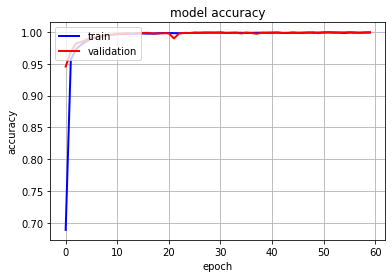

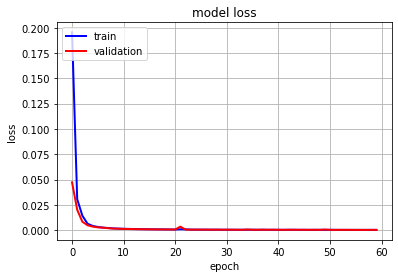

In [ ]:
plothist(history_B16LSTM)
plothist_loss(history_B16LSTM)

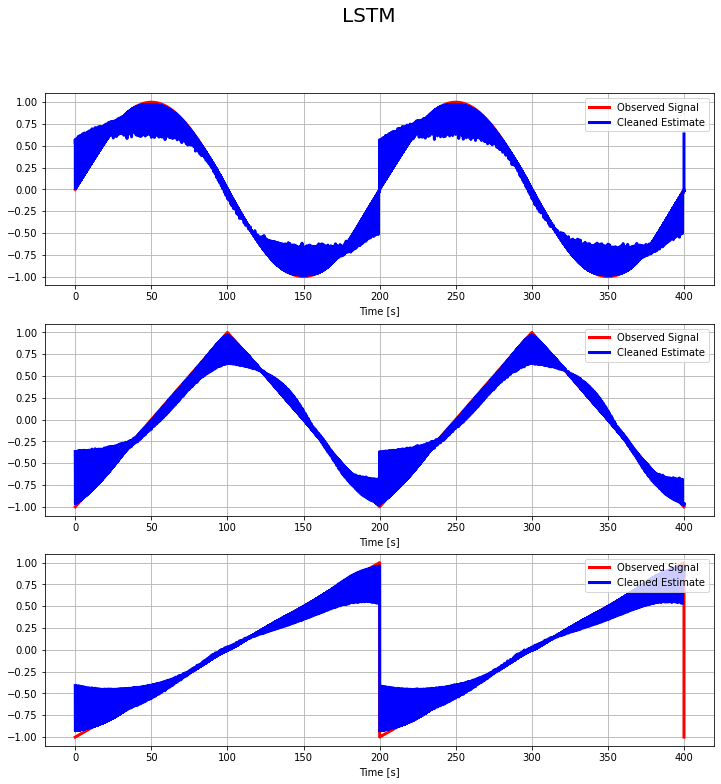

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('LSTM', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

## **ج.2: SNR for Outputs of LSTM Network**



In [ ]:
print('sin')
print(f'SNR Sin Signal is {SNRsystem(sin,noisy_sin)} dB')
print(f'SNR Sin Signal(output of LSTM) is {SNRsystem(sin_test.flatten(),sin_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Triangel')
print(f'SNR Triangle Signal is {SNRsystem(triangle,noisy_triangle)} dB')
print(f'SNR Triangle Signal(output of LSTM) is {SNRsystem(triangle_test.flatten(),triangle_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Saw thooth')
print(f'SNR Saw thooth Signal is {SNRsystem(saw_tooth,noisy_saw_tooth)} dB')
print(f'SNR Saw thooth Signal(output of LSTM) is {SNRsystem(saw_tooth_test.flatten(),saw_tooth_pred.flatten() )} dB')
print('*******************************************************************************************')

sin
SNR Sin Signal is -3.0090335959117236 dB
SNR Sin Signal(output of LSTM) is 31.649933477651416 dB
*******************************************************************************************
Triangel
SNR Triangle Signal is -4.775017889783561 dB
SNR Triangle Signal(output of LSTM) is 30.320423947861016 dB
*******************************************************************************************
Saw thooth
SNR Saw thooth Signal is -4.755652589697009 dB
SNR Saw thooth Signal(output of LSTM) is 30.80931288987315 dB
*******************************************************************************************


## **ج.3: RNN Network**

**RNN**
* Optimizer: ADAM
* Learning Rate: 0.01
* Loss Function: MSE
* Batch Size: 16
* Number of Epochs:60

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.SimpleRNN(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_B16RNN=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=16, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
88/88 [==============================] - 96s 1s/step - loss: 0.5947 - accuracy: 0.4696 - val_loss: 0.1449 - val_accuracy: 0.8205
Epoch 2/60
88/88 [==============================] - 97s 1s/step - loss: 0.0710 - accuracy: 0.9280 - val_loss: 0.0408 - val_accuracy: 0.9782
Epoch 3/60
88/88 [==============================] - 96s 1s/step - loss: 0.0399 - accuracy: 0.9687 - val_loss: 0.0392 - val_accuracy: 0.9693
Epoch 4/60
88/88 [==============================] - 94s 1s/step - loss: 0.0392 - accuracy: 0.9727 - val_loss: 0.0387 - val_accuracy: 0.9650
Epoch 5/60
88/88 [==============================] - 92s 1s/step - loss: 0.0386 - accuracy: 0.9714 - val_loss: 0.0389 - val_accuracy: 0.9725
Epoch 6/60
88/88 [==============================] - 95s 1s/step - loss: 0.0382 - accuracy: 0.9705 - val_loss: 0.0377 - val_accuracy: 0.9747
Epoch 7/60
88/88 [==============================] - 93s 1s/step - loss: 0.0374 - accuracy: 0.9737 - val_loss: 0.0369 - val_accuracy: 0.9731
Epoch 8/60
88/88 [==

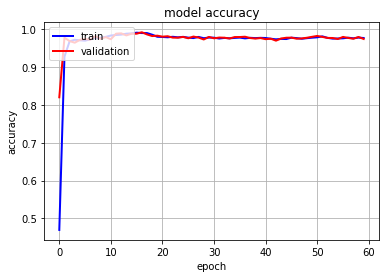

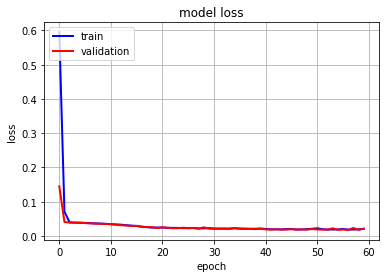

In [ ]:
plothist(history_B16RNN)
plothist_loss(history_B16RNN)

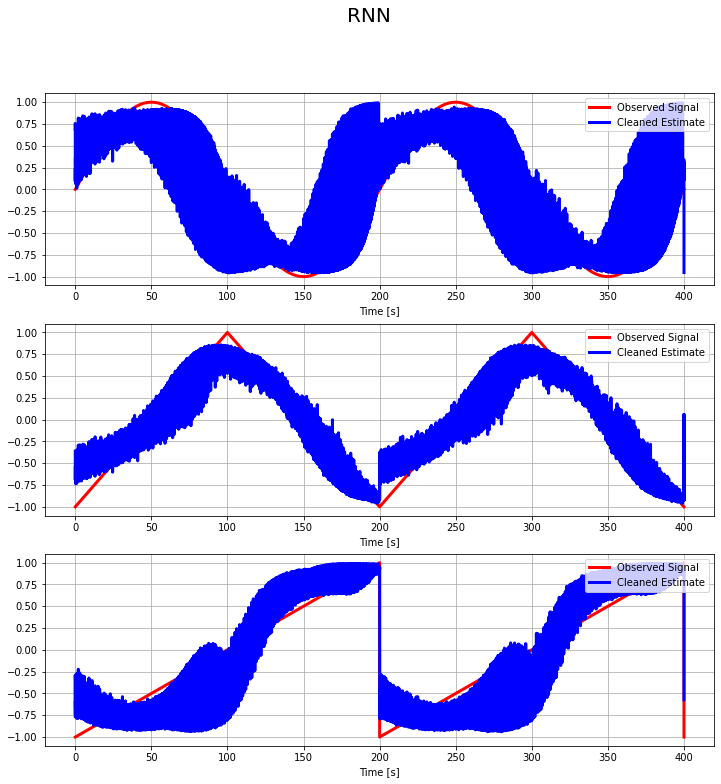

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('RNN', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

## **ج.4: SNR for Outputs of RNN**



In [ ]:
print('sin')
print(f'SNR Sin Signal is {SNRsystem(sin,noisy_sin)} dB')
print(f'SNR Sin Signal(output of LSTM) is {SNRsystem(sin_test.flatten(),sin_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Triangel')
print(f'SNR Triangle Signal is {SNRsystem(triangle,noisy_triangle)} dB')
print(f'SNR Triangle Signal(output of LSTM) is {SNRsystem(triangle_test.flatten(),triangle_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Saw thooth')
print(f'SNR Saw thooth Signal is {SNRsystem(saw_tooth,noisy_saw_tooth)} dB')
print(f'SNR Saw thooth Signal(output of LSTM) is {SNRsystem(saw_tooth_test.flatten(),saw_tooth_pred.flatten() )} dB')
print('*******************************************************************************************')

sin
SNR Sin Signal is -3.0090335959117236 dB
SNR Sin Signal(output of LSTM) is 13.50255248430994 dB
*******************************************************************************************
Triangel
SNR Triangle Signal is -4.775017889783561 dB
SNR Triangle Signal(output of LSTM) is 10.723259070292219 dB
*******************************************************************************************
Saw thooth
SNR Saw thooth Signal is -4.755652589697009 dB
SNR Saw thooth Signal(output of LSTM) is 12.071747260780764 dB
*******************************************************************************************


## **ج.5: Comparing RNN and LSTM**

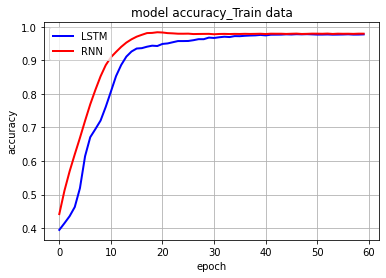

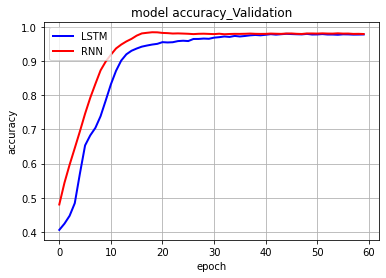

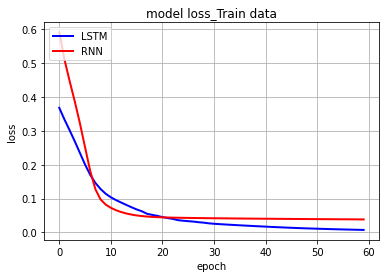

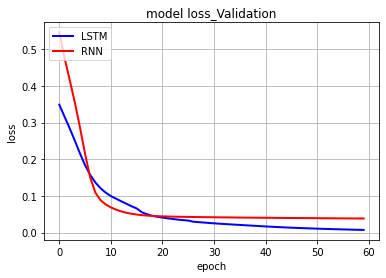

In [ ]:
plt.plot(history_1DLSTM.history['accuracy'],color='b',linewidth=2.0)
plt.plot(history_1DRNN.history['accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['LSTM', 'RNN'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DLSTM.history['val_accuracy'],color='b',linewidth=2.0)
plt.plot(history_1DRNN.history['val_accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['LSTM', 'RNN'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DLSTM.history['loss'],color='b',linewidth=2.0)
plt.plot(history_1DRNN.history['loss'],color='r',linewidth=2.0)

plt.title('model loss_Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['LSTM', 'RNN'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DLSTM.history['val_loss'],color='b',linewidth=2.0)
plt.plot(history_1DRNN.history['val_loss'],color='r',linewidth=2.0)

plt.title('model loss_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['LSTM', 'RNN'], loc='upper left')
plt.grid()
plt.show()

# **د: Changing Learning Rate, Batch Size, Number of Epoches and Varience of Noise**

## **د.1: Changing Learning Rate**

**We train both LSTM and RNN with 2 diffrent learning rate(0.01,0.001) and in the end, we compare them**

**Changing learning Rate in LSTM**

**LSTM**
* Optimizer: ADAM
* **Learning Rate: 0.001**
* Loss Function: MSE
* Batch Size: 32
* Number of Epochs:60

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer='adam',metrics=['accuracy'])


# Train
history_1DLSTM=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=32, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
44/44 [==============================] - 10s 133ms/step - loss: 0.3681 - accuracy: 0.3944 - val_loss: 0.3489 - val_accuracy: 0.4062
Epoch 2/60
44/44 [==============================] - 6s 127ms/step - loss: 0.3337 - accuracy: 0.4144 - val_loss: 0.3166 - val_accuracy: 0.4245
Epoch 3/60
44/44 [==============================] - 5s 119ms/step - loss: 0.3019 - accuracy: 0.4353 - val_loss: 0.2847 - val_accuracy: 0.4475
Epoch 4/60
44/44 [==============================] - 5s 119ms/step - loss: 0.2693 - accuracy: 0.4627 - val_loss: 0.2512 - val_accuracy: 0.4843
Epoch 5/60
44/44 [==============================] - 5s 119ms/step - loss: 0.2348 - accuracy: 0.5188 - val_loss: 0.2161 - val_accuracy: 0.5712
Epoch 6/60
44/44 [==============================] - 5s 119ms/step - loss: 0.2005 - accuracy: 0.6144 - val_loss: 0.1837 - val_accuracy: 0.6531
Epoch 7/60
44/44 [==============================] - 5s 120ms/step - loss: 0.1701 - accuracy: 0.6710 - val_loss: 0.1571 - val_accuracy: 0.6824
Epoch

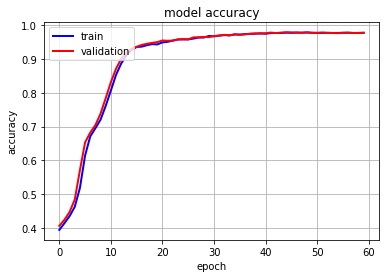

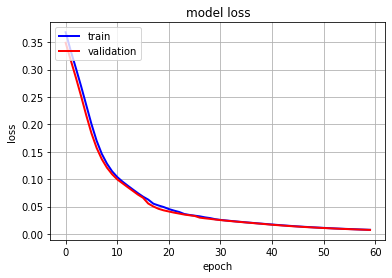

In [ ]:
plothist(history_1DLSTM)
plothist_loss(history_1DLSTM)

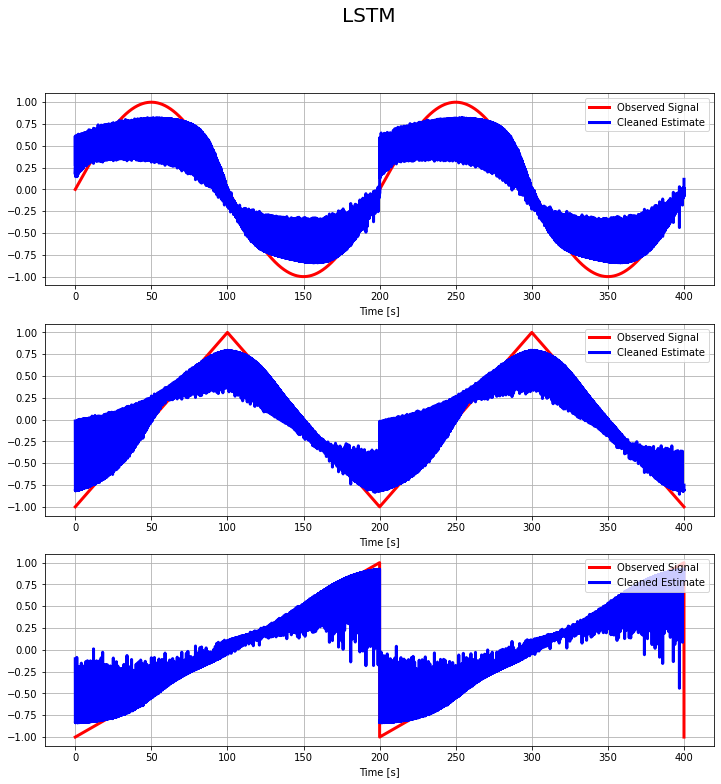

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('LSTM', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

In [ ]:
print('sin')
print(f'SNR Sin Signal is {SNRsystem(sin,noisy_sin)} dB')
print(f'SNR Sin Signal(output of LSTM) is {SNRsystem(sin_test.flatten(),sin_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Triangel')
print(f'SNR Triangle Signal is {SNRsystem(triangle,noisy_triangle)} dB')
print(f'SNR Triangle Signal(output of LSTM) is {SNRsystem(triangle_test.flatten(),triangle_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Saw thooth')
print(f'SNR Saw thooth Signal is {SNRsystem(saw_tooth,noisy_saw_tooth)} dB')
print(f'SNR Saw thooth Signal(output of LSTM) is {SNRsystem(saw_tooth_test.flatten(),saw_tooth_pred.flatten() )} dB')
print('*******************************************************************************************')

sin
SNR Sin Signal is -3.0090335959117236 dB
SNR Sin Signal(output of LSTM) is 14.602610386879302 dB
*******************************************************************************************
Triangel
SNR Triangle Signal is -4.775017889783561 dB
SNR Triangle Signal(output of LSTM) is 17.050405301649505 dB
*******************************************************************************************
Saw thooth
SNR Saw thooth Signal is -4.755652589697009 dB
SNR Saw thooth Signal(output of LSTM) is 21.568247077509234 dB
*******************************************************************************************


**LSTM**
* Optimizer: ADAM
* **Learning Rate: 0.01**
* Loss Function: MSE
* Batch Size: 32
* Number of Epochs:60

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_1RLSTM=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=32, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
44/44 [==============================] - 8s 132ms/step - loss: 0.3467 - accuracy: 0.2804 - val_loss: 0.2282 - val_accuracy: 0.6106
Epoch 2/60
44/44 [==============================] - 5s 119ms/step - loss: 0.1549 - accuracy: 0.7460 - val_loss: 0.0989 - val_accuracy: 0.8470
Epoch 3/60
44/44 [==============================] - 5s 119ms/step - loss: 0.0831 - accuracy: 0.8777 - val_loss: 0.0732 - val_accuracy: 0.9023
Epoch 4/60
44/44 [==============================] - 5s 118ms/step - loss: 0.0672 - accuracy: 0.9175 - val_loss: 0.0623 - val_accuracy: 0.9315
Epoch 5/60
44/44 [==============================] - 5s 118ms/step - loss: 0.0606 - accuracy: 0.9425 - val_loss: 0.0610 - val_accuracy: 0.9602
Epoch 6/60
44/44 [==============================] - 5s 118ms/step - loss: 0.0680 - accuracy: 0.9618 - val_loss: 0.0830 - val_accuracy: 0.9674
Epoch 7/60
44/44 [==============================] - 5s 118ms/step - loss: 0.0649 - accuracy: 0.9576 - val_loss: 0.0537 - val_accuracy: 0.9619
Epoch 

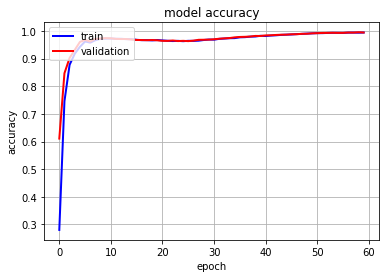

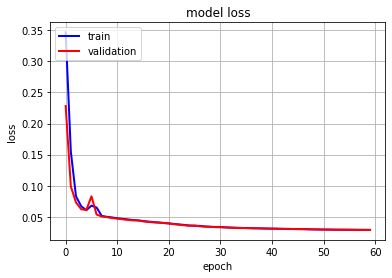

In [ ]:
plothist(history_1RLSTM)
plothist_loss(history_1RLSTM)

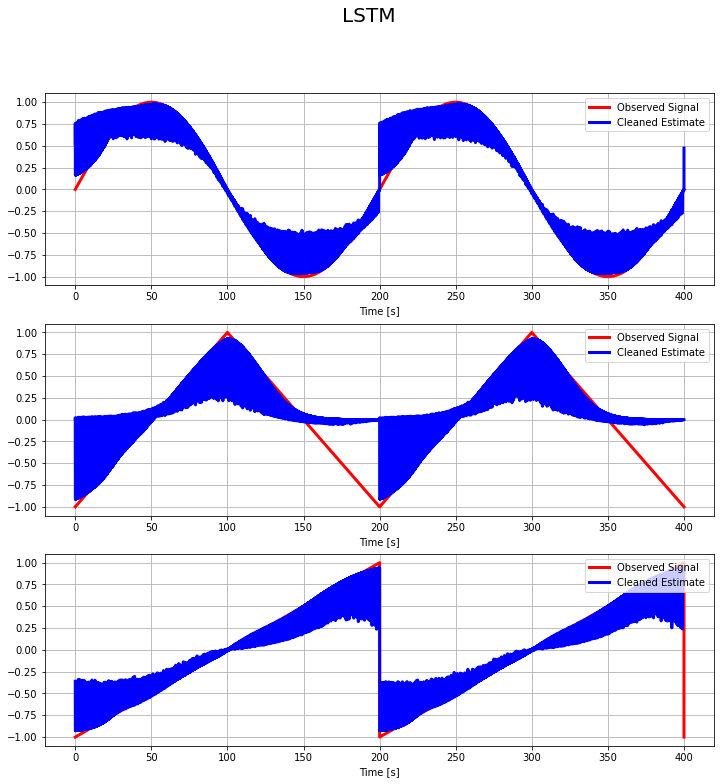

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('LSTM', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

In [ ]:
print('sin')
print(f'SNR Sin Signal is {SNRsystem(sin,noisy_sin)} dB')
print(f'SNR Sin Signal(output of LSTM) is {SNRsystem(sin_test.flatten(),sin_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Triangel')
print(f'SNR Triangle Signal is {SNRsystem(triangle,noisy_triangle)} dB')
print(f'SNR Triangle Signal(output of LSTM) is {SNRsystem(triangle_test.flatten(),triangle_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Saw thooth')
print(f'SNR Saw thooth Signal is {SNRsystem(saw_tooth,noisy_saw_tooth)} dB')
print(f'SNR Saw thooth Signal(output of LSTM) is {SNRsystem(saw_tooth_test.flatten(),saw_tooth_pred.flatten() )} dB')
print('*******************************************************************************************')

sin
SNR Sin Signal is -3.0090335959117236 dB
SNR Sin Signal(output of LSTM) is 26.75004283450599 dB
*******************************************************************************************
Triangel
SNR Triangle Signal is -4.775017889783561 dB
SNR Triangle Signal(output of LSTM) is 2.6488069055257917 dB
*******************************************************************************************
Saw thooth
SNR Saw thooth Signal is -4.755652589697009 dB
SNR Saw thooth Signal(output of LSTM) is 28.29578658258166 dB
*******************************************************************************************


**Comparing Learning Rate (lr=0.01,lr=0.001) in LSTM**

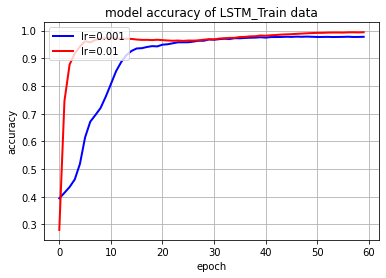

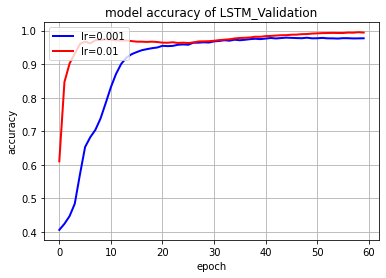

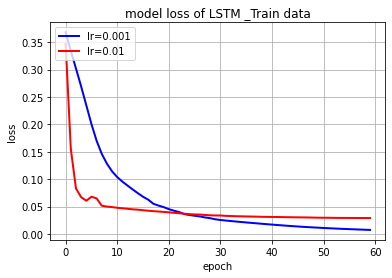

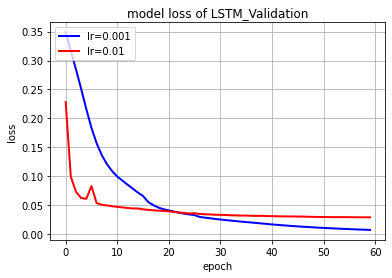

In [ ]:
plt.plot(history_1DLSTM.history['accuracy'],color='b',linewidth=2.0)
plt.plot(history_1RLSTM.history['accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy of LSTM_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DLSTM.history['val_accuracy'],color='b',linewidth=2.0)
plt.plot(history_1RLSTM.history['val_accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy of LSTM_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DLSTM.history['loss'],color='b',linewidth=2.0)
plt.plot(history_1RLSTM.history['loss'],color='r',linewidth=2.0)

plt.title('model loss of LSTM _Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DLSTM.history['val_loss'],color='b',linewidth=2.0)
plt.plot(history_1RLSTM.history['val_loss'],color='r',linewidth=2.0)

plt.title('model loss of LSTM_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

**Changing learning Rate in RNN**

**RNN**
* Optimizer: ADAM
* **Learning Rate: 0.001**
* Loss Function: MSE
* Batch Size: 32
* Number of Epochs:60

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This RNN will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.SimpleRNN(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer='adam',metrics=['accuracy'])


# Train
history_1DRNN=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=32, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
44/44 [==============================] - 53s 1s/step - loss: 0.5916 - accuracy: 0.4416 - val_loss: 0.5464 - val_accuracy: 0.4805
Epoch 2/60
44/44 [==============================] - 49s 1s/step - loss: 0.5113 - accuracy: 0.5114 - val_loss: 0.4773 - val_accuracy: 0.5438
Epoch 3/60
44/44 [==============================] - 49s 1s/step - loss: 0.4476 - accuracy: 0.5691 - val_loss: 0.4173 - val_accuracy: 0.5966
Epoch 4/60
44/44 [==============================] - 49s 1s/step - loss: 0.3873 - accuracy: 0.6200 - val_loss: 0.3555 - val_accuracy: 0.6452
Epoch 5/60
44/44 [==============================] - 49s 1s/step - loss: 0.3223 - accuracy: 0.6689 - val_loss: 0.2873 - val_accuracy: 0.6944
Epoch 6/60
44/44 [==============================] - 49s 1s/step - loss: 0.2513 - accuracy: 0.7201 - val_loss: 0.2142 - val_accuracy: 0.7458
Epoch 7/60
44/44 [==============================] - 49s 1s/step - loss: 0.1812 - accuracy: 0.7691 - val_loss: 0.1499 - val_accuracy: 0.7922
Epoch 8/60
44/44 [==

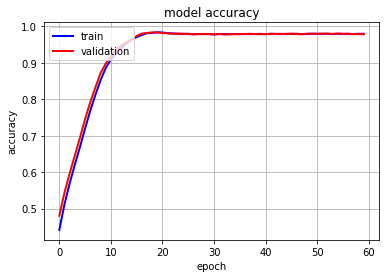

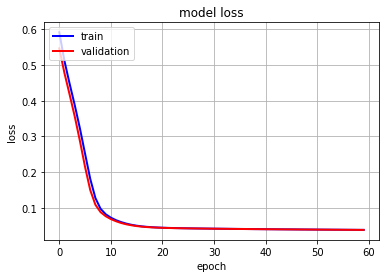

In [ ]:
plothist(history_1DRNN)
plothist_loss(history_1DRNN)

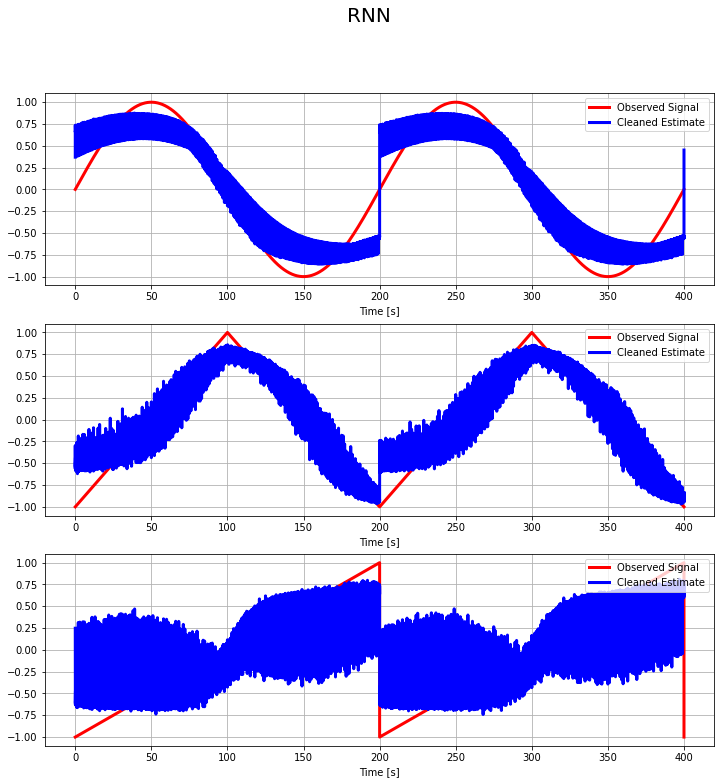

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('RNN', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

In [ ]:
print('sin')
print(f'SNR Sin Signal is {SNRsystem(sin,noisy_sin)} dB')
print(f'SNR Sin Signal(output of LSTM) is {SNRsystem(sin_test.flatten(),sin_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Triangel')
print(f'SNR Triangle Signal is {SNRsystem(triangle,noisy_triangle)} dB')
print(f'SNR Triangle Signal(output of LSTM) is {SNRsystem(triangle_test.flatten(),triangle_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Saw thooth')
print(f'SNR Saw thooth Signal is {SNRsystem(saw_tooth,noisy_saw_tooth)} dB')
print(f'SNR Saw thooth Signal(output of LSTM) is {SNRsystem(saw_tooth_test.flatten(),saw_tooth_pred.flatten() )} dB')
print('*******************************************************************************************')

sin
SNR Sin Signal is -3.0090335959117236 dB
SNR Sin Signal(output of LSTM) is 8.393861519754854 dB
*******************************************************************************************
Triangel
SNR Triangle Signal is -4.775017889783561 dB
SNR Triangle Signal(output of LSTM) is 10.546009309959604 dB
*******************************************************************************************
Saw thooth
SNR Saw thooth Signal is -4.755652589697009 dB
SNR Saw thooth Signal(output of LSTM) is 7.965208215953989 dB
*******************************************************************************************


**Changing learning Rate in RNN**

**RNN**
* Optimizer: ADAM
* **Learning Rate: 0.01**
* Loss Function: MSE
* Batch Size: 32
* Number of Epochs:60

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This RNN will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.SimpleRNN(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_1RRNN=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=32, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
44/44 [==============================] - 53s 1s/step - loss: 0.5785 - accuracy: 0.4842 - val_loss: 0.3019 - val_accuracy: 0.6177
Epoch 2/60
44/44 [==============================] - 48s 1s/step - loss: 0.2150 - accuracy: 0.6720 - val_loss: 0.1251 - val_accuracy: 0.8138
Epoch 3/60
44/44 [==============================] - 48s 1s/step - loss: 0.0797 - accuracy: 0.8484 - val_loss: 0.0527 - val_accuracy: 0.9309
Epoch 4/60
44/44 [==============================] - 48s 1s/step - loss: 0.0473 - accuracy: 0.9710 - val_loss: 0.0454 - val_accuracy: 0.9903
Epoch 5/60
44/44 [==============================] - 48s 1s/step - loss: 0.0449 - accuracy: 0.9926 - val_loss: 0.0444 - val_accuracy: 0.9908
Epoch 6/60
44/44 [==============================] - 59s 1s/step - loss: 0.0440 - accuracy: 0.9918 - val_loss: 0.0435 - val_accuracy: 0.9862
Epoch 7/60
44/44 [==============================] - 48s 1s/step - loss: 0.0429 - accuracy: 0.9923 - val_loss: 0.0422 - val_accuracy: 0.9913
Epoch 8/60
44/44 [==

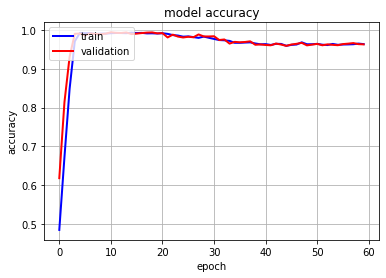

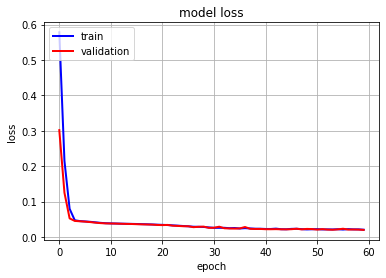

In [ ]:
plothist(history_1RRNN)
plothist_loss(history_1RRNN)

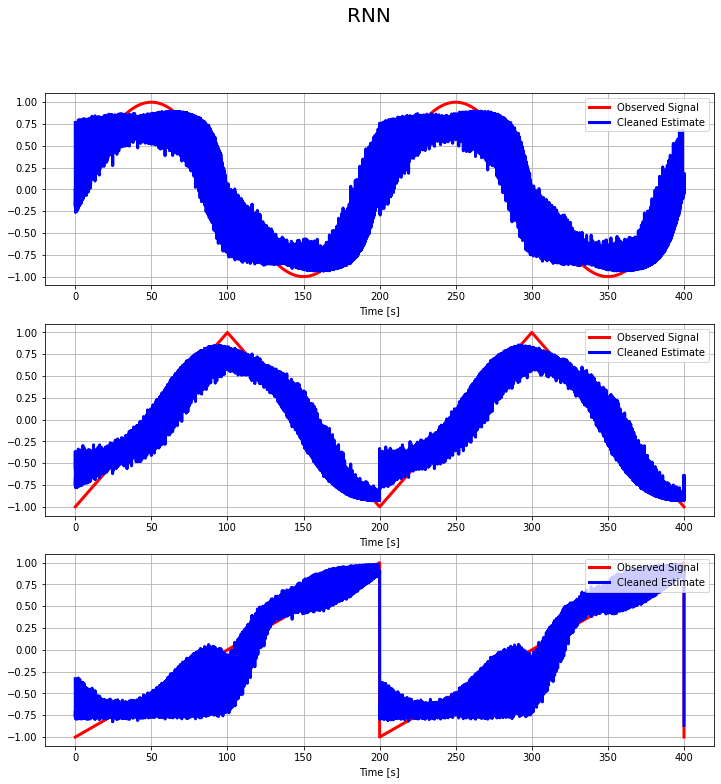

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('RNN', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

In [ ]:
print('sin')
print(f'SNR Sin Signal is {SNRsystem(sin,noisy_sin)} dB')
print(f'SNR Sin Signal(output of LSTM) is {SNRsystem(sin_test.flatten(),sin_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Triangel')
print(f'SNR Triangle Signal is {SNRsystem(triangle,noisy_triangle)} dB')
print(f'SNR Triangle Signal(output of LSTM) is {SNRsystem(triangle_test.flatten(),triangle_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Saw thooth')
print(f'SNR Saw thooth Signal is {SNRsystem(saw_tooth,noisy_saw_tooth)} dB')
print(f'SNR Saw thooth Signal(output of LSTM) is {SNRsystem(saw_tooth_test.flatten(),saw_tooth_pred.flatten() )} dB')
print('*******************************************************************************************')

sin
SNR Sin Signal is -3.0090335959117236 dB
SNR Sin Signal(output of LSTM) is 12.683567592116113 dB
*******************************************************************************************
Triangel
SNR Triangle Signal is -4.775017889783561 dB
SNR Triangle Signal(output of LSTM) is 11.26629280704945 dB
*******************************************************************************************
Saw thooth
SNR Saw thooth Signal is -4.755652589697009 dB
SNR Saw thooth Signal(output of LSTM) is 13.189105426394455 dB
*******************************************************************************************


**Comparing Learning Rate (lr=0.01,lr=0.001) in RNN**

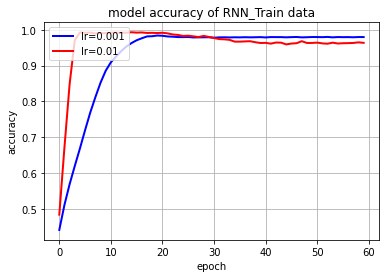

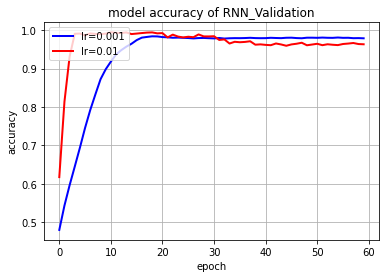

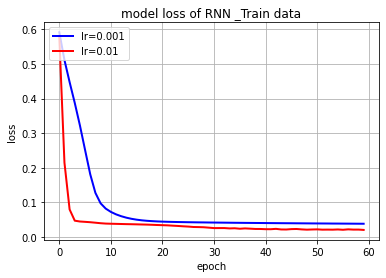

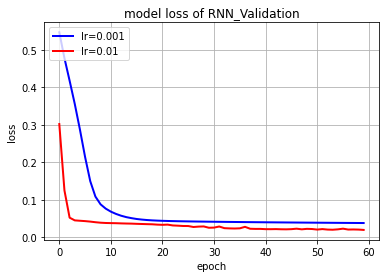

In [ ]:
plt.plot(history_1DRNN.history['accuracy'],color='b',linewidth=2.0)
plt.plot(history_1RRNN.history['accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy of RNN_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DRNN.history['val_accuracy'],color='b',linewidth=2.0)
plt.plot(history_1RRNN.history['val_accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy of RNN_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DRNN.history['loss'],color='b',linewidth=2.0)
plt.plot(history_1RRNN.history['loss'],color='r',linewidth=2.0)

plt.title('model loss of RNN _Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DRNN.history['val_loss'],color='b',linewidth=2.0)
plt.plot(history_1RRNN.history['val_loss'],color='r',linewidth=2.0)

plt.title('model loss of RNN_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

## **د.2: Changing Batch Size**

**Changing Batch Size in LSTM**

**Untile now, we trained the network with batch size of 16 and 32, now we will train the model with batch size of 64 and 128, after that we'll compare these networks.**

**LSTM**
* Optimizer: ADAM
* Learning Rate: 0.01
* Loss Function: MSE
* Batch Size: 64
* Number of Epochs:60

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_B64LSTM=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=64, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
22/22 [==============================] - 5s 150ms/step - loss: 0.2813 - accuracy: 0.5806 - val_loss: 0.1929 - val_accuracy: 0.7294
Epoch 2/60
22/22 [==============================] - 3s 123ms/step - loss: 0.1396 - accuracy: 0.8548 - val_loss: 0.0900 - val_accuracy: 0.9384
Epoch 3/60
22/22 [==============================] - 3s 124ms/step - loss: 0.0646 - accuracy: 0.9416 - val_loss: 0.0450 - val_accuracy: 0.9437
Epoch 4/60
22/22 [==============================] - 3s 123ms/step - loss: 0.0378 - accuracy: 0.9419 - val_loss: 0.0310 - val_accuracy: 0.9490
Epoch 5/60
22/22 [==============================] - 3s 123ms/step - loss: 0.0277 - accuracy: 0.9499 - val_loss: 0.0234 - val_accuracy: 0.9532
Epoch 6/60
22/22 [==============================] - 3s 124ms/step - loss: 0.0206 - accuracy: 0.9577 - val_loss: 0.0178 - val_accuracy: 0.9596
Epoch 7/60
22/22 [==============================] - 3s 123ms/step - loss: 0.0160 - accuracy: 0.9605 - val_loss: 0.0141 - val_accuracy: 0.9583
Epoch 

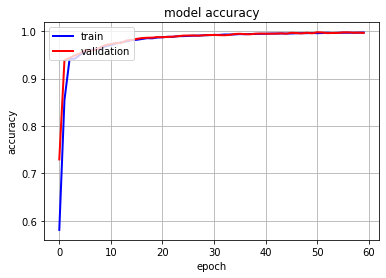

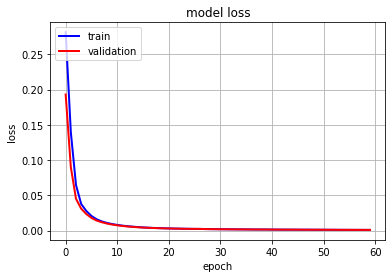

In [ ]:
plothist(history_B64LSTM)
plothist_loss(history_B64LSTM)

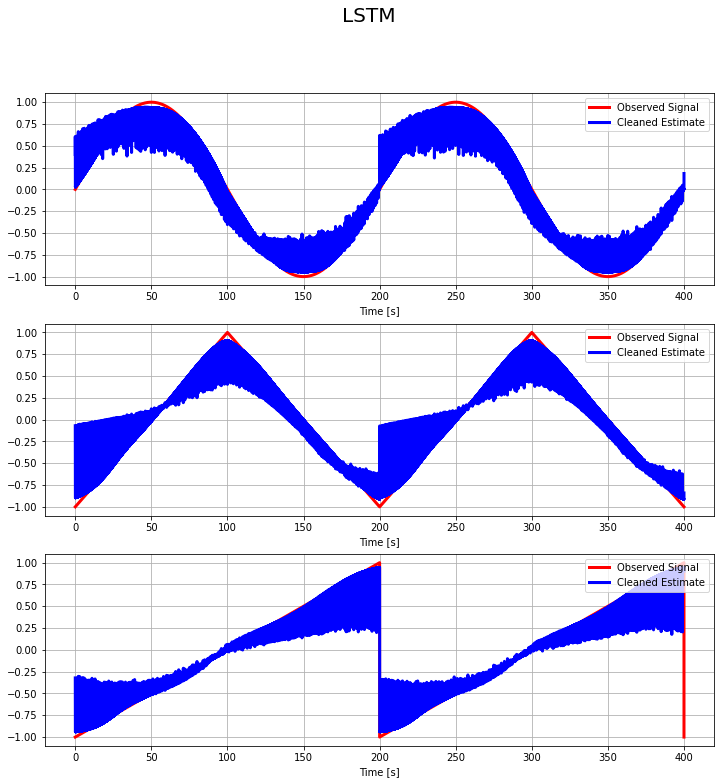

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('LSTM', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

In [ ]:
print('sin')
print(f'SNR Sin Signal is {SNRsystem(sin,noisy_sin)} dB')
print(f'SNR Sin Signal(output of LSTM) is {SNRsystem(sin_test.flatten(),sin_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Triangel')
print(f'SNR Triangle Signal is {SNRsystem(triangle,noisy_triangle)} dB')
print(f'SNR Triangle Signal(output of LSTM) is {SNRsystem(triangle_test.flatten(),triangle_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Saw thooth')
print(f'SNR Saw thooth Signal is {SNRsystem(saw_tooth,noisy_saw_tooth)} dB')
print(f'SNR Saw thooth Signal(output of LSTM) is {SNRsystem(saw_tooth_test.flatten(),saw_tooth_pred.flatten() )} dB')
print('*******************************************************************************************')

sin
SNR Sin Signal is -3.0090335959117236 dB
SNR Sin Signal(output of LSTM) is 26.685354317251438 dB
*******************************************************************************************
Triangel
SNR Triangle Signal is -4.775017889783561 dB
SNR Triangle Signal(output of LSTM) is 24.898437453895298 dB
*******************************************************************************************
Saw thooth
SNR Saw thooth Signal is -4.755652589697009 dB
SNR Saw thooth Signal(output of LSTM) is 28.557591745448114 dB
*******************************************************************************************


**LSTM**
* Optimizer: ADAM
* Learning Rate: 0.01
* Loss Function: MSE
* Batch Size: 128
* Number of Epochs:60

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_B128LSTM=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=128, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
11/11 [==============================] - 4s 183ms/step - loss: 0.4125 - accuracy: 0.3010 - val_loss: 0.3589 - val_accuracy: 0.5017
Epoch 2/60
11/11 [==============================] - 1s 130ms/step - loss: 0.3184 - accuracy: 0.5939 - val_loss: 0.2687 - val_accuracy: 0.6978
Epoch 3/60
11/11 [==============================] - 1s 130ms/step - loss: 0.2283 - accuracy: 0.7671 - val_loss: 0.1814 - val_accuracy: 0.8439
Epoch 4/60
11/11 [==============================] - 1s 131ms/step - loss: 0.1508 - accuracy: 0.8594 - val_loss: 0.1212 - val_accuracy: 0.8530
Epoch 5/60
11/11 [==============================] - 1s 130ms/step - loss: 0.1068 - accuracy: 0.8507 - val_loss: 0.0926 - val_accuracy: 0.8506
Epoch 6/60
11/11 [==============================] - 1s 130ms/step - loss: 0.0844 - accuracy: 0.8534 - val_loss: 0.0759 - val_accuracy: 0.8646
Epoch 7/60
11/11 [==============================] - 1s 129ms/step - loss: 0.0696 - accuracy: 0.8796 - val_loss: 0.0616 - val_accuracy: 0.8858
Epoch 

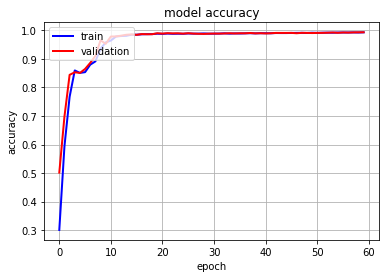

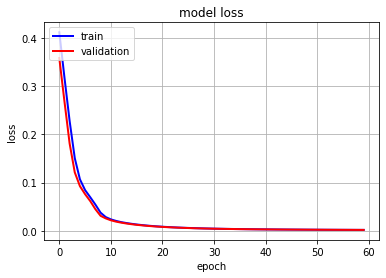

In [ ]:
plothist(history_B128LSTM)
plothist_loss(history_B128LSTM)

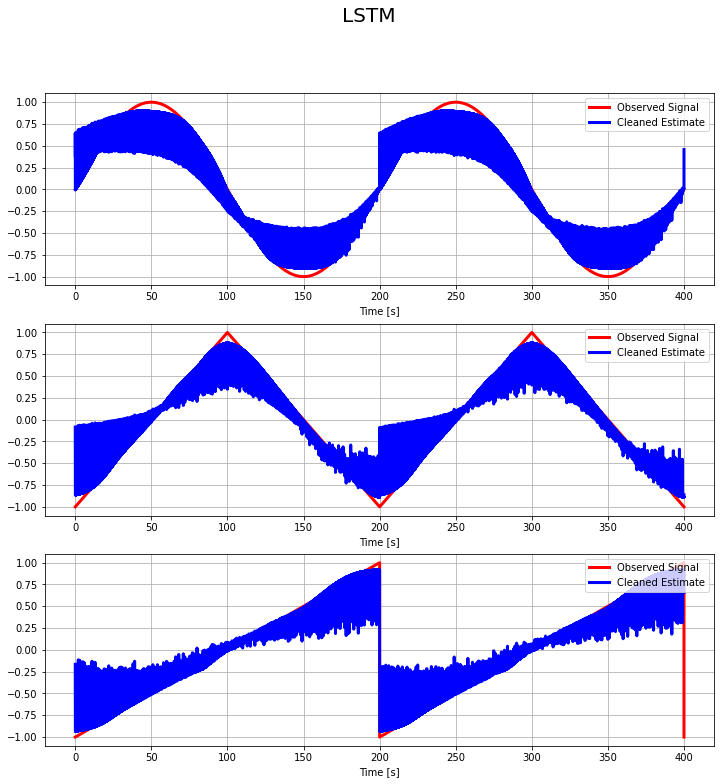

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('LSTM', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

In [ ]:
print('sin')
print(f'SNR Sin Signal is {SNRsystem(sin,noisy_sin)} dB')
print(f'SNR Sin Signal(output of LSTM) is {SNRsystem(sin_test.flatten(),sin_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Triangel')
print(f'SNR Triangle Signal is {SNRsystem(triangle,noisy_triangle)} dB')
print(f'SNR Triangle Signal(output of LSTM) is {SNRsystem(triangle_test.flatten(),triangle_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Saw thooth')
print(f'SNR Saw thooth Signal is {SNRsystem(saw_tooth,noisy_saw_tooth)} dB')
print(f'SNR Saw thooth Signal(output of LSTM) is {SNRsystem(saw_tooth_test.flatten(),saw_tooth_pred.flatten() )} dB')
print('*******************************************************************************************')

sin
SNR Sin Signal is -3.0090335959117236 dB
SNR Sin Signal(output of LSTM) is 22.45876326274093 dB
*******************************************************************************************
Triangel
SNR Triangle Signal is -4.775017889783561 dB
SNR Triangle Signal(output of LSTM) is 23.185493202142705 dB
*******************************************************************************************
Saw thooth
SNR Saw thooth Signal is -4.755652589697009 dB
SNR Saw thooth Signal(output of LSTM) is 26.3261451445419 dB
*******************************************************************************************


**Comparing Batch size (B=16,32,64,128) in LSTM**

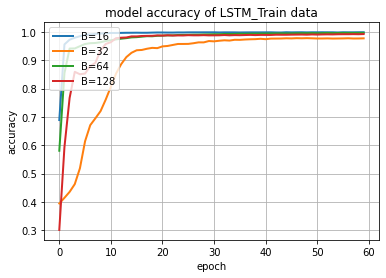

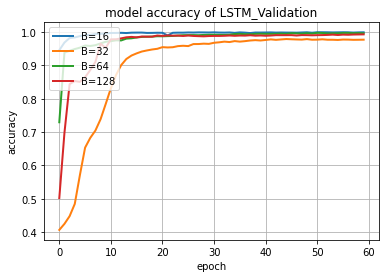

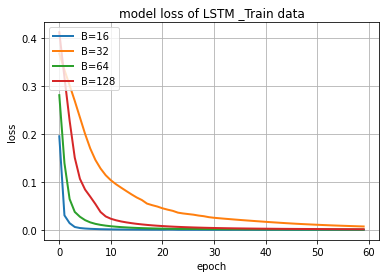

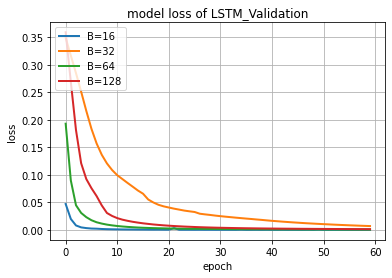

In [ ]:
plt.plot(history_B16LSTM.history['accuracy'],linewidth=2.0)
plt.plot(history_1DLSTM.history['accuracy'],linewidth=2.0)
plt.plot(history_B64LSTM.history['accuracy'],linewidth=2.0)
plt.plot(history_B128LSTM.history['accuracy'],linewidth=2.0)

plt.title('model accuracy of LSTM_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_B16LSTM.history['val_accuracy'],linewidth=2.0)
plt.plot(history_1DLSTM.history['val_accuracy'],linewidth=2.0)
plt.plot(history_B64LSTM.history['val_accuracy'],linewidth=2.0)
plt.plot(history_B128LSTM.history['val_accuracy'],linewidth=2.0)


plt.title('model accuracy of LSTM_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_B16LSTM.history['loss'],linewidth=2.0)
plt.plot(history_1DLSTM.history['loss'],linewidth=2.0)
plt.plot(history_B64LSTM.history['loss'],linewidth=2.0)
plt.plot(history_B128LSTM.history['loss'],linewidth=2.0)

plt.title('model loss of LSTM _Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_B16LSTM.history['val_loss'],linewidth=2.0)
plt.plot(history_1DLSTM.history['val_loss'],linewidth=2.0)
plt.plot(history_B64LSTM.history['val_loss'],linewidth=2.0)
plt.plot(history_B128LSTM.history['val_loss'],linewidth=2.0)

plt.title('model loss of LSTM_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

**Changing Batch Size in RNN**

**Untile now, we trained the network with batch size of 16 and 32, now we will train the model with batch size of 64 and 128, after that we'll compare these networks.**

**RNN**
* Optimizer: ADAM
* Learning Rate: 0.01
* Loss Function: MSE
* Batch Size: 64
* Number of Epochs:60

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.SimpleRNN(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_B64RNN=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=64, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
22/22 [==============================] - 36s 2s/step - loss: 0.8276 - accuracy: 0.2544 - val_loss: 0.6588 - val_accuracy: 0.3116
Epoch 2/60
22/22 [==============================] - 38s 2s/step - loss: 0.5035 - accuracy: 0.3767 - val_loss: 0.3596 - val_accuracy: 0.4320
Epoch 3/60
22/22 [==============================] - 45s 2s/step - loss: 0.2887 - accuracy: 0.3964 - val_loss: 0.2259 - val_accuracy: 0.4448
Epoch 4/60
22/22 [==============================] - 39s 2s/step - loss: 0.1895 - accuracy: 0.6263 - val_loss: 0.1546 - val_accuracy: 0.7395
Epoch 5/60
22/22 [==============================] - 46s 2s/step - loss: 0.1312 - accuracy: 0.7718 - val_loss: 0.1082 - val_accuracy: 0.8031
Epoch 6/60
22/22 [==============================] - 53s 2s/step - loss: 0.0926 - accuracy: 0.8278 - val_loss: 0.0780 - val_accuracy: 0.8510
Epoch 7/60
22/22 [==============================] - 43s 2s/step - loss: 0.0691 - accuracy: 0.8701 - val_loss: 0.0613 - val_accuracy: 0.8900
Epoch 8/60
22/22 [==

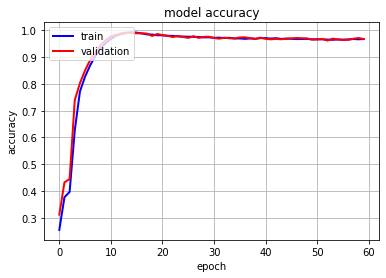

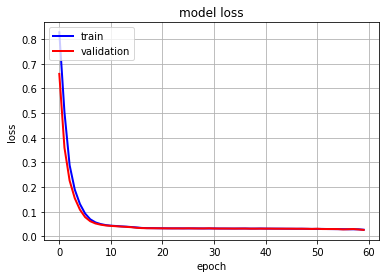

In [ ]:
plothist(history_B64RNN)
plothist_loss(history_B64RNN)

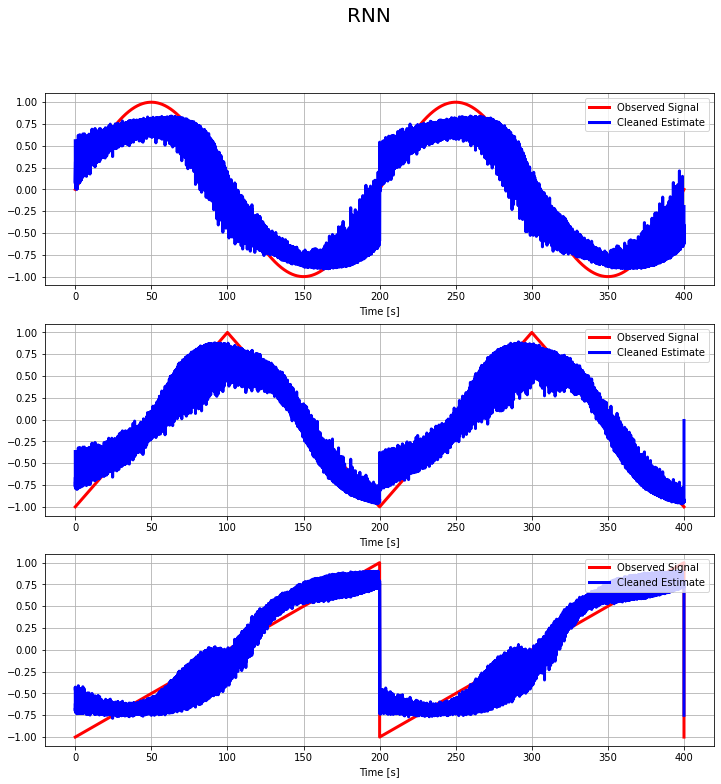

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('RNN', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

In [ ]:
print('sin')
print(f'SNR Sin Signal is {SNRsystem(sin,noisy_sin)} dB')
print(f'SNR Sin Signal(output of LSTM) is {SNRsystem(sin_test.flatten(),sin_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Triangel')
print(f'SNR Triangle Signal is {SNRsystem(triangle,noisy_triangle)} dB')
print(f'SNR Triangle Signal(output of LSTM) is {SNRsystem(triangle_test.flatten(),triangle_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Saw thooth')
print(f'SNR Saw thooth Signal is {SNRsystem(saw_tooth,noisy_saw_tooth)} dB')
print(f'SNR Saw thooth Signal(output of LSTM) is {SNRsystem(saw_tooth_test.flatten(),saw_tooth_pred.flatten() )} dB')
print('*******************************************************************************************')

sin
SNR Sin Signal is -3.0090335959117236 dB
SNR Sin Signal(output of LSTM) is 10.045646787376937 dB
*******************************************************************************************
Triangel
SNR Triangle Signal is -4.775017889783561 dB
SNR Triangle Signal(output of LSTM) is 11.88931571059899 dB
*******************************************************************************************
Saw thooth
SNR Saw thooth Signal is -4.755652589697009 dB
SNR Saw thooth Signal(output of LSTM) is 11.521537626405639 dB
*******************************************************************************************


**RNN**
* Optimizer: ADAM
* Learning Rate: 0.01
* Loss Function: MSE
* Batch Size: 128
* Number of Epochs:60

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.SimpleRNN(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_B128RNN=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=128, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
11/11 [==============================] - 13s 1s/step - loss: 0.7521 - accuracy: 0.3881 - val_loss: 0.6985 - val_accuracy: 0.4401
Epoch 2/60
11/11 [==============================] - 12s 1s/step - loss: 0.6538 - accuracy: 0.4788 - val_loss: 0.5996 - val_accuracy: 0.5227
Epoch 3/60
11/11 [==============================] - 12s 1s/step - loss: 0.5430 - accuracy: 0.5620 - val_loss: 0.4666 - val_accuracy: 0.6138
Epoch 4/60
11/11 [==============================] - 12s 1s/step - loss: 0.3922 - accuracy: 0.6602 - val_loss: 0.3032 - val_accuracy: 0.7089
Epoch 5/60
11/11 [==============================] - 12s 1s/step - loss: 0.2388 - accuracy: 0.7351 - val_loss: 0.1702 - val_accuracy: 0.7634
Epoch 6/60
11/11 [==============================] - 12s 1s/step - loss: 0.1321 - accuracy: 0.7861 - val_loss: 0.1022 - val_accuracy: 0.8227
Epoch 7/60
11/11 [==============================] - 12s 1s/step - loss: 0.0953 - accuracy: 0.8607 - val_loss: 0.0870 - val_accuracy: 0.8861
Epoch 8/60
11/11 [==

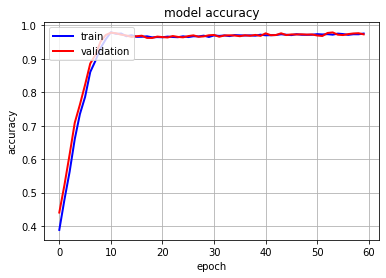

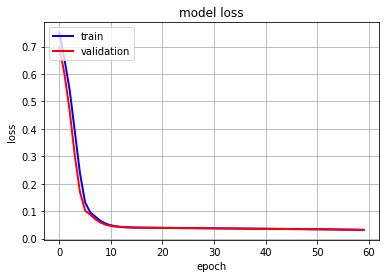

In [ ]:
plothist(history_B128RNN)
plothist_loss(history_B128RNN)

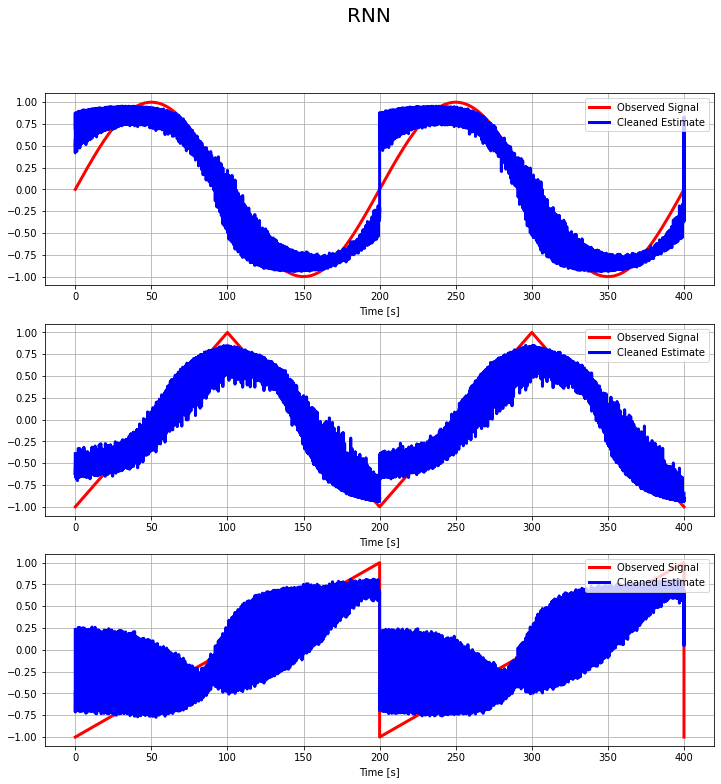

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('RNN', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

In [ ]:
print('sin')
print(f'SNR Sin Signal is {SNRsystem(sin,noisy_sin)} dB')
print(f'SNR Sin Signal(output of LSTM) is {SNRsystem(sin_test.flatten(),sin_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Triangel')
print(f'SNR Triangle Signal is {SNRsystem(triangle,noisy_triangle)} dB')
print(f'SNR Triangle Signal(output of LSTM) is {SNRsystem(triangle_test.flatten(),triangle_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Saw thooth')
print(f'SNR Saw thooth Signal is {SNRsystem(saw_tooth,noisy_saw_tooth)} dB')
print(f'SNR Saw thooth Signal(output of LSTM) is {SNRsystem(saw_tooth_test.flatten(),saw_tooth_pred.flatten() )} dB')
print('*******************************************************************************************')

sin
SNR Sin Signal is -3.0090335959117236 dB
SNR Sin Signal(output of LSTM) is 10.648801248509635 dB
*******************************************************************************************
Triangel
SNR Triangle Signal is -4.775017889783561 dB
SNR Triangle Signal(output of LSTM) is 10.71113276655019 dB
*******************************************************************************************
Saw thooth
SNR Saw thooth Signal is -4.755652589697009 dB
SNR Saw thooth Signal(output of LSTM) is 8.473344517632707 dB
*******************************************************************************************


**Comparing Batch size (B=16,32,64,128) in RNN**

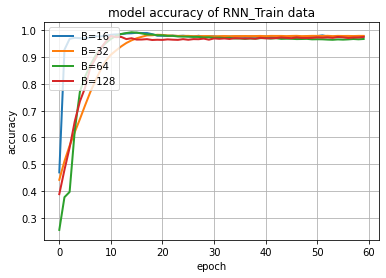

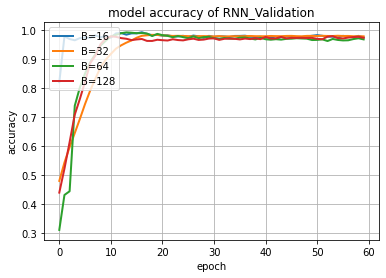

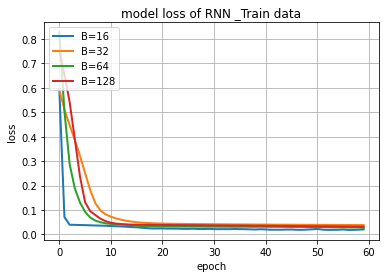

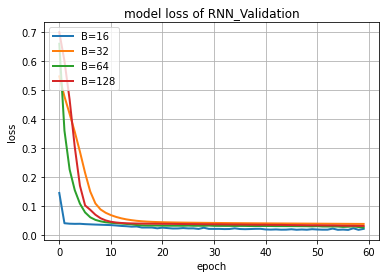

In [ ]:
plt.plot(history_B16RNN.history['accuracy'],linewidth=2.0)
plt.plot(history_1DRNN.history['accuracy'],linewidth=2.0)
plt.plot(history_B64RNN.history['accuracy'],linewidth=2.0)
plt.plot(history_B128RNN.history['accuracy'],linewidth=2.0)

plt.title('model accuracy of RNN_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_B16RNN.history['val_accuracy'],linewidth=2.0)
plt.plot(history_1DRNN.history['val_accuracy'],linewidth=2.0)
plt.plot(history_B64RNN.history['val_accuracy'],linewidth=2.0)
plt.plot(history_B128RNN.history['val_accuracy'],linewidth=2.0)


plt.title('model accuracy of RNN_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_B16RNN.history['loss'],linewidth=2.0)
plt.plot(history_1DRNN.history['loss'],linewidth=2.0)
plt.plot(history_B64RNN.history['loss'],linewidth=2.0)
plt.plot(history_B128RNN.history['loss'],linewidth=2.0)

plt.title('model loss of RNN _Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_B16RNN.history['val_loss'],linewidth=2.0)
plt.plot(history_1DRNN.history['val_loss'],linewidth=2.0)
plt.plot(history_B64RNN.history['val_loss'],linewidth=2.0)
plt.plot(history_B128RNN.history['val_loss'],linewidth=2.0)

plt.title('model loss of RNN_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

## **د.3: Changing Number of Epochs**

**Epoch=20,60,100; LSTM**

**LSTM**
* Optimizer: ADAM
* Learning Rate: 0.01
* Loss Function: MSE
* Batch Size: 128
* Number of Epochs:100

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_e100LSTM=model.fit(x_train, y_train, epochs=100, validation_data=(x_valid, y_valid), batch_size=128, verbose=0)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Evaluation with Test Set:
Test loss: 0.029999393969774246
Test acc: 0.9937524795532227


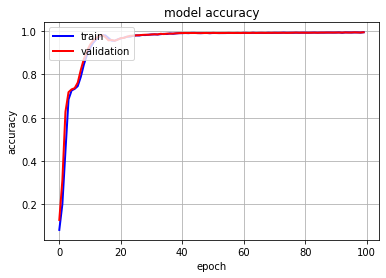

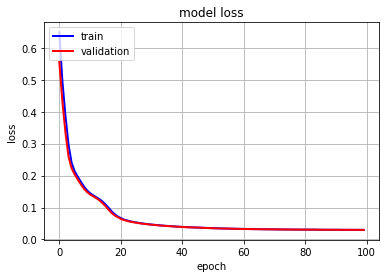

In [ ]:
plothist(history_e100LSTM)
plothist_loss(history_e100LSTM)

**LSTM**
* Optimizer: ADAM
* Learning Rate: 0.01
* Loss Function: MSE
* Batch Size: 128
* Number of Epochs:20

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_e20LSTM=model.fit(x_train, y_train, epochs=20, validation_data=(x_valid, y_valid), batch_size=128, verbose=0)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Evaluation with Test Set:
Test loss: 0.047593336552381516
Test acc: 0.9655100107192993


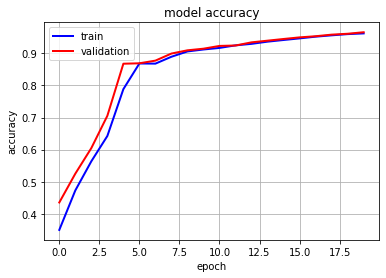

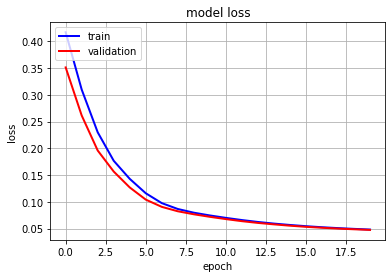

In [ ]:
plothist(history_e20LSTM)
plothist_loss(history_e20LSTM)

**Comparing Number of Epoches in LSTM(20,60,100)**

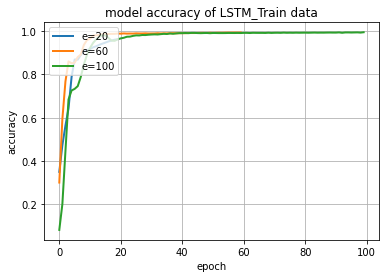

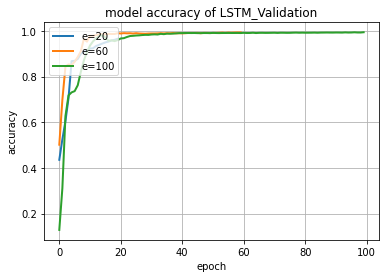

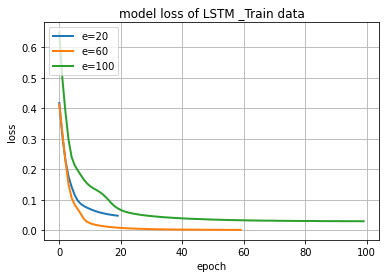

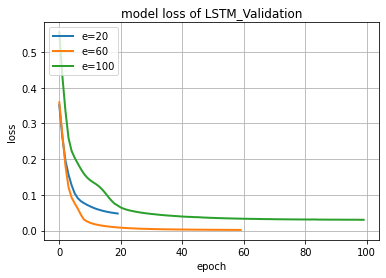

In [ ]:
plt.plot(history_e20LSTM.history['accuracy'],linewidth=2.0)
plt.plot(history_B128LSTM.history['accuracy'],linewidth=2.0)
plt.plot(history_e100LSTM.history['accuracy'],linewidth=2.0)


plt.title('model accuracy of LSTM_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_e20LSTM.history['val_accuracy'],linewidth=2.0)
plt.plot(history_B128LSTM.history['val_accuracy'],linewidth=2.0)
plt.plot(history_e100LSTM.history['val_accuracy'],linewidth=2.0)


plt.title('model accuracy of LSTM_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_e20LSTM.history['loss'],linewidth=2.0)
plt.plot(history_B128LSTM.history['loss'],linewidth=2.0)
plt.plot(history_e100LSTM.history['loss'],linewidth=2.0)

plt.title('model loss of LSTM _Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_e20LSTM.history['val_loss'],linewidth=2.0)
plt.plot(history_B128LSTM.history['val_loss'],linewidth=2.0)
plt.plot(history_e100LSTM.history['val_loss'],linewidth=2.0)

plt.title('model loss of LSTM_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

**RNN**
* Optimizer: ADAM
* Learning Rate: 0.01
* Loss Function: MSE
* Batch Size: 128
* Number of Epochs:100

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.SimpleRNN(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_e100RNN=model.fit(x_train, y_train, epochs=100, validation_data=(x_valid, y_valid), batch_size=128, verbose=0)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Evaluation with Test Set:
Test loss: 0.02455550990998745
Test acc: 0.9742799997329712


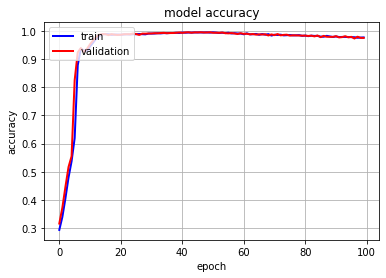

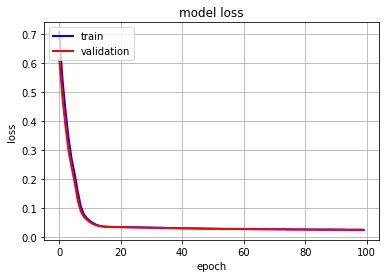

In [ ]:
plothist(history_e100RNN)
plothist_loss(history_e100RNN)

**RNN**
* Optimizer: ADAM
* Learning Rate: 0.01
* Loss Function: MSE
* Batch Size: 128
* Number of Epochs:20

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.SimpleRNN(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_e20RNN=model.fit(x_train, y_train, epochs=20, validation_data=(x_valid, y_valid), batch_size=128, verbose=0)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Evaluation with Test Set:
Test loss: 0.04121338948607445
Test acc: 0.9890400171279907


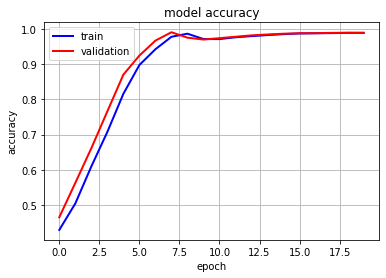

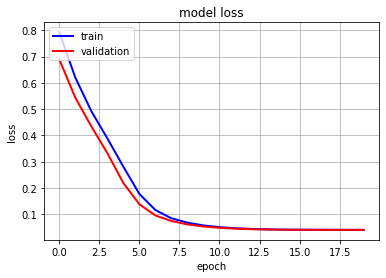

In [ ]:
plothist(history_e20RNN)
plothist_loss(history_e20RNN)

**Comparing Number of Epoches in RNN(20,60,100)**

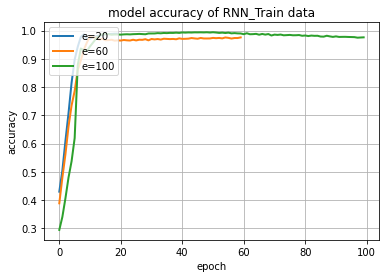

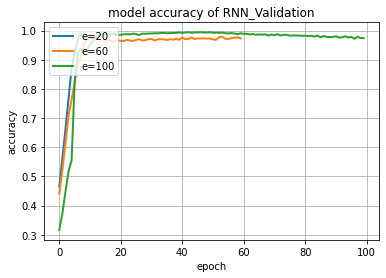

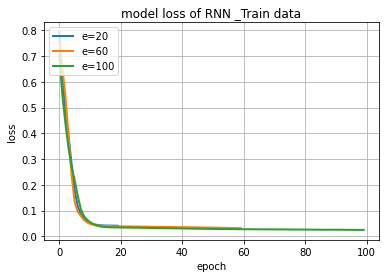

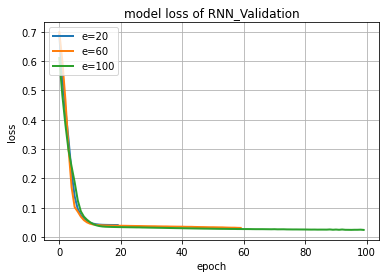

In [ ]:
plt.plot(history_e20RNN.history['accuracy'],linewidth=2.0)
plt.plot(history_B128RNN.history['accuracy'],linewidth=2.0)
plt.plot(history_e100RNN.history['accuracy'],linewidth=2.0)


plt.title('model accuracy of RNN_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_e20RNN.history['val_accuracy'],linewidth=2.0)
plt.plot(history_B128RNN.history['val_accuracy'],linewidth=2.0)
plt.plot(history_e100RNN.history['val_accuracy'],linewidth=2.0)


plt.title('model accuracy of RNN_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_e20RNN.history['loss'],linewidth=2.0)
plt.plot(history_B128RNN.history['loss'],linewidth=2.0)
plt.plot(history_e100RNN.history['loss'],linewidth=2.0)

plt.title('model loss of RNN _Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_e20RNN.history['val_loss'],linewidth=2.0)
plt.plot(history_B128RNN.history['val_loss'],linewidth=2.0)
plt.plot(history_e100RNN.history['val_loss'],linewidth=2.0)

plt.title('model loss of RNN_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

## **د.4 : Generating noisy signals with varience=1,100,200 and train LSTM and RNN**

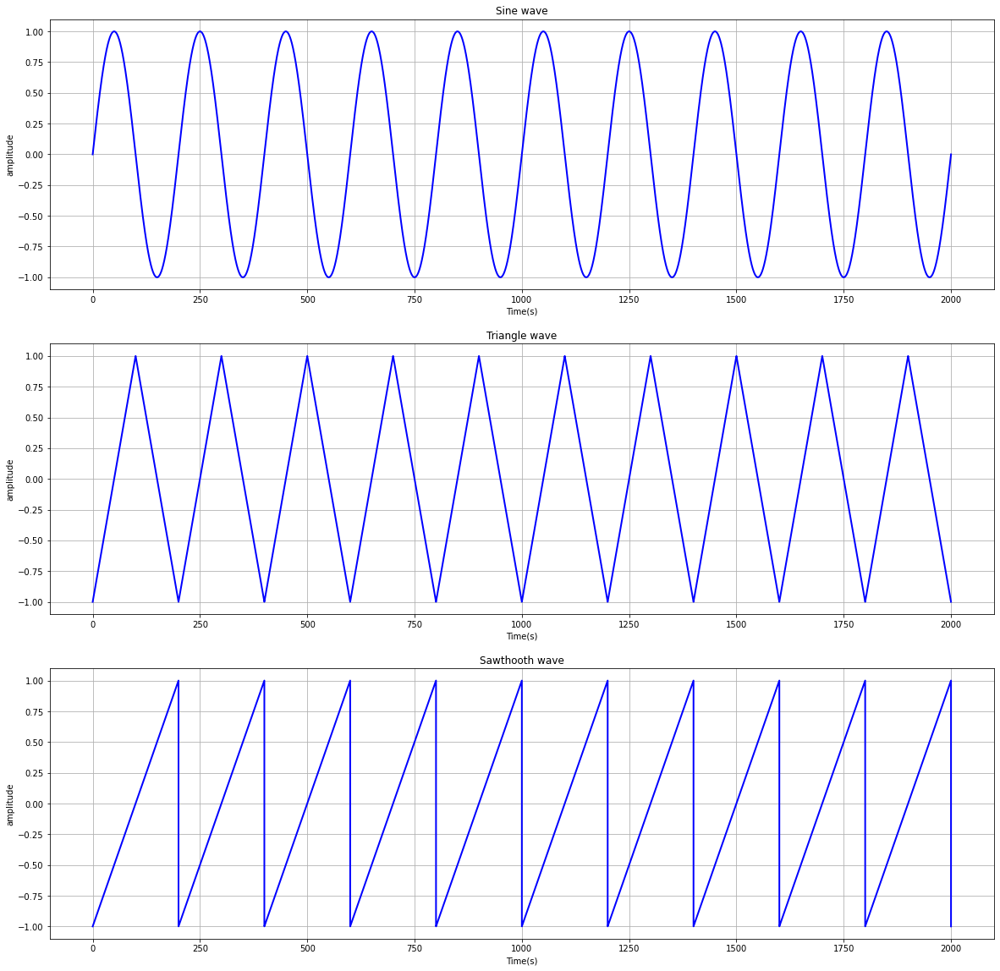

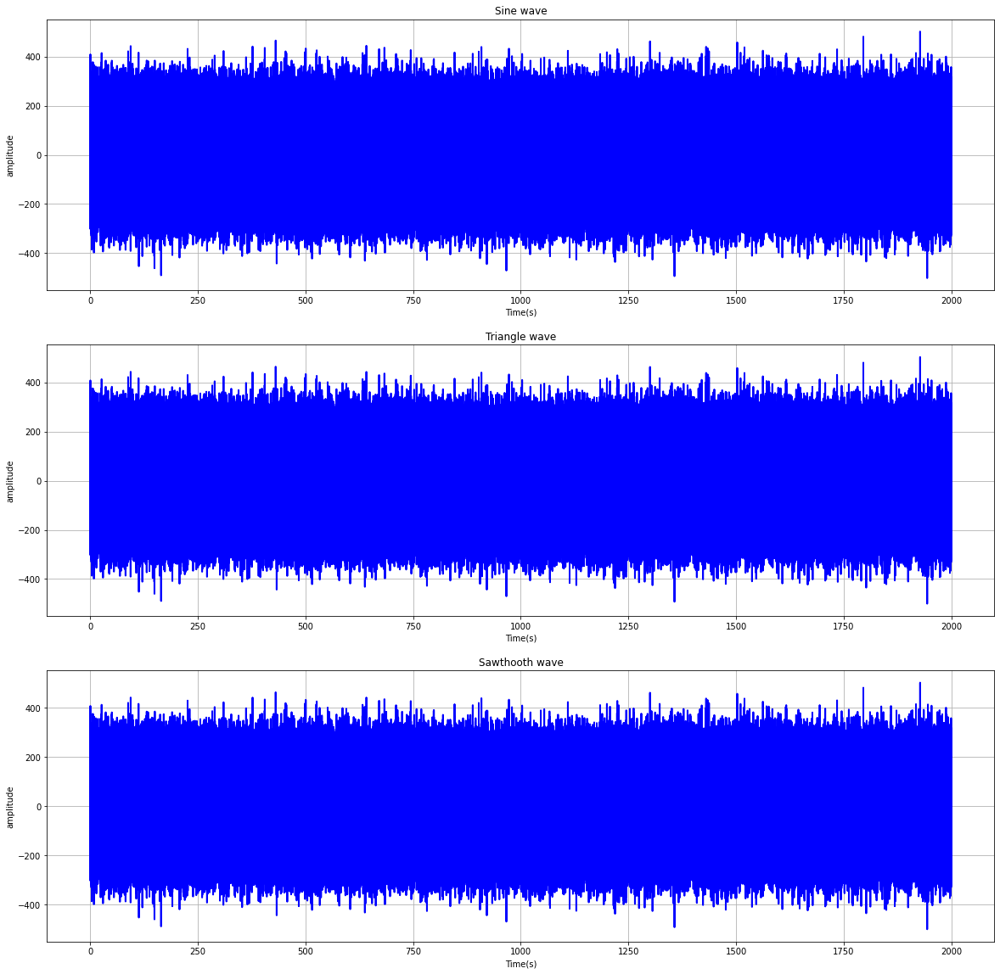

In [ ]:
dur        = 2000        # Second
sample_rate= 1000
freq       = 1/200       #Hz, each periods of these waves is 200 second
T          = 200         #Second

# time, 2000 seconds
t = np.linspace(0, dur, dur*sample_rate)

#true signals 
sin       = np.sin(2*np.pi*freq * t)
saw_tooth = signal.sawtooth(2 * np.pi * freq * t)
triangle  = signal.sawtooth(2 * np.pi * freq * t,0.5)

# gaussian noise with mean=0 and variance=1
noise = np.random.normal(0,100,len(sin))

# signals with noise
noisy_sin       = sin       + noise
noisy_saw_tooth = saw_tooth + noise
noisy_triangle  = triangle  + noise



#plotting the true waves
plt.figure(figsize=(20,20))
plt.subplot(3,1,1)
plt.plot(t,sin,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Sine wave')
plt.grid()

plt.subplot(3,1,2)
plt.plot(t,triangle,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Triangle wave')
plt.grid()

plt.subplot(3,1,3)
plt.plot(t,saw_tooth,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Sawthooth wave')
plt.grid()

#plotting noisy signals
plt.figure(figsize=(20,20))
plt.subplot(3,1,1)
plt.plot(t,noisy_sin,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Sine wave')
plt.grid()

plt.subplot(3,1,2)
plt.plot(t,noisy_triangle,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Triangle wave')
plt.grid()

plt.subplot(3,1,3)
plt.plot(t,noisy_saw_tooth,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Sawthooth wave')
plt.grid()




**Splitting dataset**

In [ ]:
true_signal = np.array([sin,triangle,saw_tooth]).T
noisy_signal= np.array([noisy_sin,noisy_triangle,noisy_saw_tooth]).T
print('Shape of signal')
print(true_signal.shape)

# splitting data into 1 second chunks for our 3 signals
input_data  = np.zeros((dur, sample_rate, 3)) # (2000, 1000, 3)
target_data = np.zeros((dur, sample_rate,3)) # (2000, 1000, 3)
for i in range(dur):
    st = i*sample_rate
    et = (i+1)*sample_rate
    input_data[i,:]  = noisy_signal [st:et]
    target_data[i,:] = true_signal  [st:et]

# each period of these signals is 200 seconds; so
# 7 periods for training data
# train on 7*200 = 1400 seconds
ts=7*T
x_train = input_data[:ts, :]
y_train = target_data[:ts, :]


# 1 periods for validation data
# train on 1*200 = 200 seconds
x_valid = input_data [ts:ts+T, :]
y_valid = target_data[ts:ts+T, :]

# test data is the rest of data 
t_test=dur-(ts+T)
x_test = input_data [ts+T:, :]
y_test = target_data[ts+T:, :]
########

print('x_train, y_train', x_train.shape, y_train.shape)
print('x_valid, y_valid', x_valid.shape, y_valid.shape)
print('x_test, y_test', x_test.shape, y_test.shape)

Shape of signal
(2000000, 3)
x_train, y_train (1400, 1000, 3) (1400, 1000, 3)
x_valid, y_valid (200, 1000, 3) (200, 1000, 3)
x_test, y_test (400, 1000, 3) (400, 1000, 3)


**LSTM Network**

**Parameters and Hyper-Parameters**
* Optimizer: ADAM
* Loss Function: MSE
* Learning Rate:0.001
* Batch Size: 32
* Number of Epochs : 60 

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer='adam',metrics=['accuracy'])


# Train
history_1DLSTM=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=32, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
44/44 [==============================] - 10s 134ms/step - loss: 0.5723 - accuracy: 0.2690 - val_loss: 0.5612 - val_accuracy: 0.2690
Epoch 2/60
44/44 [==============================] - 6s 128ms/step - loss: 0.5088 - accuracy: 0.2693 - val_loss: 0.4849 - val_accuracy: 0.2693
Epoch 3/60
44/44 [==============================] - 5s 121ms/step - loss: 0.4788 - accuracy: 0.2695 - val_loss: 0.4723 - val_accuracy: 0.2695
Epoch 4/60
44/44 [==============================] - 5s 121ms/step - loss: 0.4495 - accuracy: 0.2731 - val_loss: 0.4094 - val_accuracy: 0.2793
Epoch 5/60
44/44 [==============================] - 5s 122ms/step - loss: 0.3870 - accuracy: 0.3423 - val_loss: 0.3727 - val_accuracy: 0.3776
Epoch 6/60
44/44 [==============================] - 5s 121ms/step - loss: 0.3630 - accuracy: 0.4647 - val_loss: 0.3567 - val_accuracy: 0.4404
Epoch 7/60
44/44 [==============================] - 5s 121ms/step - loss: 0.3585 - accuracy: 0.4328 - val_loss: 0.3551 - val_accuracy: 0.4263
Epoch

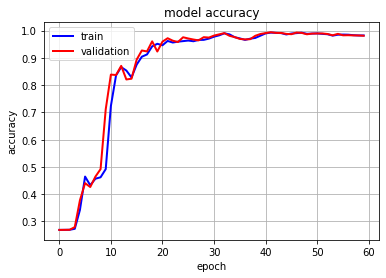

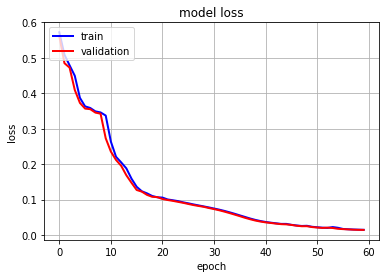

In [ ]:
plothist(history_1DLSTM)
plothist_loss(history_1DLSTM)

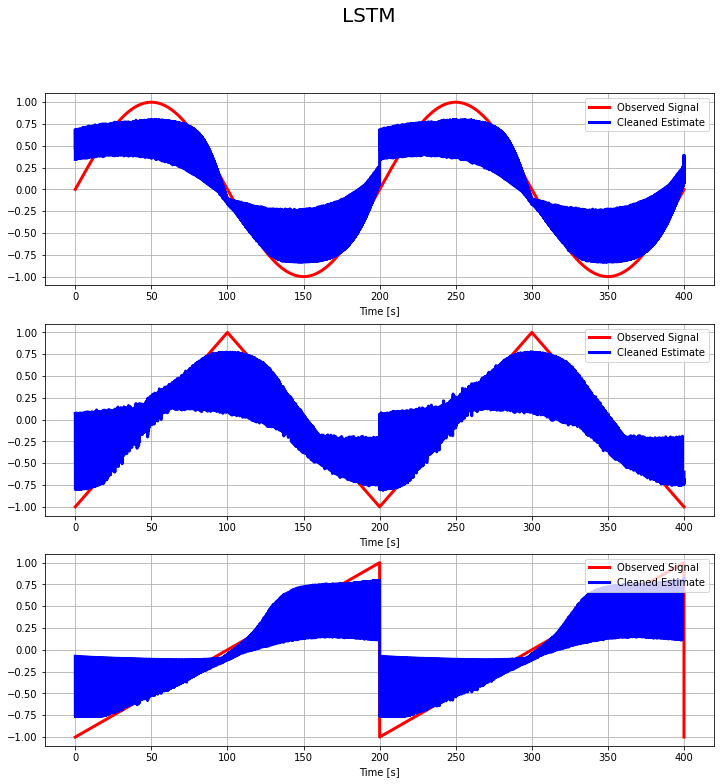

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('LSTM', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

**RNN Network**

**Parameters and Hyper-Parameters**
* Optimizer: ADAM
* Loss Function: MSE
* Learning Rate:0.001
* Batch Size: 32
* Number of Epochs : 60 

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This RNN will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.SimpleRNN(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer='adam',metrics=['accuracy'])


# Train
history_1DRNN=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=32, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
44/44 [==============================] - 43s 920ms/step - loss: 1.3612 - accuracy: 0.3448 - val_loss: 1.3431 - val_accuracy: 0.3327
Epoch 2/60
44/44 [==============================] - 39s 881ms/step - loss: 1.1892 - accuracy: 0.3103 - val_loss: 1.0762 - val_accuracy: 0.3017
Epoch 3/60
44/44 [==============================] - 40s 911ms/step - loss: 1.0535 - accuracy: 0.3027 - val_loss: 1.0375 - val_accuracy: 0.3020
Epoch 4/60
44/44 [==============================] - 40s 906ms/step - loss: 1.0271 - accuracy: 0.3031 - val_loss: 1.0169 - val_accuracy: 0.3022
Epoch 5/60
44/44 [==============================] - 39s 886ms/step - loss: 1.0088 - accuracy: 0.3036 - val_loss: 1.0006 - val_accuracy: 0.3033
Epoch 6/60
44/44 [==============================] - 40s 906ms/step - loss: 0.9916 - accuracy: 0.3056 - val_loss: 0.9773 - val_accuracy: 0.3083
Epoch 7/60
44/44 [==============================] - 39s 882ms/step - loss: 0.7903 - accuracy: 0.3778 - val_loss: 0.6190 - val_accuracy: 0.3946

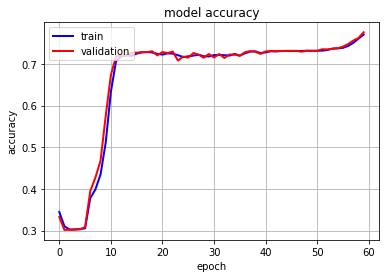

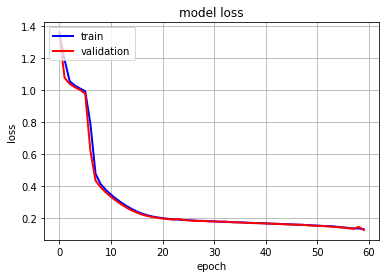

In [ ]:
plothist(history_1DRNN)
plothist_loss(history_1DRNN)

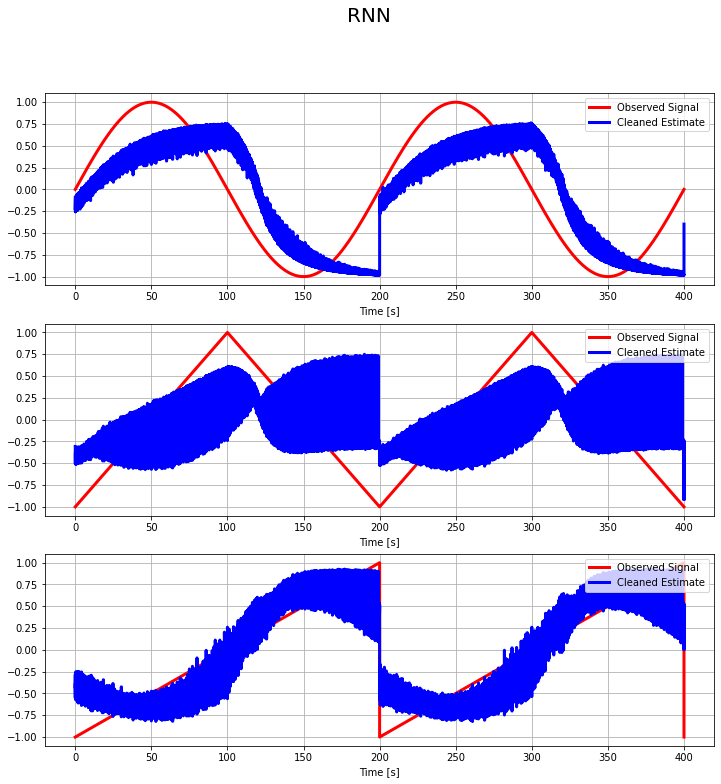

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('RNN', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

**Comparing RNN and LSTM**

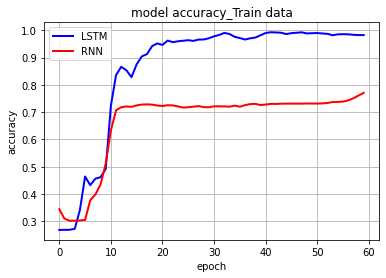

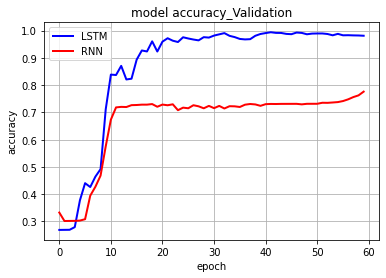

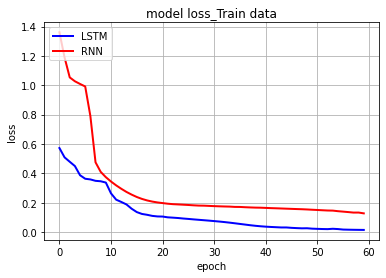

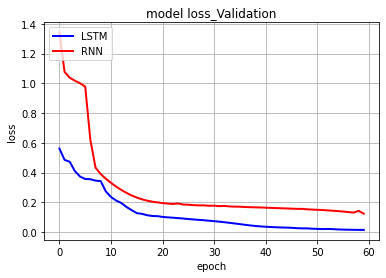

In [ ]:
plt.plot(history_1DLSTM.history['accuracy'],color='b',linewidth=2.0)
plt.plot(history_1DRNN.history['accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['LSTM', 'RNN'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DLSTM.history['val_accuracy'],color='b',linewidth=2.0)
plt.plot(history_1DRNN.history['val_accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['LSTM', 'RNN'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DLSTM.history['loss'],color='b',linewidth=2.0)
plt.plot(history_1DRNN.history['loss'],color='r',linewidth=2.0)

plt.title('model loss_Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['LSTM', 'RNN'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DLSTM.history['val_loss'],color='b',linewidth=2.0)
plt.plot(history_1DRNN.history['val_loss'],color='r',linewidth=2.0)

plt.title('model loss_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['LSTM', 'RNN'], loc='upper left')
plt.grid()
plt.show()

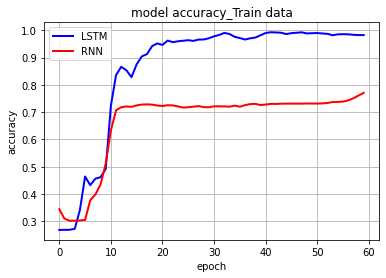

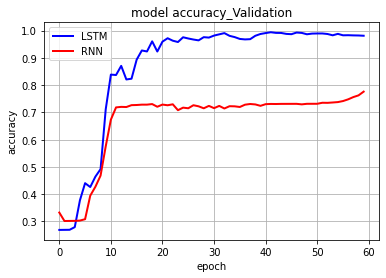

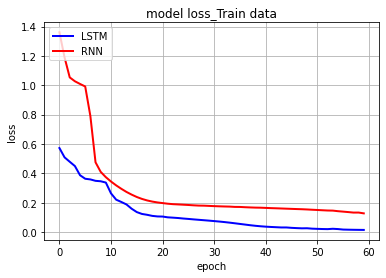

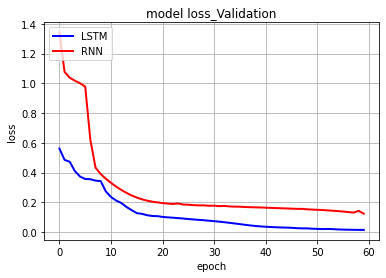

In [ ]:
plt.plot(history_1DLSTM.history['accuracy'],color='b',linewidth=2.0)
plt.plot(history_1DRNN.history['accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['LSTM', 'RNN'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DLSTM.history['val_accuracy'],color='b',linewidth=2.0)
plt.plot(history_1DRNN.history['val_accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['LSTM', 'RNN'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DLSTM.history['loss'],color='b',linewidth=2.0)
plt.plot(history_1DRNN.history['loss'],color='r',linewidth=2.0)

plt.title('model loss_Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['LSTM', 'RNN'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DLSTM.history['val_loss'],color='b',linewidth=2.0)
plt.plot(history_1DRNN.history['val_loss'],color='r',linewidth=2.0)

plt.title('model loss_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['LSTM', 'RNN'], loc='upper left')
plt.grid()
plt.show()

**Changing Varience=200 and train the LSTM and RNN**

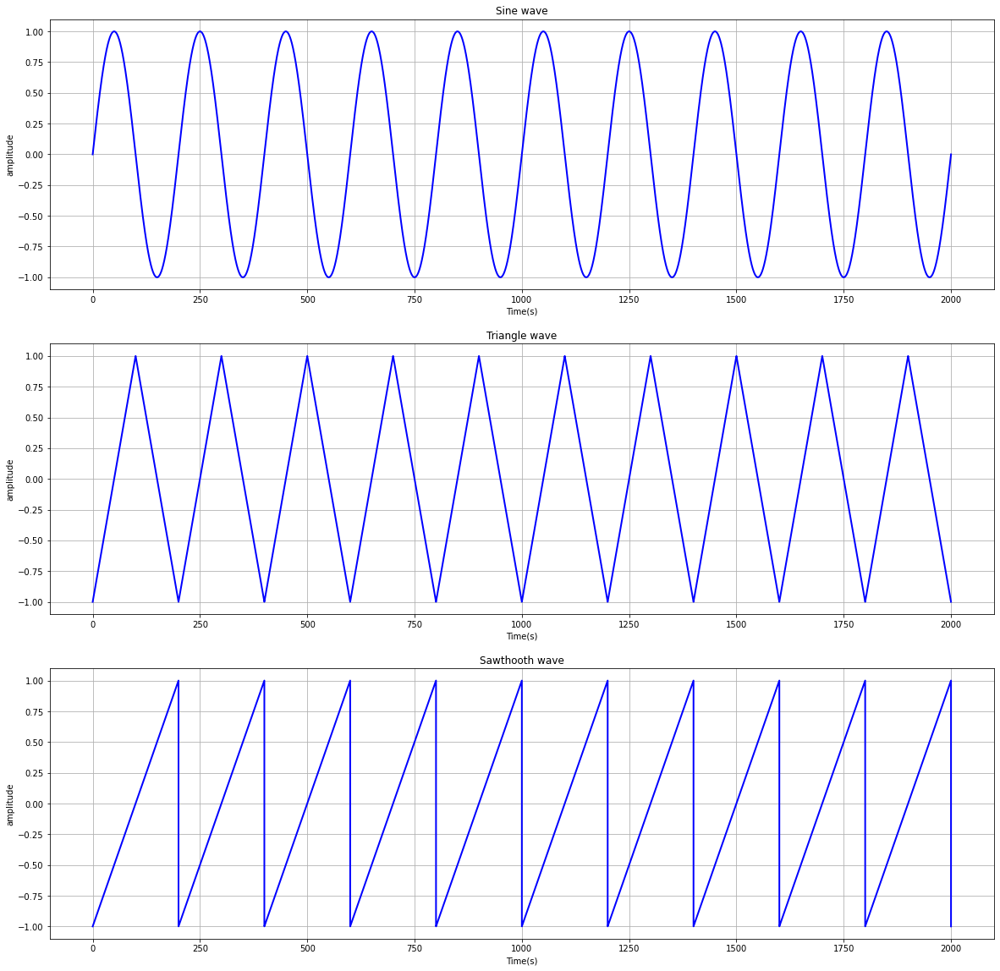

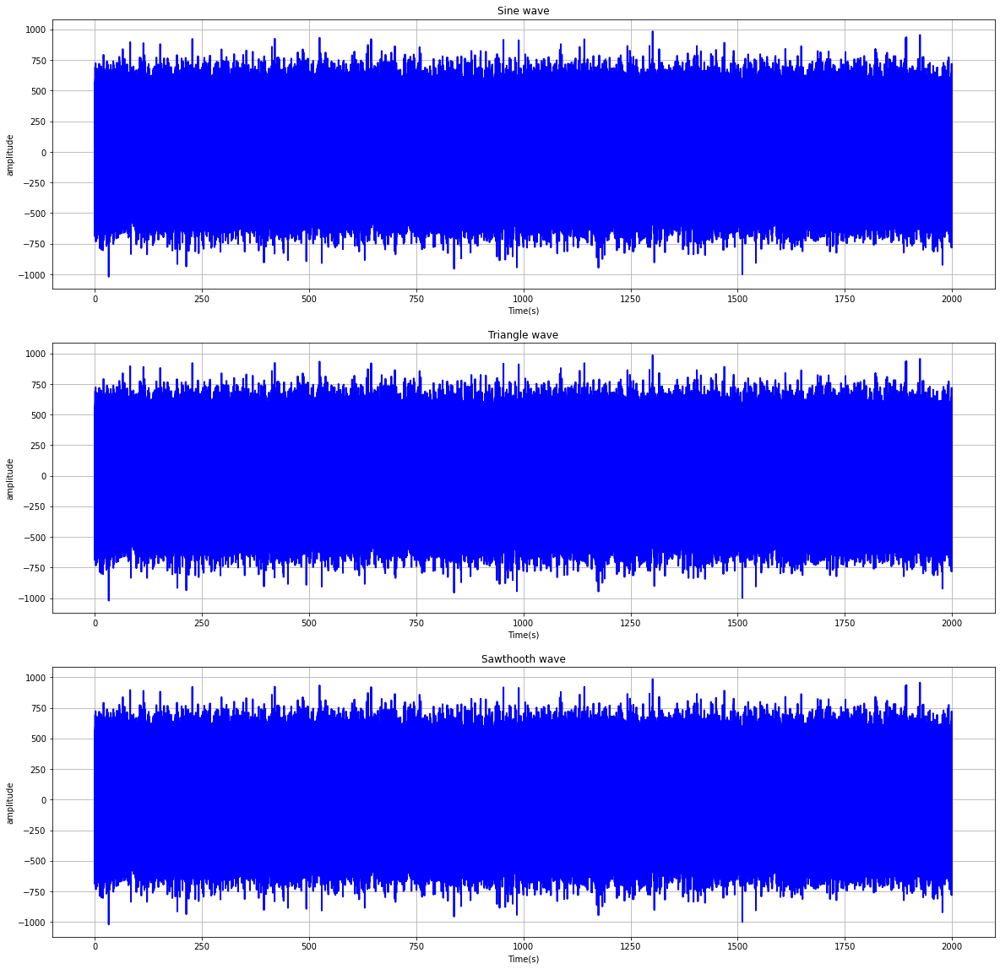

In [ ]:
dur        = 2000        # Second
sample_rate= 1000
freq       = 1/200       #Hz, each periods of these waves is 200 second
T          = 200         #Second

# time, 2000 seconds
t = np.linspace(0, dur, dur*sample_rate)

#true signals 
sin       = np.sin(2*np.pi*freq * t)
saw_tooth = signal.sawtooth(2 * np.pi * freq * t)
triangle  = signal.sawtooth(2 * np.pi * freq * t,0.5)

# gaussian noise with mean=0 and variance=1
noise = np.random.normal(0,200,len(sin))

# signals with noise
noisy_sin       = sin       + noise
noisy_saw_tooth = saw_tooth + noise
noisy_triangle  = triangle  + noise



#plotting the true waves
plt.figure(figsize=(20,20))
plt.subplot(3,1,1)
plt.plot(t,sin,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Sine wave')
plt.grid()

plt.subplot(3,1,2)
plt.plot(t,triangle,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Triangle wave')
plt.grid()

plt.subplot(3,1,3)
plt.plot(t,saw_tooth,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Sawthooth wave')
plt.grid()

#plotting noisy signals
plt.figure(figsize=(20,20))
plt.subplot(3,1,1)
plt.plot(t,noisy_sin,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Sine wave')
plt.grid()

plt.subplot(3,1,2)
plt.plot(t,noisy_triangle,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Triangle wave')
plt.grid()

plt.subplot(3,1,3)
plt.plot(t,noisy_saw_tooth,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Sawthooth wave')
plt.grid()




**Splitting dataset**

In [ ]:
true_signal = np.array([sin,triangle,saw_tooth]).T
noisy_signal= np.array([noisy_sin,noisy_triangle,noisy_saw_tooth]).T
print('Shape of signal')
print(true_signal.shape)

# splitting data into 1 second chunks for our 3 signals
input_data  = np.zeros((dur, sample_rate, 3)) # (2000, 1000, 3)
target_data = np.zeros((dur, sample_rate,3)) # (2000, 1000, 3)
for i in range(dur):
    st = i*sample_rate
    et = (i+1)*sample_rate
    input_data[i,:]  = noisy_signal [st:et]
    target_data[i,:] = true_signal  [st:et]

# each period of these signals is 200 seconds; so
# 7 periods for training data
# train on 7*200 = 1400 seconds
ts=7*T
x_train = input_data[:ts, :]
y_train = target_data[:ts, :]


# 1 periods for validation data
# train on 1*200 = 200 seconds
x_valid = input_data [ts:ts+T, :]
y_valid = target_data[ts:ts+T, :]

# test data is the rest of data 
t_test=dur-(ts+T)
x_test = input_data [ts+T:, :]
y_test = target_data[ts+T:, :]
########

print('x_train, y_train', x_train.shape, y_train.shape)
print('x_valid, y_valid', x_valid.shape, y_valid.shape)
print('x_test, y_test', x_test.shape, y_test.shape)

Shape of signal
(2000000, 3)
x_train, y_train (1400, 1000, 3) (1400, 1000, 3)
x_valid, y_valid (200, 1000, 3) (200, 1000, 3)
x_test, y_test (400, 1000, 3) (400, 1000, 3)


In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer='adam',metrics=['accuracy'])


# Train
history_L2=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=32, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
44/44 [==============================] - 8s 131ms/step - loss: 0.6087 - accuracy: 0.3336 - val_loss: 0.6020 - val_accuracy: 0.3334
Epoch 2/60
44/44 [==============================] - 5s 119ms/step - loss: 0.5553 - accuracy: 0.3334 - val_loss: 0.5345 - val_accuracy: 0.3334
Epoch 3/60
44/44 [==============================] - 5s 119ms/step - loss: 0.4780 - accuracy: 0.3461 - val_loss: 0.4433 - val_accuracy: 0.3847
Epoch 4/60
44/44 [==============================] - 5s 120ms/step - loss: 0.4373 - accuracy: 0.3610 - val_loss: 0.4258 - val_accuracy: 0.3682
Epoch 5/60
44/44 [==============================] - 5s 118ms/step - loss: 0.4241 - accuracy: 0.3786 - val_loss: 0.4107 - val_accuracy: 0.3834
Epoch 6/60
44/44 [==============================] - 5s 119ms/step - loss: 0.3728 - accuracy: 0.4502 - val_loss: 0.3492 - val_accuracy: 0.5153
Epoch 7/60
44/44 [==============================] - 5s 119ms/step - loss: 0.3334 - accuracy: 0.5219 - val_loss: 0.3196 - val_accuracy: 0.5434
Epoch 

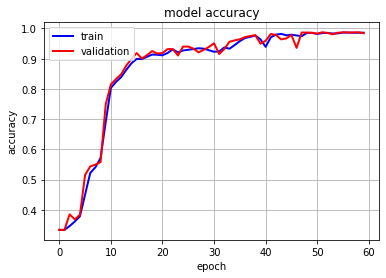

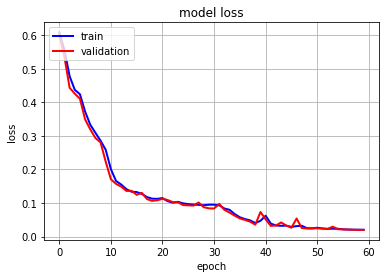

In [ ]:
plothist(history_L2)
plothist_loss(history_L2)

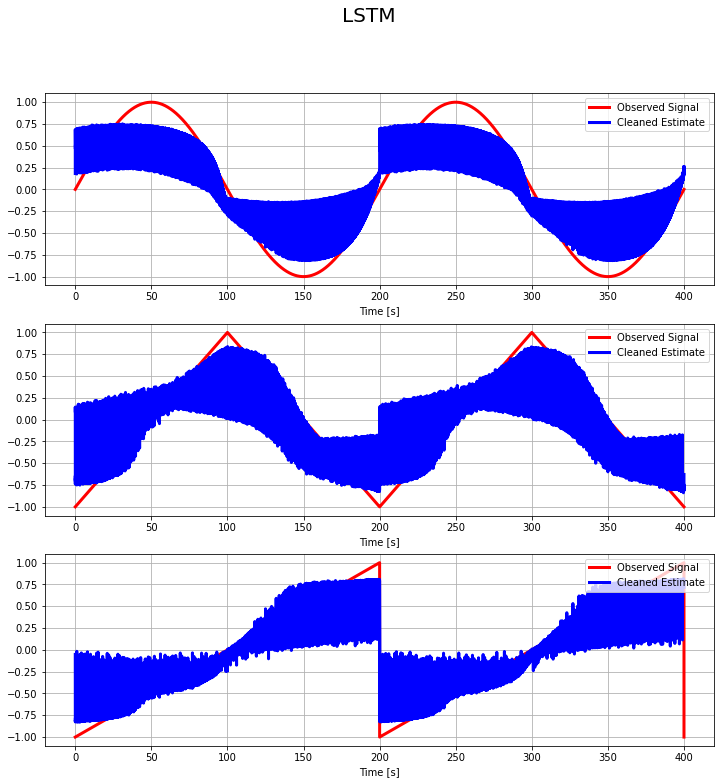

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('LSTM', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This RNN will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.SimpleRNN(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer='adam',metrics=['accuracy'])


# Train
history_R2=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=32, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
44/44 [==============================] - 40s 898ms/step - loss: 1.3567 - accuracy: 0.3421 - val_loss: 1.3477 - val_accuracy: 0.3340
Epoch 2/60
44/44 [==============================] - 40s 901ms/step - loss: 1.3374 - accuracy: 0.3331 - val_loss: 1.3289 - val_accuracy: 0.3342
Epoch 3/60
44/44 [==============================] - 39s 889ms/step - loss: 1.3237 - accuracy: 0.3334 - val_loss: 1.3184 - val_accuracy: 0.3341
Epoch 4/60
44/44 [==============================] - 40s 921ms/step - loss: 1.3143 - accuracy: 0.3340 - val_loss: 1.3080 - val_accuracy: 0.3341
Epoch 5/60
44/44 [==============================] - 39s 885ms/step - loss: 1.2104 - accuracy: 0.2721 - val_loss: 1.1544 - val_accuracy: 0.2364
Epoch 6/60
44/44 [==============================] - 39s 894ms/step - loss: 1.1452 - accuracy: 0.2384 - val_loss: 1.1356 - val_accuracy: 0.2355
Epoch 7/60
44/44 [==============================] - 39s 889ms/step - loss: 1.1288 - accuracy: 0.2333 - val_loss: 1.1217 - val_accuracy: 0.2292

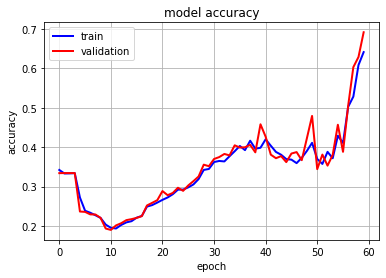

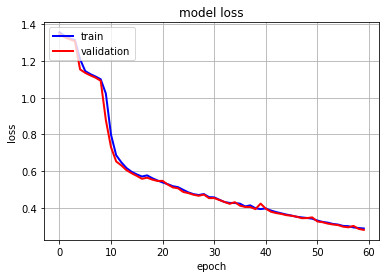

In [ ]:
plothist(history_R2)
plothist_loss(history_R2)

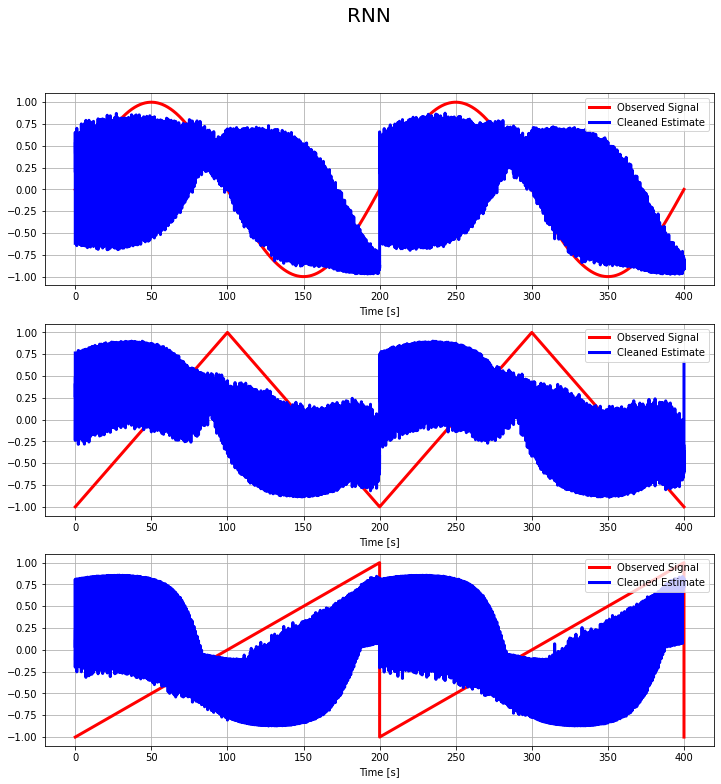

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('RNN', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

##**د.5: Comparing different varience(var=1,100,200)**

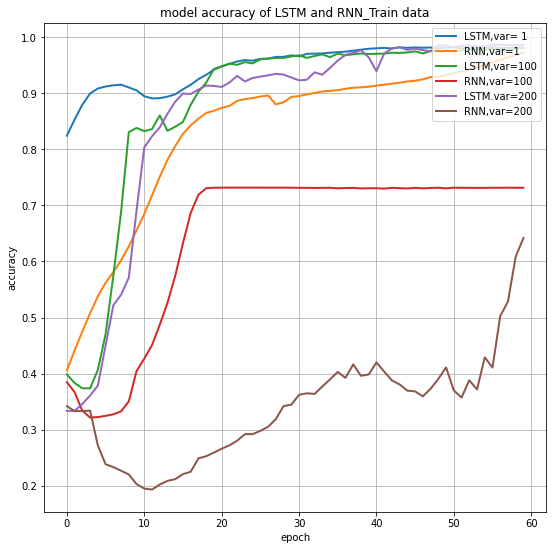

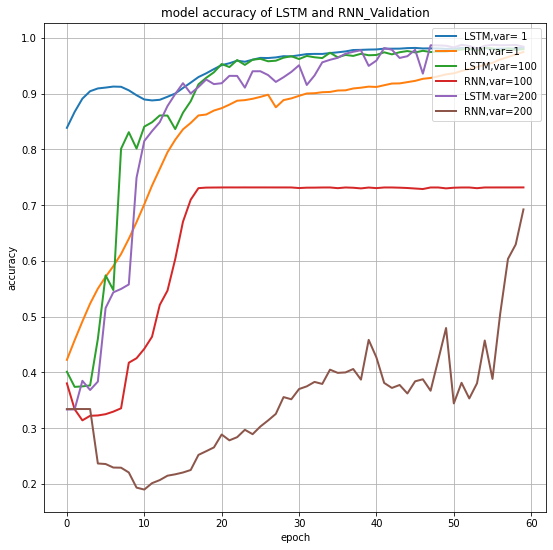

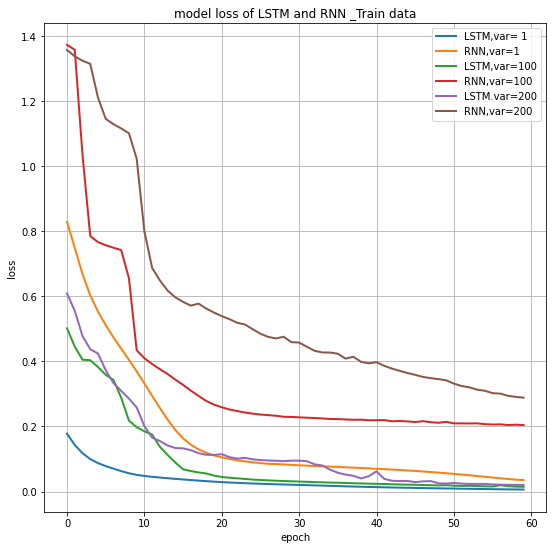

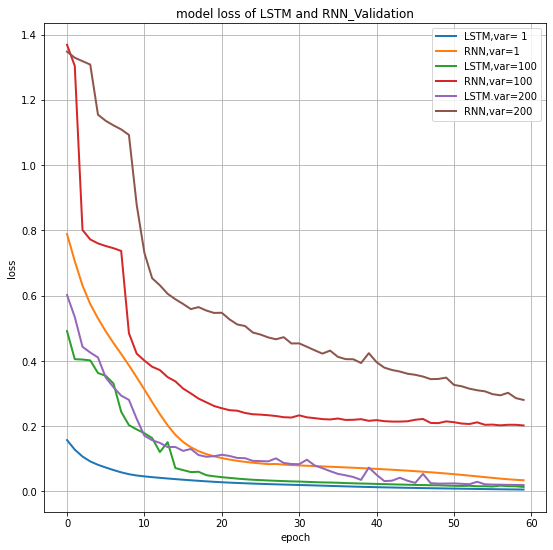

In [ ]:
plt.figure(figsize=(9,9))
plt.plot(history_L1.history['accuracy'],linewidth=2.0)
plt.plot(history_R1.history['accuracy'],linewidth=2.0)
plt.plot(history_L100.history['accuracy'],linewidth=2.0)
plt.plot(history_R100.history['accuracy'],linewidth=2.0)
plt.plot(history_L2.history['accuracy'],linewidth=2.0)
plt.plot(history_R2.history['accuracy'],linewidth=2.0)

plt.title('model accuracy of LSTM and RNN_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['LSTM,var= 1', 'RNN,var=1','LSTM,var=100','RNN,var=100','LSTM.var=200','RNN,var=200'], loc='upper right')
plt.grid()
plt.show()

plt.figure(figsize=(9,9))
plt.plot(history_L1.history['val_accuracy'],linewidth=2.0)
plt.plot(history_R1.history['val_accuracy'],linewidth=2.0)
plt.plot(history_L100.history['val_accuracy'],linewidth=2.0)
plt.plot(history_R100.history['val_accuracy'],linewidth=2.0)
plt.plot(history_L2.history['val_accuracy'],linewidth=2.0)
plt.plot(history_R2.history['val_accuracy'],linewidth=2.0)

plt.title('model accuracy of LSTM and RNN_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['LSTM,var= 1', 'RNN,var=1','LSTM,var=100','RNN,var=100','LSTM.var=200','RNN,var=200'], loc='upper right')
plt.grid()
plt.show()

plt.figure(figsize=(9,9))
plt.plot(history_L1.history['loss'],linewidth=2.0)
plt.plot(history_R1.history['loss'],linewidth=2.0)
plt.plot(history_L100.history['loss'],linewidth=2.0)
plt.plot(history_R100.history['loss'],linewidth=2.0)
plt.plot(history_L2.history['loss'],linewidth=2.0)
plt.plot(history_R2.history['loss'],linewidth=2.0)

plt.title('model loss of LSTM and RNN _Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['LSTM,var= 1', 'RNN,var=1','LSTM,var=100','RNN,var=100','LSTM.var=200','RNN,var=200'], loc='upper right')
plt.grid()
plt.show()

plt.figure(figsize=(9,9))
plt.plot(history_L1.history['val_loss'],linewidth=2.0)
plt.plot(history_R1.history['val_loss'],linewidth=2.0)
plt.plot(history_L100.history['val_loss'],linewidth=2.0)
plt.plot(history_R100.history['val_loss'],linewidth=2.0)
plt.plot(history_L2.history['val_loss'],linewidth=2.0)
plt.plot(history_R2.history['val_loss'],linewidth=2.0)

plt.title('model loss of LSTM and RNN_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['LSTM,var= 1', 'RNN,var=1','LSTM,var=100','RNN,var=100','LSTM.var=200','RNN,var=200'], loc='upper right')
plt.grid()
plt.show()

## **د.6: Changing Learning Rate for noisy signal with varience=100**

**Increasing learning Rate in LSTM**

**Parameters and Hyper-Parameters**
* Optimizer: ADAM
* Loss Function: MSE
* Learning Rate:0.01
* Batch Size: 32
* Number of Epochs : 60 

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_1RLSTM=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=32, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
44/44 [==============================] - 8s 131ms/step - loss: 0.4305 - accuracy: 0.4206 - val_loss: 0.3974 - val_accuracy: 0.3823
Epoch 2/60
44/44 [==============================] - 5s 119ms/step - loss: 0.3850 - accuracy: 0.4346 - val_loss: 0.3601 - val_accuracy: 0.4199
Epoch 3/60
44/44 [==============================] - 5s 118ms/step - loss: 0.3723 - accuracy: 0.5288 - val_loss: 0.3548 - val_accuracy: 0.4812
Epoch 4/60
44/44 [==============================] - 6s 127ms/step - loss: 0.3657 - accuracy: 0.5153 - val_loss: 0.3581 - val_accuracy: 0.4903
Epoch 5/60
44/44 [==============================] - 5s 118ms/step - loss: 0.3334 - accuracy: 0.6558 - val_loss: 0.3283 - val_accuracy: 0.6304
Epoch 6/60
44/44 [==============================] - 5s 118ms/step - loss: 0.3701 - accuracy: 0.5591 - val_loss: 0.3697 - val_accuracy: 0.5756
Epoch 7/60
44/44 [==============================] - 5s 119ms/step - loss: 0.3473 - accuracy: 0.5720 - val_loss: 0.3273 - val_accuracy: 0.5393
Epoch 

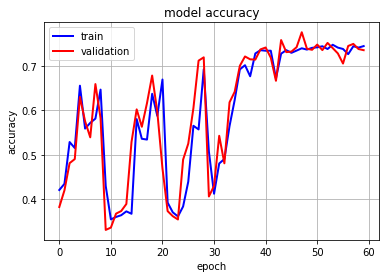

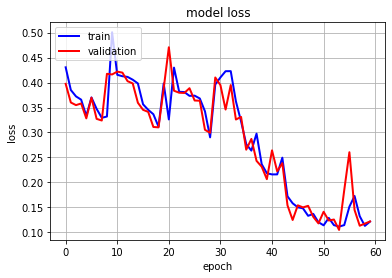

In [ ]:
plothist(history_1RLSTM)
plothist_loss(history_1RLSTM)

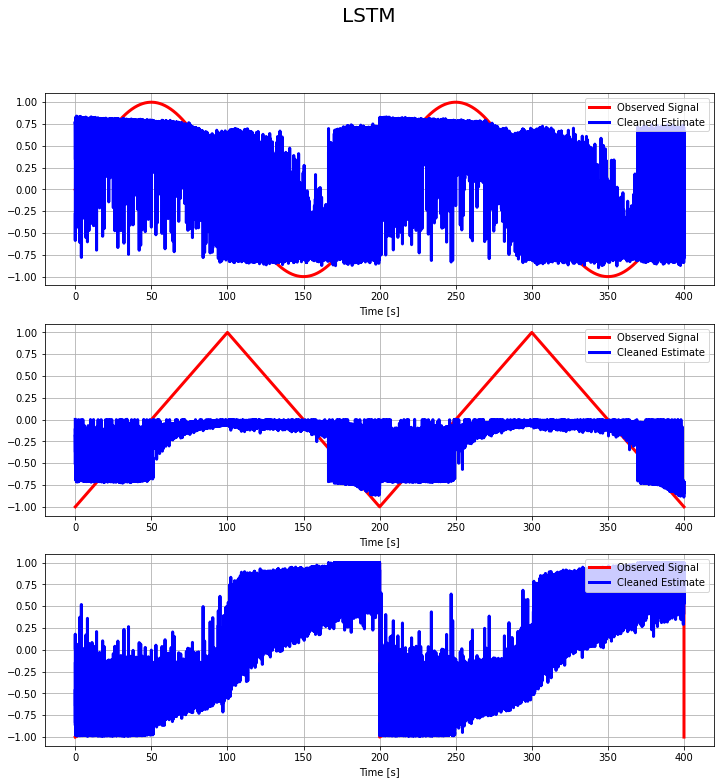

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('LSTM', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

**Comparing Learning Rate (lr=0.01,lr=0.001) in LSTM**

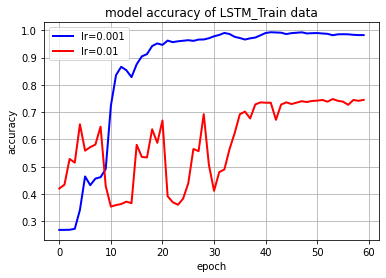

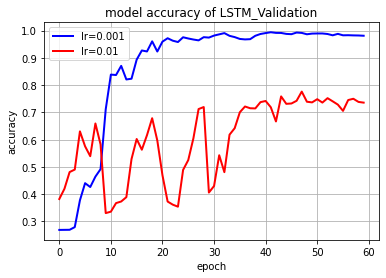

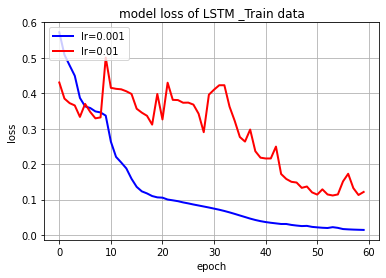

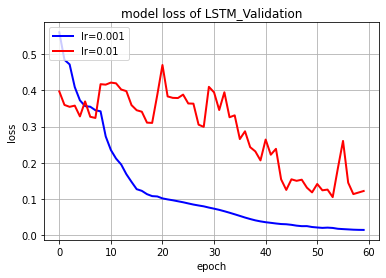

In [ ]:
plt.plot(history_1DLSTM.history['accuracy'],color='b',linewidth=2.0)
plt.plot(history_1RLSTM.history['accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy of LSTM_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DLSTM.history['val_accuracy'],color='b',linewidth=2.0)
plt.plot(history_1RLSTM.history['val_accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy of LSTM_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DLSTM.history['loss'],color='b',linewidth=2.0)
plt.plot(history_1RLSTM.history['loss'],color='r',linewidth=2.0)

plt.title('model loss of LSTM _Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DLSTM.history['val_loss'],color='b',linewidth=2.0)
plt.plot(history_1RLSTM.history['val_loss'],color='r',linewidth=2.0)

plt.title('model loss of LSTM_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

**Increasing learning Rate in RNN**

**Parameters and Hyper-Parameters**
* Optimizer: ADAM
* Loss Function: MSE
* Learning Rate:0.01
* Batch Size: 32
* Number of Epochs : 60 

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This RNN will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.SimpleRNN(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_1RRNN=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=32, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
44/44 [==============================] - 40s 884ms/step - loss: 1.0881 - accuracy: 0.3598 - val_loss: 0.7241 - val_accuracy: 0.4152
Epoch 2/60
44/44 [==============================] - 40s 921ms/step - loss: 0.5382 - accuracy: 0.5337 - val_loss: 0.3440 - val_accuracy: 0.6278
Epoch 3/60
44/44 [==============================] - 39s 895ms/step - loss: 0.3326 - accuracy: 0.6298 - val_loss: 0.2970 - val_accuracy: 0.6660
Epoch 4/60
44/44 [==============================] - 40s 901ms/step - loss: 0.3057 - accuracy: 0.6370 - val_loss: 0.2939 - val_accuracy: 0.6505
Epoch 5/60
44/44 [==============================] - 40s 906ms/step - loss: 0.2876 - accuracy: 0.6532 - val_loss: 0.2826 - val_accuracy: 0.6552
Epoch 6/60
44/44 [==============================] - 39s 897ms/step - loss: 0.2857 - accuracy: 0.6621 - val_loss: 0.2698 - val_accuracy: 0.7295
Epoch 7/60
44/44 [==============================] - 40s 900ms/step - loss: 0.2825 - accuracy: 0.6755 - val_loss: 0.2620 - val_accuracy: 0.7299

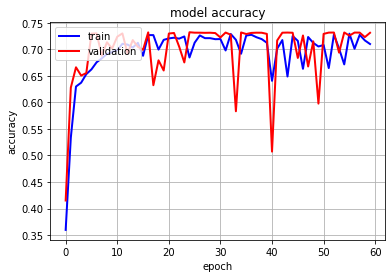

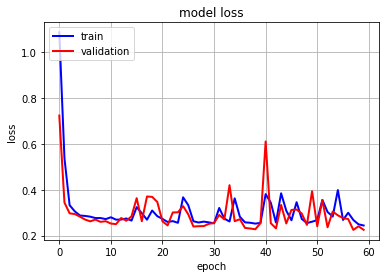

In [ ]:
plothist(history_1RRNN)
plothist_loss(history_1RRNN)

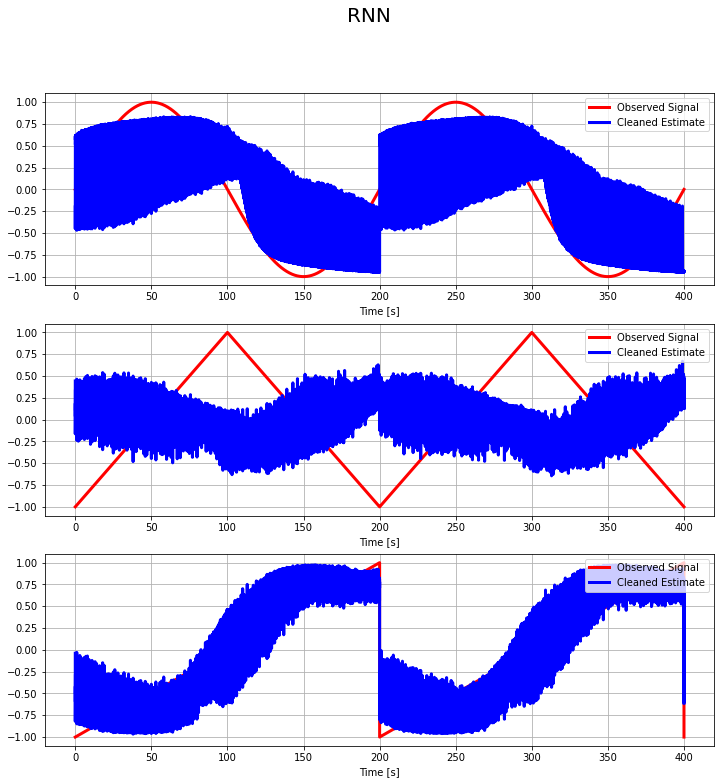

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('RNN', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

**Comparing Learning Rate (lr=0.01,lr=0.001) in RNN**

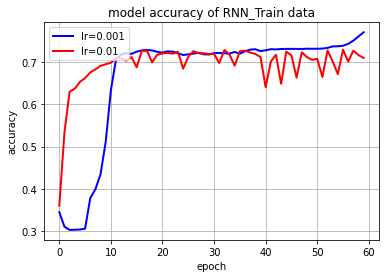

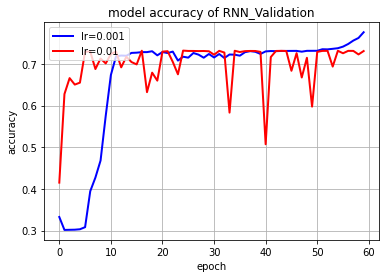

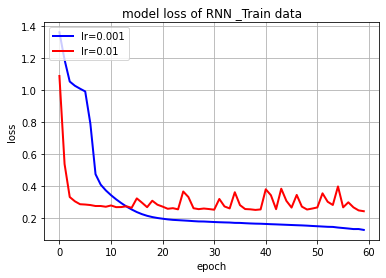

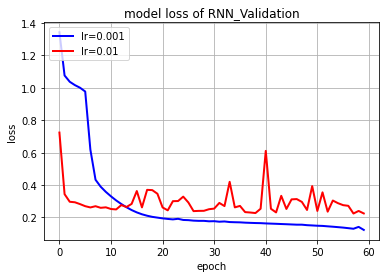

In [ ]:
plt.plot(history_1DRNN.history['accuracy'],color='b',linewidth=2.0)
plt.plot(history_1RRNN.history['accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy of RNN_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DRNN.history['val_accuracy'],color='b',linewidth=2.0)
plt.plot(history_1RRNN.history['val_accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy of RNN_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DRNN.history['loss'],color='b',linewidth=2.0)
plt.plot(history_1RRNN.history['loss'],color='r',linewidth=2.0)

plt.title('model loss of RNN _Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DRNN.history['val_loss'],color='b',linewidth=2.0)
plt.plot(history_1RRNN.history['val_loss'],color='r',linewidth=2.0)

plt.title('model loss of RNN_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

## **د.7: Changing Batch Size for noisy signal with varience=100**

**Changing Batch Size in LSTM**

**Untile now, we trained the network with batch size of 32, now we will train the model with batch size of 32,64 and 128, after that we'll compare these networks.**

**LSTM**
* Optimizer: ADAM
* Learning Rate: 0.01
* Loss Function: MSE
* Batch Size: 64
* Number of Epochs:60

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_B64LSTM=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=64, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
22/22 [==============================] - 5s 152ms/step - loss: 0.5089 - accuracy: 0.3909 - val_loss: 0.4138 - val_accuracy: 0.4769
Epoch 2/60
22/22 [==============================] - 3s 125ms/step - loss: 0.3419 - accuracy: 0.5210 - val_loss: 0.3072 - val_accuracy: 0.5771
Epoch 3/60
22/22 [==============================] - 3s 125ms/step - loss: 0.2824 - accuracy: 0.5891 - val_loss: 0.2558 - val_accuracy: 0.7626
Epoch 4/60
22/22 [==============================] - 3s 125ms/step - loss: 0.2369 - accuracy: 0.7312 - val_loss: 0.1900 - val_accuracy: 0.7462
Epoch 5/60
22/22 [==============================] - 3s 125ms/step - loss: 0.1794 - accuracy: 0.7343 - val_loss: 0.1731 - val_accuracy: 0.7342
Epoch 6/60
22/22 [==============================] - 3s 130ms/step - loss: 0.1643 - accuracy: 0.7259 - val_loss: 0.1510 - val_accuracy: 0.7315
Epoch 7/60
22/22 [==============================] - 3s 126ms/step - loss: 0.1521 - accuracy: 0.7431 - val_loss: 0.1448 - val_accuracy: 0.7754
Epoch 

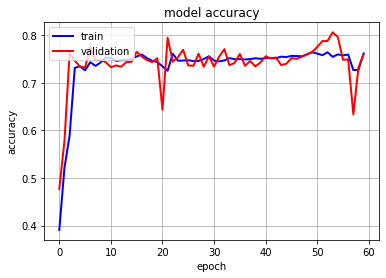

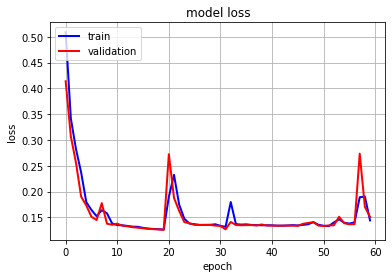

In [ ]:
plothist(history_B64LSTM)
plothist_loss(history_B64LSTM)

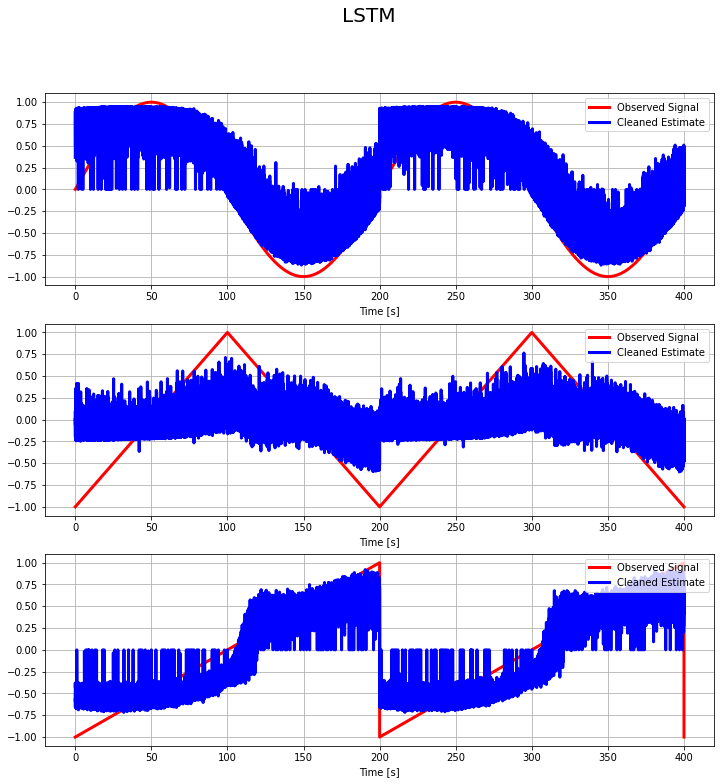

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('LSTM', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

**Batch Size=16, LSTM**

**LSTM**
* Optimizer: ADAM
* Learning Rate: 0.01
* Loss Function: MSE
* Batch Size: 16
* Number of Epochs:60

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_B16LSTM=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=16, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
88/88 [==============================] - 12s 121ms/step - loss: 0.4316 - accuracy: 0.3001 - val_loss: 0.3554 - val_accuracy: 0.3318
Epoch 2/60
88/88 [==============================] - 10s 114ms/step - loss: 0.3514 - accuracy: 0.3398 - val_loss: 0.3485 - val_accuracy: 0.3221
Epoch 3/60
88/88 [==============================] - 10s 115ms/step - loss: 0.2865 - accuracy: 0.4509 - val_loss: 0.2406 - val_accuracy: 0.4856
Epoch 4/60
88/88 [==============================] - 10s 115ms/step - loss: 0.2293 - accuracy: 0.4921 - val_loss: 0.2278 - val_accuracy: 0.5092
Epoch 5/60
88/88 [==============================] - 10s 115ms/step - loss: 0.2248 - accuracy: 0.5032 - val_loss: 0.2208 - val_accuracy: 0.5540
Epoch 6/60
88/88 [==============================] - 10s 115ms/step - loss: 0.3709 - accuracy: 0.5689 - val_loss: 0.3523 - val_accuracy: 0.5379
Epoch 7/60
88/88 [==============================] - 10s 115ms/step - loss: 0.2789 - accuracy: 0.4224 - val_loss: 0.2259 - val_accuracy: 0.4663

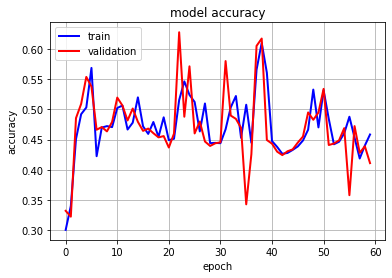

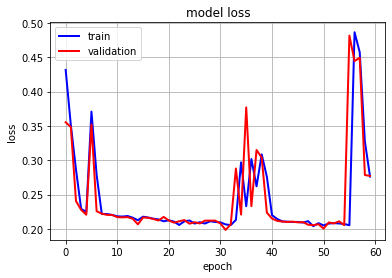

In [ ]:
plothist(history_B16LSTM)
plothist_loss(history_B16LSTM)

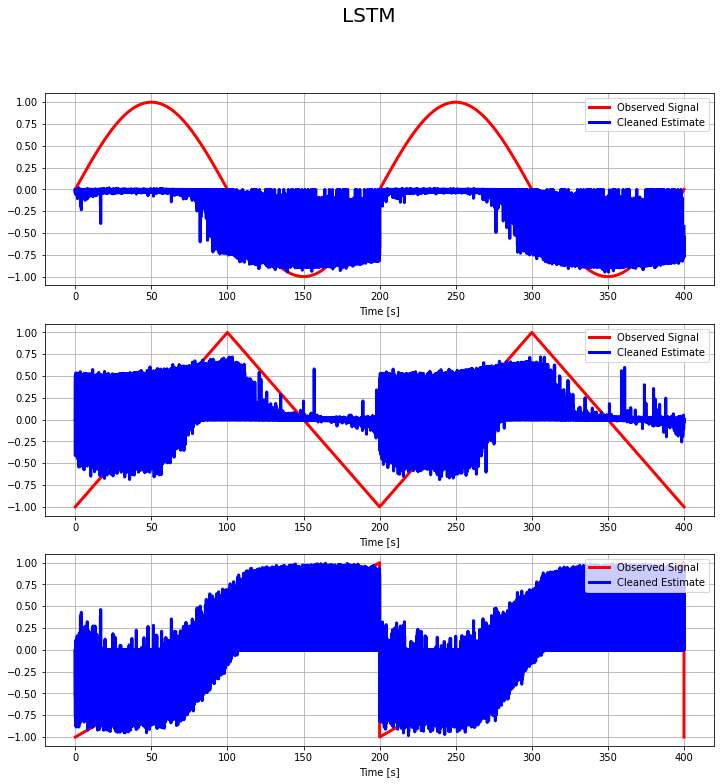

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('LSTM', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

**Batch Size=128,LSTM**

**LSTM**
* Optimizer: ADAM
* Learning Rate: 0.01
* Loss Function: MSE
* Batch Size: 128
* Number of Epochs:60

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_B128LSTM=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=128, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
11/11 [==============================] - 4s 186ms/step - loss: 0.6237 - accuracy: 0.3320 - val_loss: 0.5134 - val_accuracy: 0.3311
Epoch 2/60
11/11 [==============================] - 1s 134ms/step - loss: 0.4308 - accuracy: 0.3302 - val_loss: 0.4024 - val_accuracy: 0.3131
Epoch 3/60
11/11 [==============================] - 1s 135ms/step - loss: 0.3985 - accuracy: 0.3154 - val_loss: 0.3980 - val_accuracy: 0.3100
Epoch 4/60
11/11 [==============================] - 1s 133ms/step - loss: 0.3952 - accuracy: 0.3140 - val_loss: 0.3931 - val_accuracy: 0.3144
Epoch 5/60
11/11 [==============================] - 1s 133ms/step - loss: 0.3931 - accuracy: 0.3168 - val_loss: 0.3928 - val_accuracy: 0.3189
Epoch 6/60
11/11 [==============================] - 1s 134ms/step - loss: 0.3920 - accuracy: 0.3158 - val_loss: 0.3911 - val_accuracy: 0.3226
Epoch 7/60
11/11 [==============================] - 1s 134ms/step - loss: 0.3886 - accuracy: 0.3307 - val_loss: 0.3863 - val_accuracy: 0.3774
Epoch 

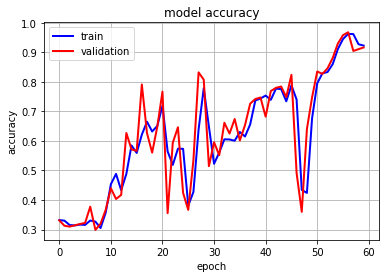

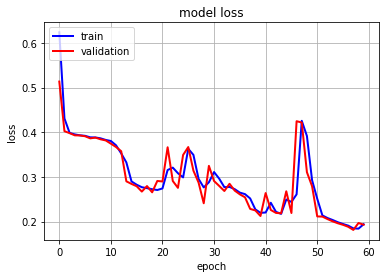

In [ ]:
plothist(history_B128LSTM)
plothist_loss(history_B128LSTM)

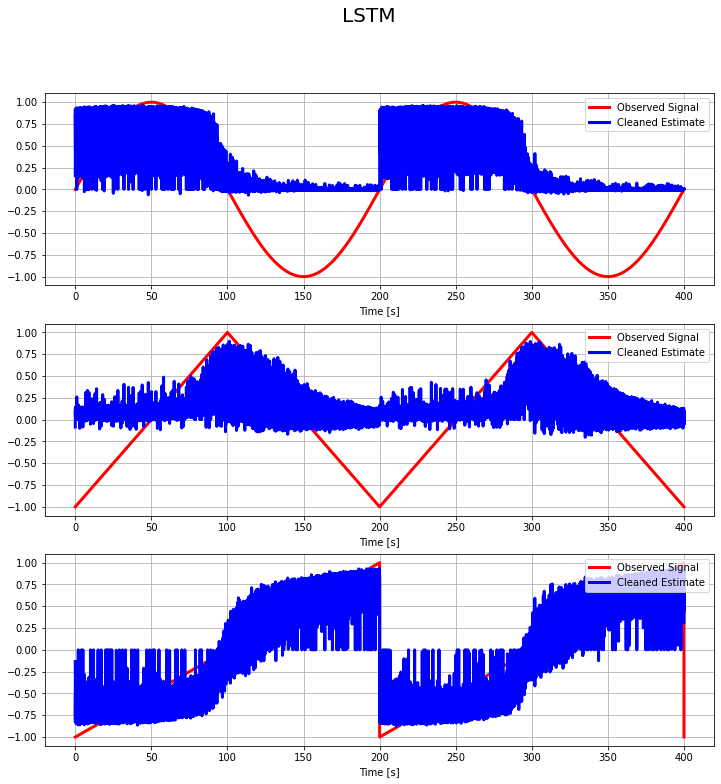

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('LSTM', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

**Comparing Batch size (B=16,32,64,128) in LSTM**

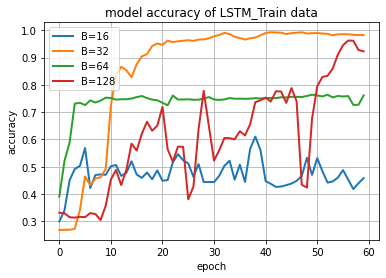

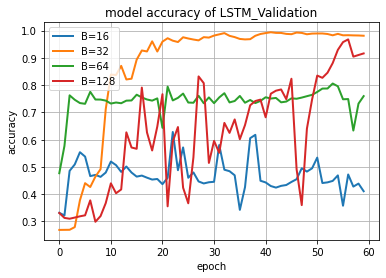

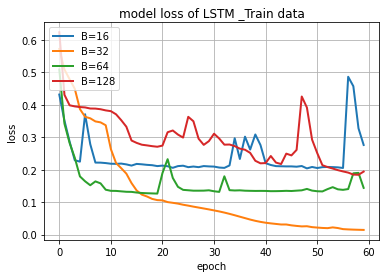

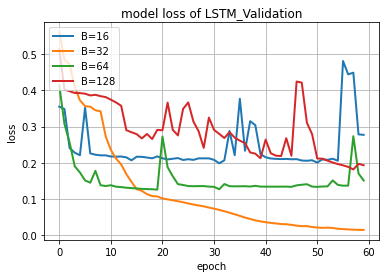

In [ ]:
plt.plot(history_B16LSTM.history['accuracy'],linewidth=2.0)
plt.plot(history_1DLSTM.history['accuracy'],linewidth=2.0)
plt.plot(history_B64LSTM.history['accuracy'],linewidth=2.0)
plt.plot(history_B128LSTM.history['accuracy'],linewidth=2.0)

plt.title('model accuracy of LSTM_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_B16LSTM.history['val_accuracy'],linewidth=2.0)
plt.plot(history_1DLSTM.history['val_accuracy'],linewidth=2.0)
plt.plot(history_B64LSTM.history['val_accuracy'],linewidth=2.0)
plt.plot(history_B128LSTM.history['val_accuracy'],linewidth=2.0)


plt.title('model accuracy of LSTM_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_B16LSTM.history['loss'],linewidth=2.0)
plt.plot(history_1DLSTM.history['loss'],linewidth=2.0)
plt.plot(history_B64LSTM.history['loss'],linewidth=2.0)
plt.plot(history_B128LSTM.history['loss'],linewidth=2.0)

plt.title('model loss of LSTM _Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_B16LSTM.history['val_loss'],linewidth=2.0)
plt.plot(history_1DLSTM.history['val_loss'],linewidth=2.0)
plt.plot(history_B64LSTM.history['val_loss'],linewidth=2.0)
plt.plot(history_B128LSTM.history['val_loss'],linewidth=2.0)

plt.title('model loss of LSTM_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

**Changing Batch Size in RNN**

**RNN**
* Optimizer: ADAM
* Learning Rate: 0.01
* Loss Function: MSE
* Batch Size: 64
* Number of Epochs:60

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.SimpleRNN(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_B64RNN=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=64, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
22/22 [==============================] - 21s 937ms/step - loss: 0.9098 - accuracy: 0.4138 - val_loss: 0.7771 - val_accuracy: 0.4823
Epoch 2/60
22/22 [==============================] - 20s 896ms/step - loss: 0.6449 - accuracy: 0.5128 - val_loss: 0.4179 - val_accuracy: 0.6186
Epoch 3/60
22/22 [==============================] - 20s 925ms/step - loss: 0.4005 - accuracy: 0.6183 - val_loss: 0.2349 - val_accuracy: 0.7079
Epoch 4/60
22/22 [==============================] - 19s 887ms/step - loss: 0.4103 - accuracy: 0.5636 - val_loss: 0.1754 - val_accuracy: 0.7349
Epoch 5/60
22/22 [==============================] - 19s 881ms/step - loss: 0.1369 - accuracy: 0.7557 - val_loss: 0.1060 - val_accuracy: 0.7721
Epoch 6/60
22/22 [==============================] - 19s 882ms/step - loss: 0.0934 - accuracy: 0.8043 - val_loss: 0.0813 - val_accuracy: 0.8442
Epoch 7/60
22/22 [==============================] - 20s 903ms/step - loss: 0.0755 - accuracy: 0.8592 - val_loss: 0.0705 - val_accuracy: 0.8709

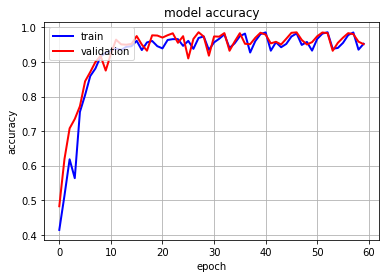

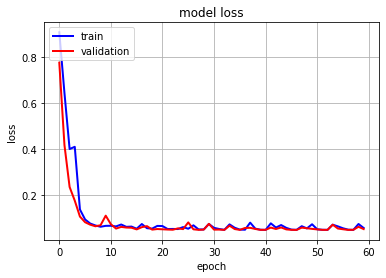

In [ ]:
plothist(history_B64RNN)
plothist_loss(history_B64RNN)

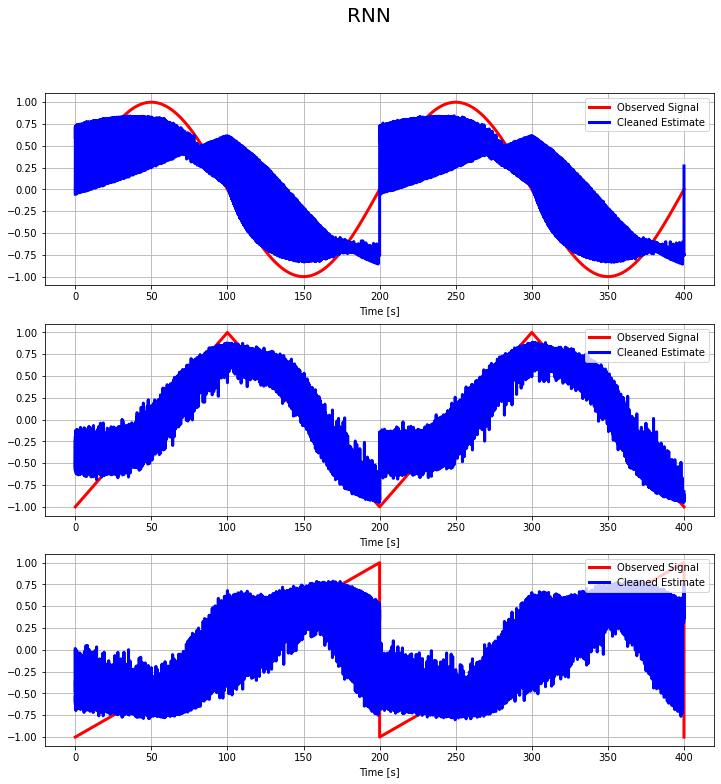

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('RNN', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

**Batch Size=16, RNN**

**RNN**
* Optimizer: ADAM
* Learning Rate: 0.01
* Loss Function: MSE
* Batch Size: 16
* Number of Epochs:60

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.SimpleRNN(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_B16RNN=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=16, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
88/88 [==============================] - 80s 897ms/step - loss: 0.7044 - accuracy: 0.4848 - val_loss: 0.2949 - val_accuracy: 0.6199
Epoch 2/60
88/88 [==============================] - 77s 878ms/step - loss: 0.3066 - accuracy: 0.6225 - val_loss: 0.3807 - val_accuracy: 0.6058
Epoch 3/60
88/88 [==============================] - 77s 877ms/step - loss: 0.2924 - accuracy: 0.6222 - val_loss: 0.2952 - val_accuracy: 0.6491
Epoch 4/60
88/88 [==============================] - 78s 883ms/step - loss: 0.2965 - accuracy: 0.6322 - val_loss: 0.2512 - val_accuracy: 0.6341
Epoch 5/60
88/88 [==============================] - 78s 886ms/step - loss: 0.2867 - accuracy: 0.6661 - val_loss: 0.2379 - val_accuracy: 0.7332
Epoch 6/60
88/88 [==============================] - 78s 883ms/step - loss: 0.2548 - accuracy: 0.7797 - val_loss: 0.4080 - val_accuracy: 0.7180
Epoch 7/60
88/88 [==============================] - 78s 890ms/step - loss: 0.2603 - accuracy: 0.8101 - val_loss: 0.2492 - val_accuracy: 0.8206

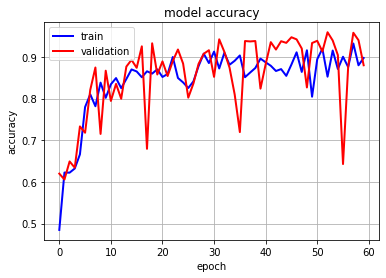

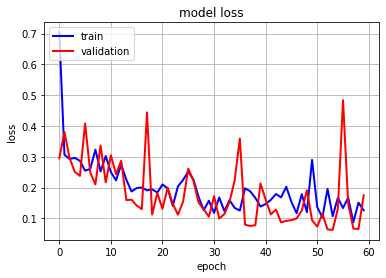

In [ ]:
plothist(history_B16RNN)
plothist_loss(history_B16RNN)

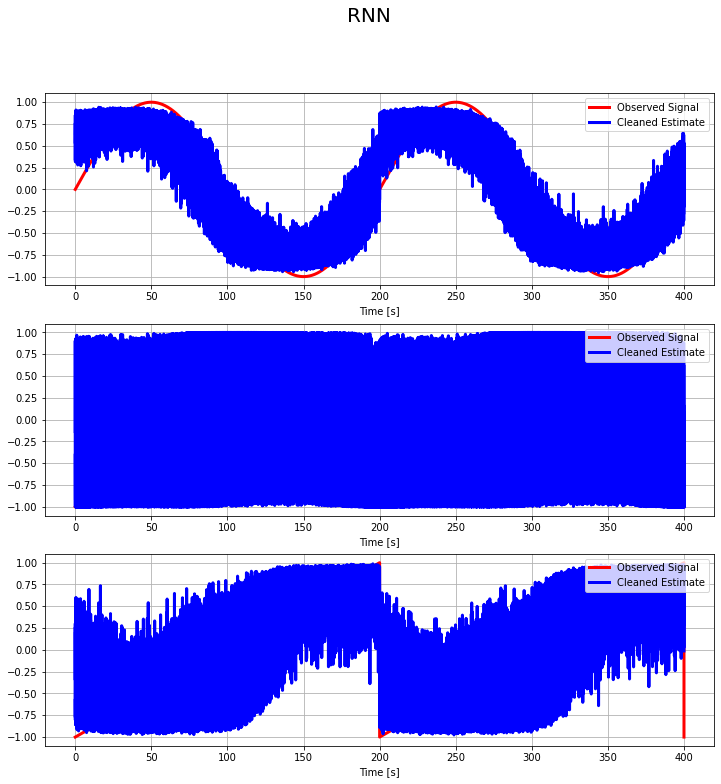

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('RNN', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

**Batch Size=128,RNN**

**RNN**
* Optimizer: ADAM
* Learning Rate: 0.01
* Loss Function: MSE
* Batch Size: 128
* Number of Epochs:60

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.SimpleRNN(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_B128RNN=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=128, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
11/11 [==============================] - 12s 981ms/step - loss: 1.3737 - accuracy: 0.3963 - val_loss: 1.3678 - val_accuracy: 0.3945
Epoch 2/60
11/11 [==============================] - 10s 908ms/step - loss: 1.3473 - accuracy: 0.3812 - val_loss: 1.1942 - val_accuracy: 0.3612
Epoch 3/60
11/11 [==============================] - 10s 916ms/step - loss: 0.9247 - accuracy: 0.3510 - val_loss: 0.8610 - val_accuracy: 0.3662
Epoch 4/60
11/11 [==============================] - 10s 921ms/step - loss: 0.7659 - accuracy: 0.3712 - val_loss: 0.7233 - val_accuracy: 0.3873
Epoch 5/60
11/11 [==============================] - 10s 913ms/step - loss: 0.6136 - accuracy: 0.4744 - val_loss: 0.5365 - val_accuracy: 0.5252
Epoch 6/60
11/11 [==============================] - 10s 911ms/step - loss: 0.4561 - accuracy: 0.5329 - val_loss: 0.3416 - val_accuracy: 0.5890
Epoch 7/60
11/11 [==============================] - 10s 941ms/step - loss: 0.3066 - accuracy: 0.6523 - val_loss: 0.2455 - val_accuracy: 0.7014

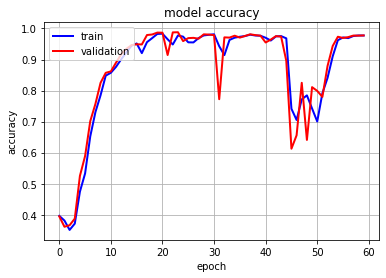

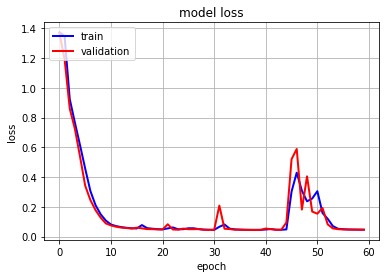

In [ ]:
plothist(history_B128RNN)
plothist_loss(history_B128RNN)

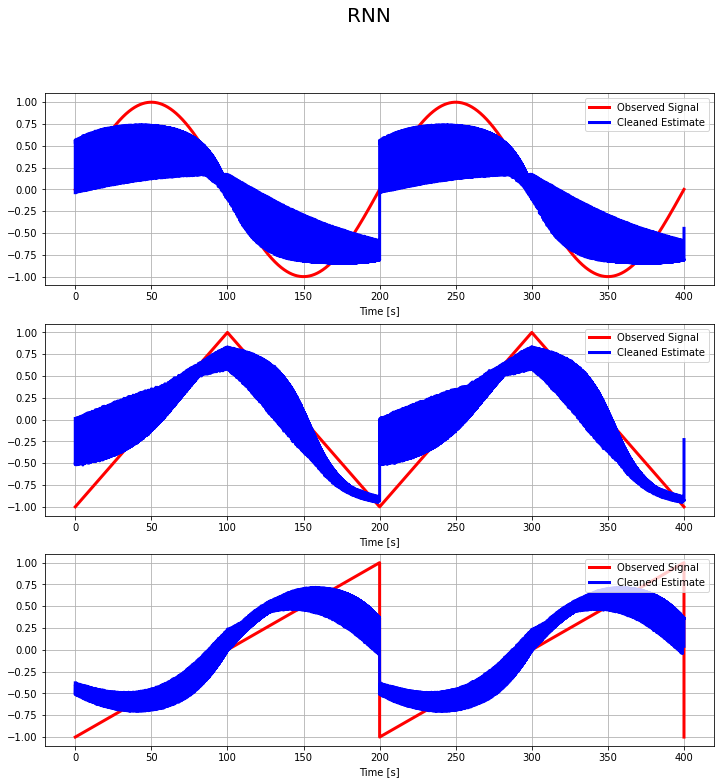

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('RNN', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

**Comparing Batch size (B=16,32,64,128) in RNN**

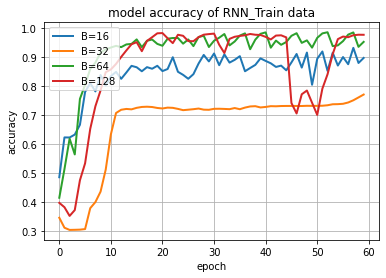

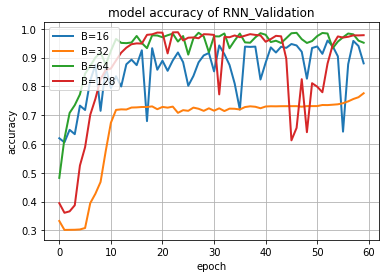

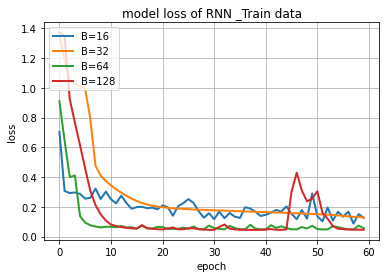

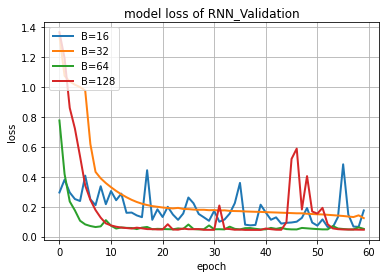

In [ ]:
plt.plot(history_B16RNN.history['accuracy'],linewidth=2.0)
plt.plot(history_1DRNN.history['accuracy'],linewidth=2.0)
plt.plot(history_B64RNN.history['accuracy'],linewidth=2.0)
plt.plot(history_B128RNN.history['accuracy'],linewidth=2.0)

plt.title('model accuracy of RNN_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_B16RNN.history['val_accuracy'],linewidth=2.0)
plt.plot(history_1DRNN.history['val_accuracy'],linewidth=2.0)
plt.plot(history_B64RNN.history['val_accuracy'],linewidth=2.0)
plt.plot(history_B128RNN.history['val_accuracy'],linewidth=2.0)


plt.title('model accuracy of RNN_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_B16RNN.history['loss'],linewidth=2.0)
plt.plot(history_1DRNN.history['loss'],linewidth=2.0)
plt.plot(history_B64RNN.history['loss'],linewidth=2.0)
plt.plot(history_B128RNN.history['loss'],linewidth=2.0)

plt.title('model loss of RNN _Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_B16RNN.history['val_loss'],linewidth=2.0)
plt.plot(history_1DRNN.history['val_loss'],linewidth=2.0)
plt.plot(history_B64RNN.history['val_loss'],linewidth=2.0)
plt.plot(history_B128RNN.history['val_loss'],linewidth=2.0)

plt.title('model loss of RNN_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

## **د.8: Changing Number of Epochs for noisy signal with varience=100**

**Epoch=20,60,100; LSTM**

**LSTM**
* Optimizer: ADAM
* Learning Rate: 0.01
* Loss Function: MSE
* Batch Size: 128
* Number of Epochs:100

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_e100LSTM=model.fit(x_train, y_train, epochs=100, validation_data=(x_valid, y_valid), batch_size=128, verbose=0)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Evaluation with Test Set:
Test loss: 0.2994929552078247
Test acc: 0.5266824960708618


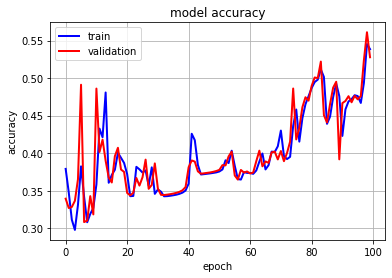

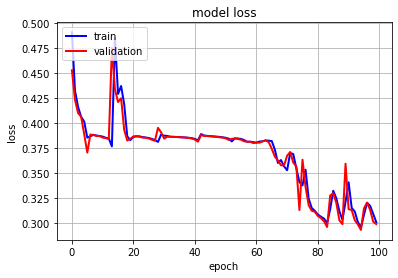

In [ ]:
plothist(history_e100LSTM)
plothist_loss(history_e100LSTM)

**LSTM**
* Optimizer: ADAM
* Learning Rate: 0.01
* Loss Function: MSE
* Batch Size: 128
* Number of Epochs:20

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_e20LSTM=model.fit(x_train, y_train, epochs=20, validation_data=(x_valid, y_valid), batch_size=128, verbose=0)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Evaluation with Test Set:
Test loss: 0.3309635818004608
Test acc: 0.5750849843025208


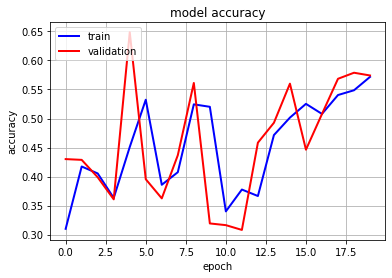

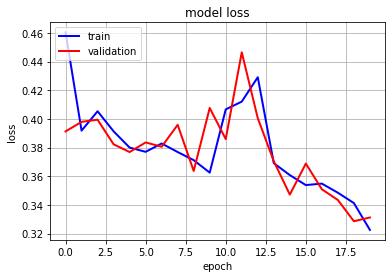

In [ ]:
plothist(history_e20LSTM)
plothist_loss(history_e20LSTM)

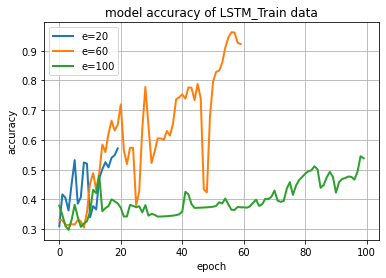

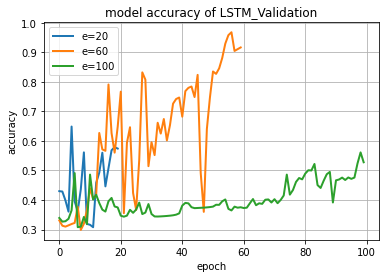

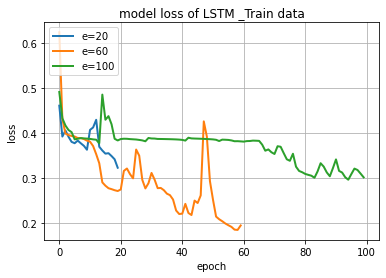

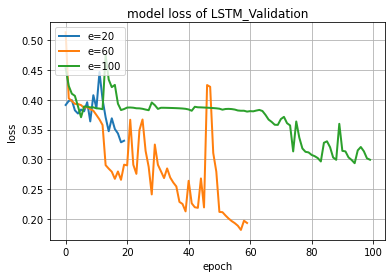

In [ ]:
plt.plot(history_e20LSTM.history['accuracy'],linewidth=2.0)
plt.plot(history_B128LSTM.history['accuracy'],linewidth=2.0)
plt.plot(history_e100LSTM.history['accuracy'],linewidth=2.0)


plt.title('model accuracy of LSTM_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_e20LSTM.history['val_accuracy'],linewidth=2.0)
plt.plot(history_B128LSTM.history['val_accuracy'],linewidth=2.0)
plt.plot(history_e100LSTM.history['val_accuracy'],linewidth=2.0)


plt.title('model accuracy of LSTM_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_e20LSTM.history['loss'],linewidth=2.0)
plt.plot(history_B128LSTM.history['loss'],linewidth=2.0)
plt.plot(history_e100LSTM.history['loss'],linewidth=2.0)

plt.title('model loss of LSTM _Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_e20LSTM.history['val_loss'],linewidth=2.0)
plt.plot(history_B128LSTM.history['val_loss'],linewidth=2.0)
plt.plot(history_e100LSTM.history['val_loss'],linewidth=2.0)

plt.title('model loss of LSTM_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

**RNN**
* Optimizer: ADAM
* Learning Rate: 0.01
* Loss Function: MSE
* Batch Size: 128
* Number of Epochs:100

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.SimpleRNN(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_e100RNN=model.fit(x_train, y_train, epochs=100, validation_data=(x_valid, y_valid), batch_size=128, verbose=0)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Evaluation with Test Set:
Test loss: 0.11086828261613846
Test acc: 0.92180997133255


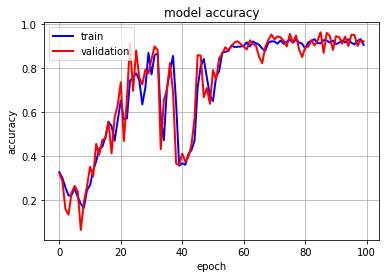

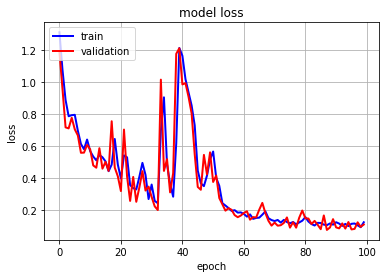

In [ ]:
plothist(history_e100RNN)
plothist_loss(history_e100RNN)

**RNN**
* Optimizer: ADAM
* Learning Rate: 0.01
* Loss Function: MSE
* Batch Size: 128
* Number of Epochs:20

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.SimpleRNN(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_e20RNN=model.fit(x_train, y_train, epochs=20, validation_data=(x_valid, y_valid), batch_size=128, verbose=0)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Evaluation with Test Set:
Test loss: 0.2242790013551712
Test acc: 0.6863200068473816


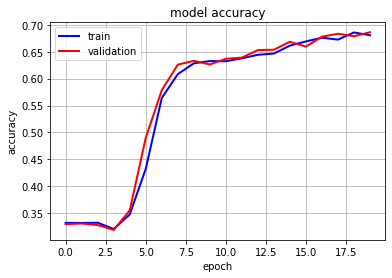

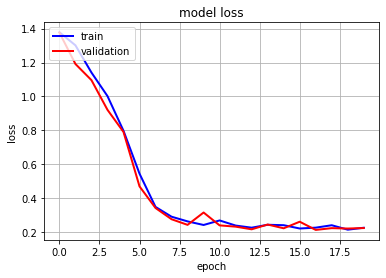

In [ ]:
plothist(history_e20RNN)
plothist_loss(history_e20RNN)

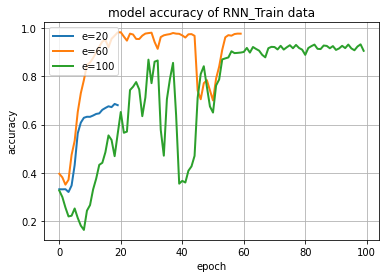

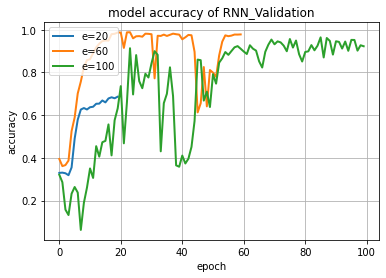

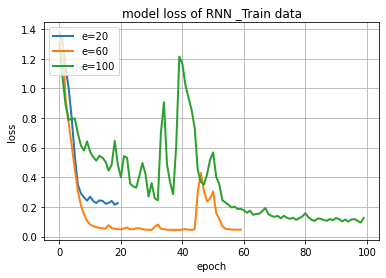

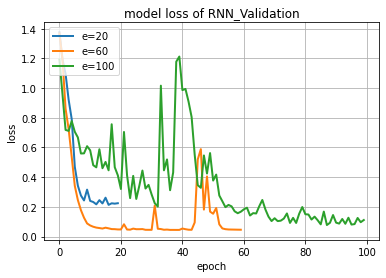

In [ ]:
plt.plot(history_e20RNN.history['accuracy'],linewidth=2.0)
plt.plot(history_B128RNN.history['accuracy'],linewidth=2.0)
plt.plot(history_e100RNN.history['accuracy'],linewidth=2.0)


plt.title('model accuracy of RNN_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_e20RNN.history['val_accuracy'],linewidth=2.0)
plt.plot(history_B128RNN.history['val_accuracy'],linewidth=2.0)
plt.plot(history_e100RNN.history['val_accuracy'],linewidth=2.0)


plt.title('model accuracy of RNN_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_e20RNN.history['loss'],linewidth=2.0)
plt.plot(history_B128RNN.history['loss'],linewidth=2.0)
plt.plot(history_e100RNN.history['loss'],linewidth=2.0)

plt.title('model loss of RNN _Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_e20RNN.history['val_loss'],linewidth=2.0)
plt.plot(history_B128RNN.history['val_loss'],linewidth=2.0)
plt.plot(history_e100RNN.history['val_loss'],linewidth=2.0)

plt.title('model loss of RNN_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

# **ه : Changing Varience and Mean of the Gaussian Noise by time**

**We divid our true signals to two parts, after that we add gaussian noise with mean=0 and varience=1 to first part and add gaussian noise with mean=5 and varience=15 to another part.**

## **ه.1 :Generating true signals and noisy ones and splitting dataset**

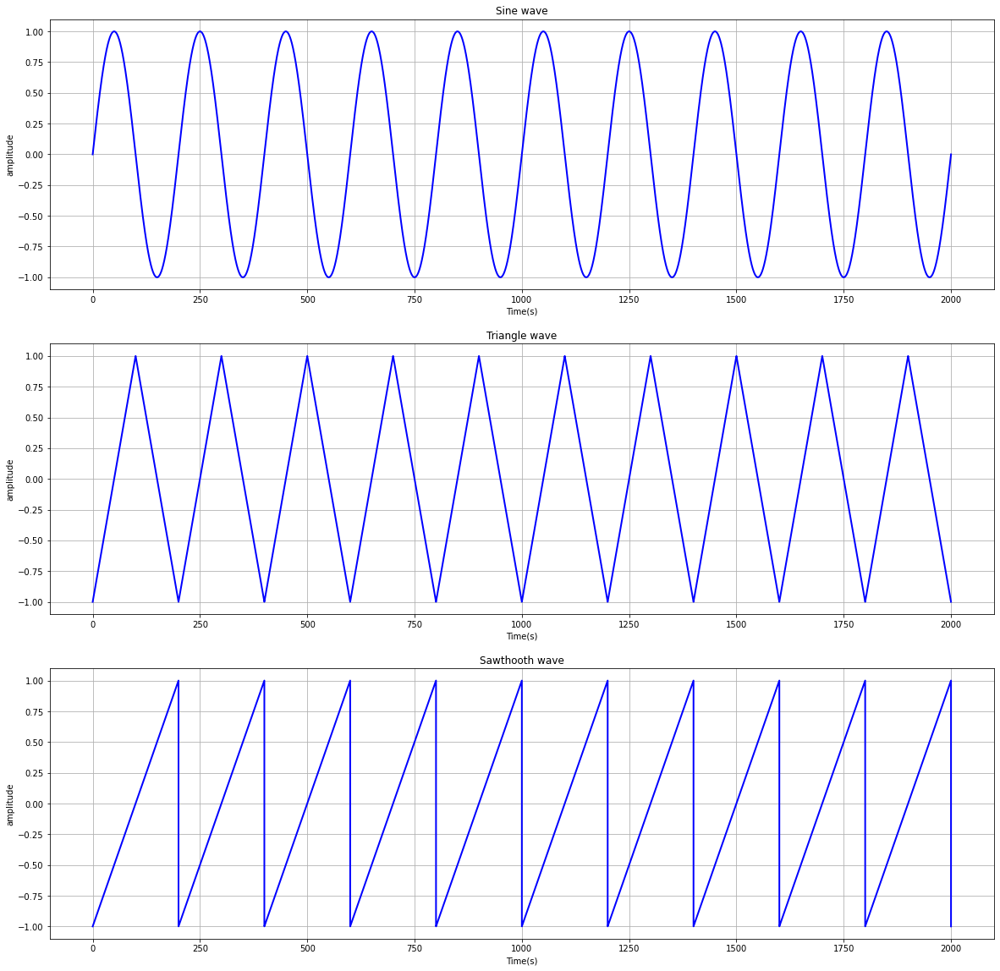

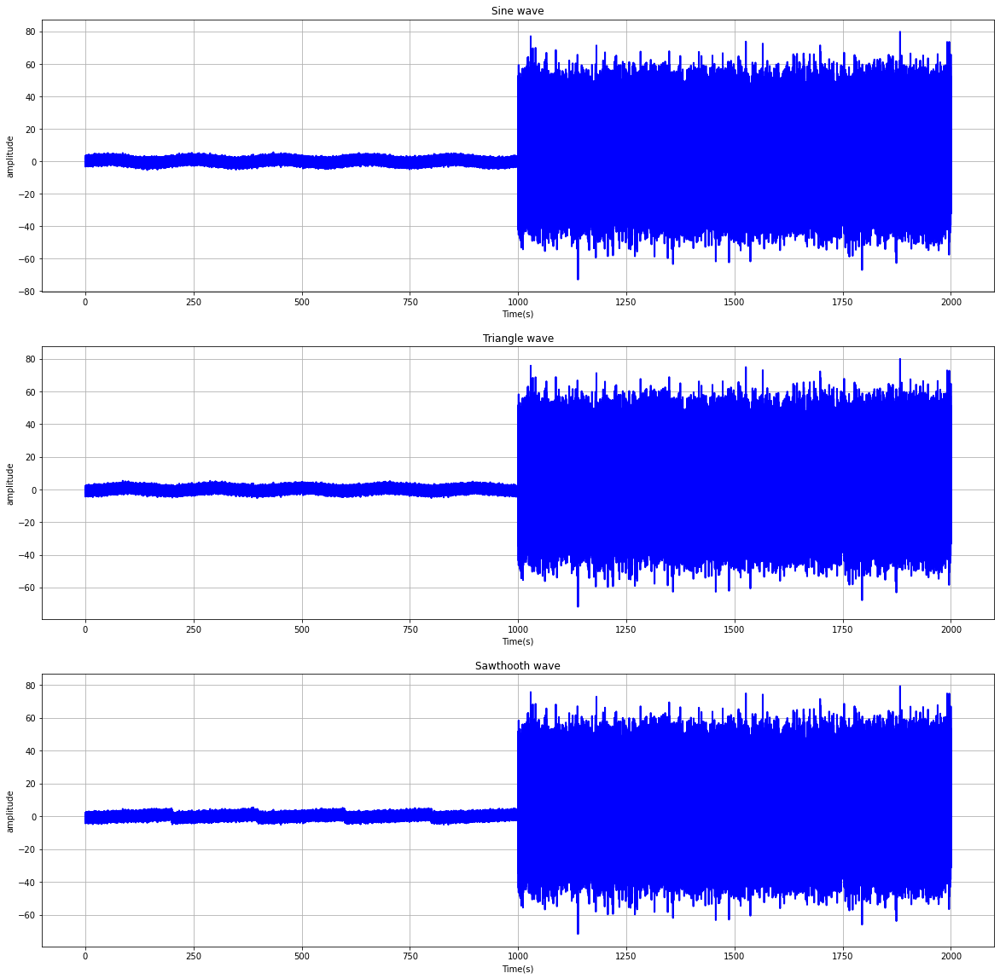

In [ ]:
dur        = 2000        # Second
sample_rate= 1000
freq       = 1/200       #Hz, each periods of these waves is 200 second
T          = 200         #Second

# time, 2000 seconds
t = np.linspace(0, dur, dur*sample_rate)

#true signals 
sin       = np.sin(2*np.pi*freq * t)
saw_tooth = signal.sawtooth(2 * np.pi * freq * t)
triangle  = signal.sawtooth(2 * np.pi * freq * t,0.5)

# gaussian noise with mean=0 and variance=1
noise1 = np.random.normal(0,1,int(len(sin)/2))
noise2 = np.random.normal(5,15,int(len(sin)/2))

# signals with noise
noisy_sin1       =  sin[ :int(len(sin)/2)]      + noise1
noisy_sin2       =  sin[ int(len(sin)/2):]      + noise2
noisy_sin        =  np.concatenate((noisy_sin1, noisy_sin2))

noisy_saw_tooth1       =  saw_tooth[ :int(len(saw_tooth)/2)]      + noise1
noisy_saw_tooth2       =  saw_tooth[ int(len(saw_tooth)/2):]      + noise2
noisy_saw_tooth        =  np.concatenate((noisy_saw_tooth1, noisy_saw_tooth2))

noisy_triangle1       =  triangle[ :int(len(triangle)/2)]      + noise1
noisy_triangle2       =  triangle[ int(len(triangle)/2):]      + noise2
noisy_triangle        =  np.concatenate((noisy_triangle1, noisy_triangle2))




#plotting the true waves
plt.figure(figsize=(20,20))
plt.subplot(3,1,1)
plt.plot(t,sin,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Sine wave')
plt.grid()

plt.subplot(3,1,2)
plt.plot(t,triangle,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Triangle wave')
plt.grid()

plt.subplot(3,1,3)
plt.plot(t,saw_tooth,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Sawthooth wave')
plt.grid()

#plotting noisy signals
plt.figure(figsize=(20,20))
plt.subplot(3,1,1)
plt.plot(t,noisy_sin,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Sine wave')
plt.grid()

plt.subplot(3,1,2)
plt.plot(t,noisy_triangle,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Triangle wave')
plt.grid()

plt.subplot(3,1,3)
plt.plot(t,noisy_saw_tooth,linewidth=2,color='b')
plt.xlabel('Time(s)')
plt.ylabel('amplitude')
plt.title('Sawthooth wave')
plt.grid()




**Splitting dataset**

In [ ]:
true_signal = np.array([sin,triangle,saw_tooth]).T
noisy_signal= np.array([noisy_sin,noisy_triangle,noisy_saw_tooth]).T
print('Shape of signal')
print(true_signal.shape)

# splitting data into 1 second chunks for our 3 signals
input_data  = np.zeros((dur, sample_rate, 3)) # (2000, 1000, 3)
target_data = np.zeros((dur, sample_rate,3)) # (2000, 1000, 3)
for i in range(dur):
    st = i*sample_rate
    et = (i+1)*sample_rate
    input_data[i,:]  = noisy_signal [st:et]
    target_data[i,:] = true_signal  [st:et]

# each period of these signals is 200 seconds; so
# 7 periods for training data
# train on 7*200 = 1400 seconds
ts=7*T
x_train = input_data[:ts, :]
y_train = target_data[:ts, :]


# 1 periods for validation data
# train on 1*200 = 200 seconds
x_valid = input_data [ts:ts+T, :]
y_valid = target_data[ts:ts+T, :]

# test data is the rest of data 
t_test=dur-(ts+T)
x_test = input_data [ts+T:, :]
y_test = target_data[ts+T:, :]
########

print('x_train, y_train', x_train.shape, y_train.shape)
print('x_valid, y_valid', x_valid.shape, y_valid.shape)
print('x_test, y_test', x_test.shape, y_test.shape)

Shape of signal
(2000000, 3)
x_train, y_train (1400, 1000, 3) (1400, 1000, 3)
x_valid, y_valid (200, 1000, 3) (200, 1000, 3)
x_test, y_test (400, 1000, 3) (400, 1000, 3)


##  **ه.2 : LSTM, RNN, calculation of SNR**

**LSTM Network**

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer='adam',metrics=['accuracy'])


# Train
history_1DLSTM=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=32, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
44/44 [==============================] - 10s 135ms/step - loss: 0.3753 - accuracy: 0.3485 - val_loss: 0.3765 - val_accuracy: 0.4589
Epoch 2/60
44/44 [==============================] - 5s 119ms/step - loss: 0.3044 - accuracy: 0.6189 - val_loss: 0.3562 - val_accuracy: 0.4992
Epoch 3/60
44/44 [==============================] - 6s 128ms/step - loss: 0.2732 - accuracy: 0.7310 - val_loss: 0.3298 - val_accuracy: 0.5711
Epoch 4/60
44/44 [==============================] - 5s 121ms/step - loss: 0.2458 - accuracy: 0.7623 - val_loss: 0.3009 - val_accuracy: 0.6314
Epoch 5/60
44/44 [==============================] - 5s 120ms/step - loss: 0.2185 - accuracy: 0.7995 - val_loss: 0.2724 - val_accuracy: 0.6881
Epoch 6/60
44/44 [==============================] - 5s 120ms/step - loss: 0.1961 - accuracy: 0.8276 - val_loss: 0.2598 - val_accuracy: 0.7030
Epoch 7/60
44/44 [==============================] - 5s 121ms/step - loss: 0.1774 - accuracy: 0.8410 - val_loss: 0.2432 - val_accuracy: 0.6848
Epoch

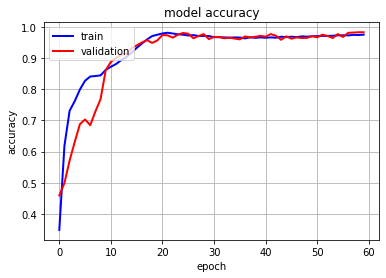

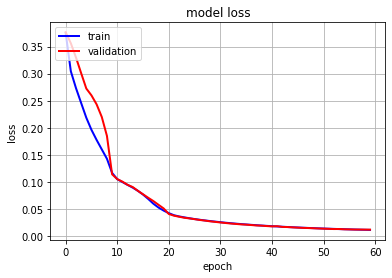

In [ ]:
plothist(history_1DLSTM)
plothist_loss(history_1DLSTM)

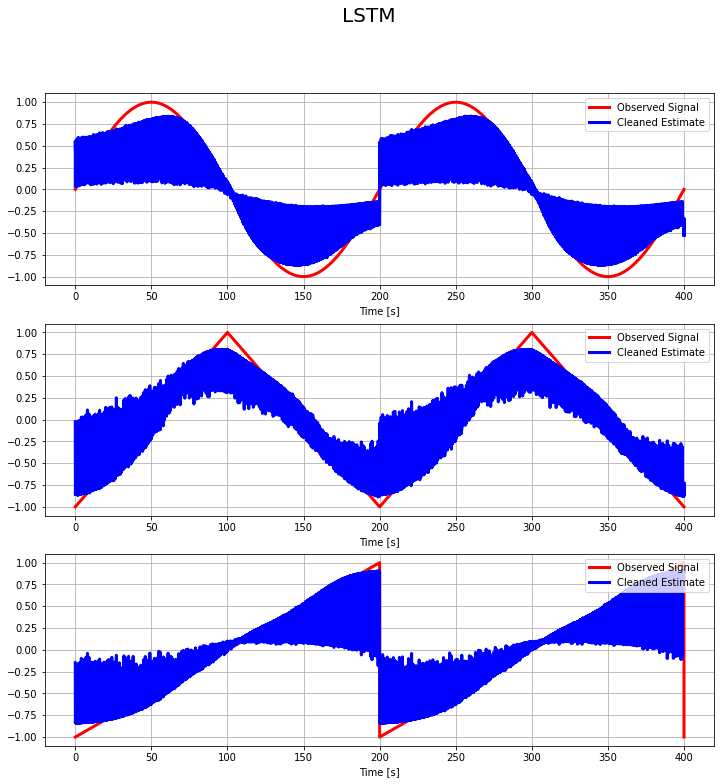

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('LSTM', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

**SNR for Output of LSTM Network**



In [ ]:
print('sin')
print(f'SNR Sin Signal is {SNRsystem(sin,noisy_sin)} dB')
print(f'SNR Sin Signal(output of LSTM) is {SNRsystem(sin_test.flatten(),sin_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Triangel')
print(f'SNR Triangle Signal is {SNRsystem(triangle,noisy_triangle)} dB')
print(f'SNR Triangle Signal(output of LSTM) is {SNRsystem(triangle_test.flatten(),triangle_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Saw thooth')
print(f'SNR Saw thooth Signal is {SNRsystem(saw_tooth,noisy_saw_tooth)} dB')
print(f'SNR Saw thooth Signal(output of LSTM) is {SNRsystem(saw_tooth_test.flatten(),saw_tooth_pred.flatten() )} dB')
print('*******************************************************************************************')

sin
SNR Sin Signal is -24.027496717875184 dB
SNR Sin Signal(output of LSTM) is 11.755882803961107 dB
*******************************************************************************************
Triangel
SNR Triangle Signal is -25.841878428981566 dB
SNR Triangle Signal(output of LSTM) is 16.34291720375556 dB
*******************************************************************************************
Saw thooth
SNR Saw thooth Signal is -25.710103962386235 dB
SNR Saw thooth Signal(output of LSTM) is 20.003384697542934 dB
*******************************************************************************************


**RNN Network**

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This RNN will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.SimpleRNN(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer='adam',metrics=['accuracy'])


# Train
history_1DRNN=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=32, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
44/44 [==============================] - 51s 1s/step - loss: 0.5795 - accuracy: 0.5882 - val_loss: 1.0255 - val_accuracy: 0.3956
Epoch 2/60
44/44 [==============================] - 49s 1s/step - loss: 0.4733 - accuracy: 0.6280 - val_loss: 0.8424 - val_accuracy: 0.4285
Epoch 3/60
44/44 [==============================] - 49s 1s/step - loss: 0.3155 - accuracy: 0.6891 - val_loss: 0.2405 - val_accuracy: 0.7390
Epoch 4/60
44/44 [==============================] - 50s 1s/step - loss: 0.2120 - accuracy: 0.7341 - val_loss: 0.2036 - val_accuracy: 0.7322
Epoch 5/60
44/44 [==============================] - 48s 1s/step - loss: 0.1979 - accuracy: 0.7321 - val_loss: 0.1923 - val_accuracy: 0.7321
Epoch 6/60
44/44 [==============================] - 48s 1s/step - loss: 0.1878 - accuracy: 0.7322 - val_loss: 0.1833 - val_accuracy: 0.7321
Epoch 7/60
44/44 [==============================] - 49s 1s/step - loss: 0.1793 - accuracy: 0.7321 - val_loss: 0.1755 - val_accuracy: 0.7321
Epoch 8/60
44/44 [==

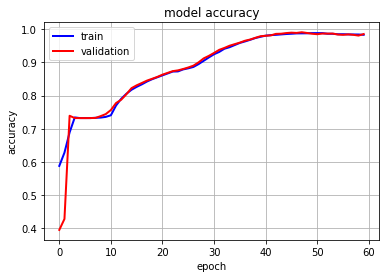

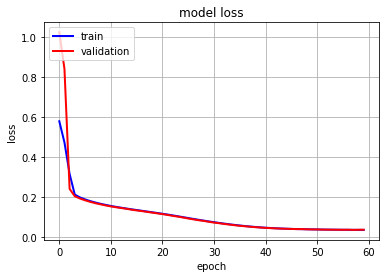

In [ ]:
plothist(history_1DRNN)
plothist_loss(history_1DRNN)

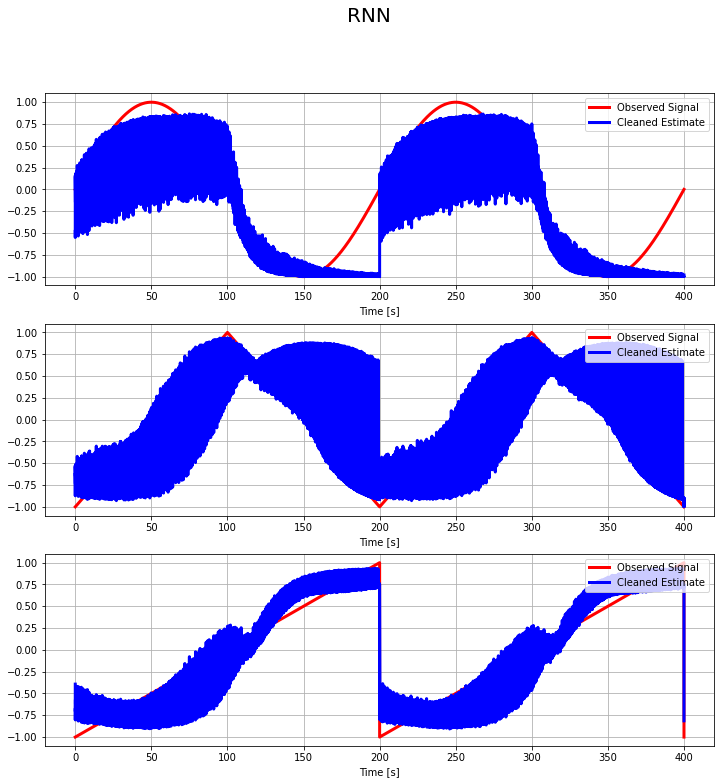

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('RNN', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

**SNR for Output of RNN Network**



In [ ]:
print('sin')
print(f'SNR Sin Signal is {SNRsystem(sin,noisy_sin)} dB')
print(f'SNR Sin Signal(output of LSTM) is {SNRsystem(sin_test.flatten(),sin_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Triangel')
print(f'SNR Triangle Signal is {SNRsystem(triangle,noisy_triangle)} dB')
print(f'SNR Triangle Signal(output of LSTM) is {SNRsystem(triangle_test.flatten(),triangle_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Saw thooth')
print(f'SNR Saw thooth Signal is {SNRsystem(saw_tooth,noisy_saw_tooth)} dB')
print(f'SNR Saw thooth Signal(output of LSTM) is {SNRsystem(saw_tooth_test.flatten(),saw_tooth_pred.flatten() )} dB')
print('*******************************************************************************************')

sin
SNR Sin Signal is -24.027496717875184 dB
SNR Sin Signal(output of LSTM) is 8.355630962049203 dB
*******************************************************************************************
Triangel
SNR Triangle Signal is -25.841878428981566 dB
SNR Triangle Signal(output of LSTM) is 12.796363668542075 dB
*******************************************************************************************
Saw thooth
SNR Saw thooth Signal is -25.710103962386235 dB
SNR Saw thooth Signal(output of LSTM) is 12.118391175506115 dB
*******************************************************************************************


**Comparing RNN and LSTM**

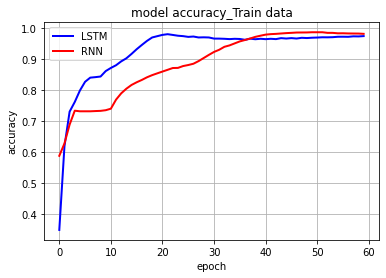

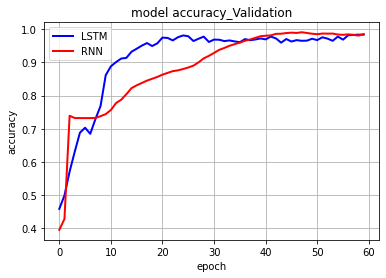

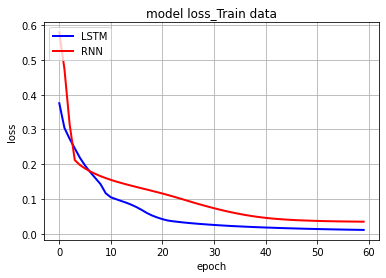

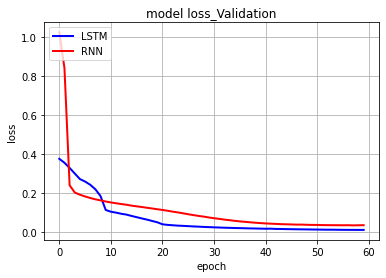

In [ ]:
plt.plot(history_1DLSTM.history['accuracy'],color='b',linewidth=2.0)
plt.plot(history_1DRNN.history['accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['LSTM', 'RNN'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DLSTM.history['val_accuracy'],color='b',linewidth=2.0)
plt.plot(history_1DRNN.history['val_accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['LSTM', 'RNN'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DLSTM.history['loss'],color='b',linewidth=2.0)
plt.plot(history_1DRNN.history['loss'],color='r',linewidth=2.0)

plt.title('model loss_Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['LSTM', 'RNN'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DLSTM.history['val_loss'],color='b',linewidth=2.0)
plt.plot(history_1DRNN.history['val_loss'],color='r',linewidth=2.0)

plt.title('model loss_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['LSTM', 'RNN'], loc='upper left')
plt.grid()
plt.show()

## **2.ه: Changing Learning Rate, Batch Size, Number of Epoches**

### **1: Changing Learning Rate**

**Increasing learning Rate in LSTM**

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_1RLSTM=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=32, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
44/44 [==============================] - 8s 132ms/step - loss: 0.3871 - accuracy: 0.4842 - val_loss: 0.3912 - val_accuracy: 0.4640
Epoch 2/60
44/44 [==============================] - 5s 119ms/step - loss: 0.1898 - accuracy: 0.8196 - val_loss: 0.1810 - val_accuracy: 0.7857
Epoch 3/60
44/44 [==============================] - 5s 119ms/step - loss: 0.0896 - accuracy: 0.9341 - val_loss: 0.0675 - val_accuracy: 0.9413
Epoch 4/60
44/44 [==============================] - 5s 119ms/step - loss: 0.0471 - accuracy: 0.9677 - val_loss: 0.0363 - val_accuracy: 0.9176
Epoch 5/60
44/44 [==============================] - 6s 126ms/step - loss: 0.0209 - accuracy: 0.9623 - val_loss: 0.0177 - val_accuracy: 0.9602
Epoch 6/60
44/44 [==============================] - 5s 119ms/step - loss: 0.0145 - accuracy: 0.9699 - val_loss: 0.0136 - val_accuracy: 0.9774
Epoch 7/60
44/44 [==============================] - 5s 119ms/step - loss: 0.0125 - accuracy: 0.9736 - val_loss: 0.0133 - val_accuracy: 0.9747
Epoch 

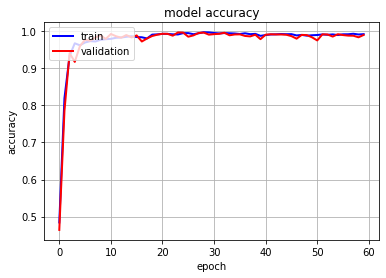

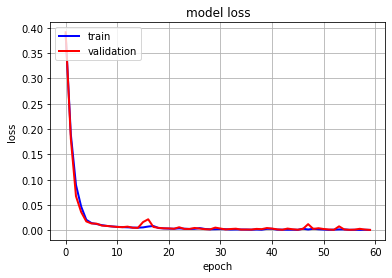

In [ ]:
plothist(history_1RLSTM)
plothist_loss(history_1RLSTM)

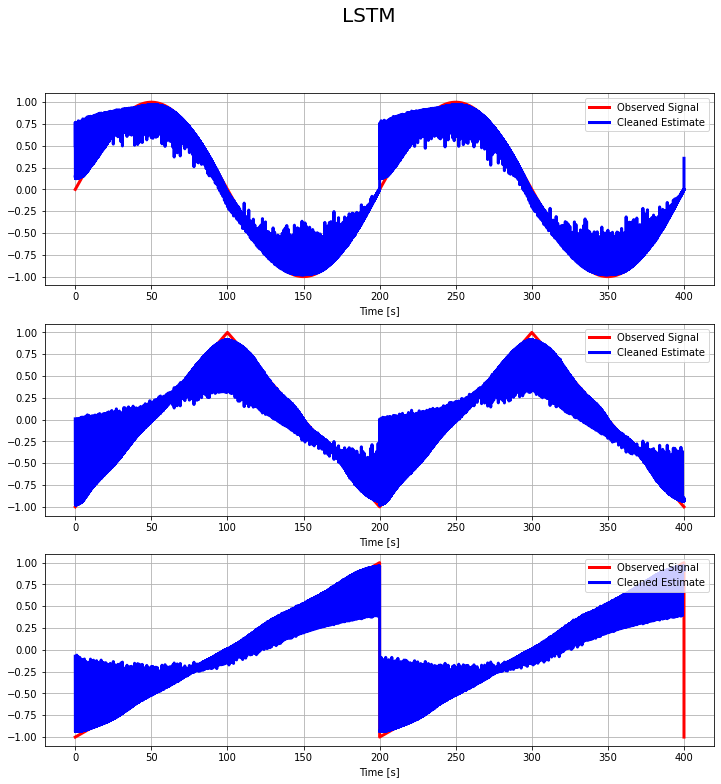

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('LSTM', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

In [ ]:
print('sin')
print(f'SNR Sin Signal is {SNRsystem(sin,noisy_sin)} dB')
print(f'SNR Sin Signal(output of LSTM) is {SNRsystem(sin_test.flatten(),sin_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Triangel')
print(f'SNR Triangle Signal is {SNRsystem(triangle,noisy_triangle)} dB')
print(f'SNR Triangle Signal(output of LSTM) is {SNRsystem(triangle_test.flatten(),triangle_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Saw thooth')
print(f'SNR Saw thooth Signal is {SNRsystem(saw_tooth,noisy_saw_tooth)} dB')
print(f'SNR Saw thooth Signal(output of LSTM) is {SNRsystem(saw_tooth_test.flatten(),saw_tooth_pred.flatten() )} dB')
print('*******************************************************************************************')

sin
SNR Sin Signal is -24.027496717875184 dB
SNR Sin Signal(output of LSTM) is 27.16994706429887 dB
*******************************************************************************************
Triangel
SNR Triangle Signal is -25.841878428981566 dB
SNR Triangle Signal(output of LSTM) is 24.24193880679968 dB
*******************************************************************************************
Saw thooth
SNR Saw thooth Signal is -25.710103962386235 dB
SNR Saw thooth Signal(output of LSTM) is 27.22429414094767 dB
*******************************************************************************************


**Comparing Learning Rate (lr=0.01,lr=0.001) in LSTM**

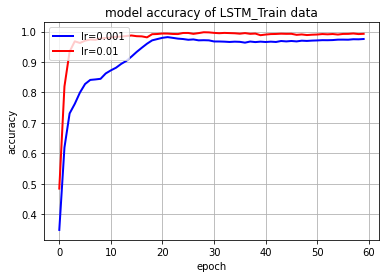

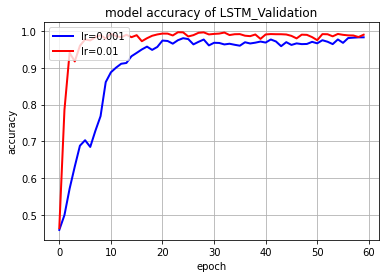

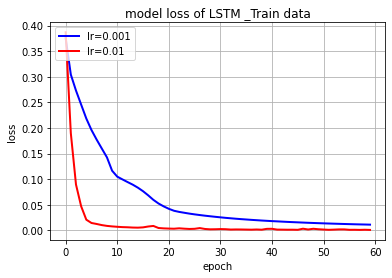

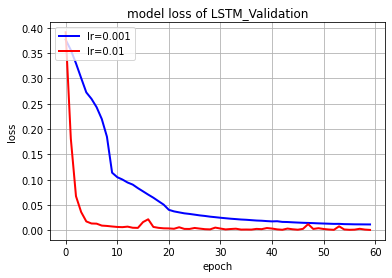

In [ ]:
plt.plot(history_1DLSTM.history['accuracy'],color='b',linewidth=2.0)
plt.plot(history_1RLSTM.history['accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy of LSTM_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DLSTM.history['val_accuracy'],color='b',linewidth=2.0)
plt.plot(history_1RLSTM.history['val_accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy of LSTM_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DLSTM.history['loss'],color='b',linewidth=2.0)
plt.plot(history_1RLSTM.history['loss'],color='r',linewidth=2.0)

plt.title('model loss of LSTM _Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DLSTM.history['val_loss'],color='b',linewidth=2.0)
plt.plot(history_1RLSTM.history['val_loss'],color='r',linewidth=2.0)

plt.title('model loss of LSTM_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

**Increasing learning Rate in RNN**

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This RNN will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.SimpleRNN(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_1RRNN=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=32, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
44/44 [==============================] - 49s 1s/step - loss: 0.5256 - accuracy: 0.6118 - val_loss: 0.3052 - val_accuracy: 0.7844
Epoch 2/60
44/44 [==============================] - 49s 1s/step - loss: 0.0811 - accuracy: 0.9164 - val_loss: 0.0494 - val_accuracy: 0.9597
Epoch 3/60
44/44 [==============================] - 49s 1s/step - loss: 0.0448 - accuracy: 0.9590 - val_loss: 0.0450 - val_accuracy: 0.9584
Epoch 4/60
44/44 [==============================] - 48s 1s/step - loss: 0.0438 - accuracy: 0.9548 - val_loss: 0.0459 - val_accuracy: 0.9589
Epoch 5/60
44/44 [==============================] - 49s 1s/step - loss: 0.0437 - accuracy: 0.9538 - val_loss: 0.0441 - val_accuracy: 0.9489
Epoch 6/60
44/44 [==============================] - 48s 1s/step - loss: 0.0430 - accuracy: 0.9559 - val_loss: 0.0434 - val_accuracy: 0.9579
Epoch 7/60
44/44 [==============================] - 49s 1s/step - loss: 0.0428 - accuracy: 0.9583 - val_loss: 0.0437 - val_accuracy: 0.9595
Epoch 8/60
44/44 [==

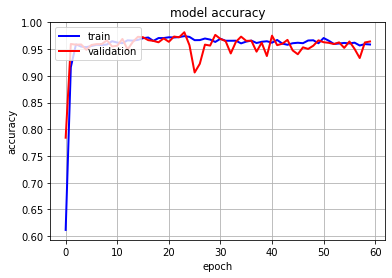

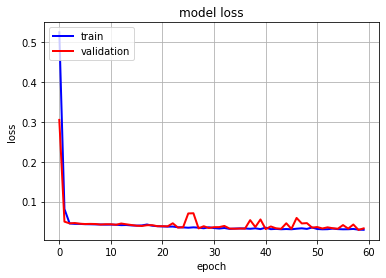

In [ ]:
plothist(history_1RRNN)
plothist_loss(history_1RRNN)

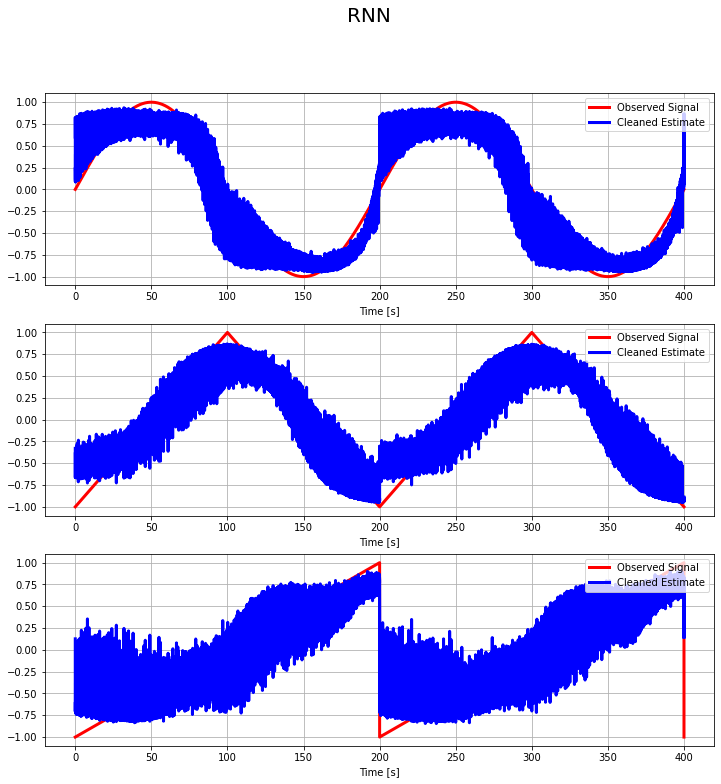

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('RNN', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

In [ ]:
print('sin')
print(f'SNR Sin Signal is {SNRsystem(sin,noisy_sin)} dB')
print(f'SNR Sin Signal(output of LSTM) is {SNRsystem(sin_test.flatten(),sin_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Triangel')
print(f'SNR Triangle Signal is {SNRsystem(triangle,noisy_triangle)} dB')
print(f'SNR Triangle Signal(output of LSTM) is {SNRsystem(triangle_test.flatten(),triangle_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Saw thooth')
print(f'SNR Saw thooth Signal is {SNRsystem(saw_tooth,noisy_saw_tooth)} dB')
print(f'SNR Saw thooth Signal(output of LSTM) is {SNRsystem(saw_tooth_test.flatten(),saw_tooth_pred.flatten() )} dB')
print('*******************************************************************************************')

sin
SNR Sin Signal is -24.027496717875184 dB
SNR Sin Signal(output of LSTM) is 11.185506130403468 dB
*******************************************************************************************
Triangel
SNR Triangle Signal is -25.841878428981566 dB
SNR Triangle Signal(output of LSTM) is 9.788081422900978 dB
*******************************************************************************************
Saw thooth
SNR Saw thooth Signal is -25.710103962386235 dB
SNR Saw thooth Signal(output of LSTM) is 8.168871217347032 dB
*******************************************************************************************


**Comparing Learning Rate (lr=0.01,lr=0.001) in RNN**

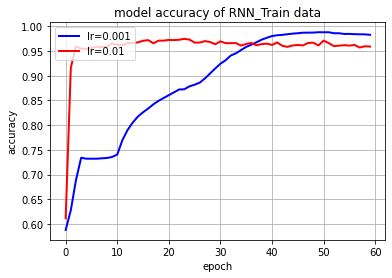

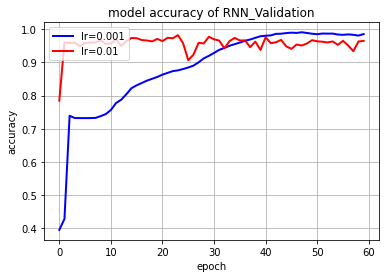

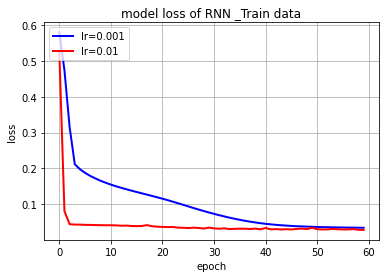

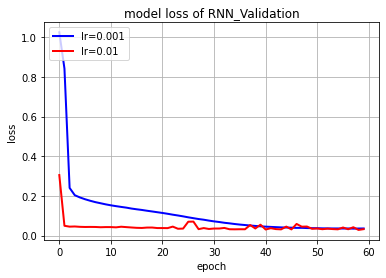

In [ ]:
plt.plot(history_1DRNN.history['accuracy'],color='b',linewidth=2.0)
plt.plot(history_1RRNN.history['accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy of RNN_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DRNN.history['val_accuracy'],color='b',linewidth=2.0)
plt.plot(history_1RRNN.history['val_accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy of RNN_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DRNN.history['loss'],color='b',linewidth=2.0)
plt.plot(history_1RRNN.history['loss'],color='r',linewidth=2.0)

plt.title('model loss of RNN _Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_1DRNN.history['val_loss'],color='b',linewidth=2.0)
plt.plot(history_1RRNN.history['val_loss'],color='r',linewidth=2.0)

plt.title('model loss of RNN_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['lr=0.001', 'lr=0.01'], loc='upper left')
plt.grid()
plt.show()

### **2: Changing Batch Size**

**Changing Batch Size in LSTM**

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_B64LSTM=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=64, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
22/22 [==============================] - 5s 151ms/step - loss: 0.3607 - accuracy: 0.6005 - val_loss: 0.3270 - val_accuracy: 0.6383
Epoch 2/60
22/22 [==============================] - 3s 124ms/step - loss: 0.2592 - accuracy: 0.6922 - val_loss: 0.2785 - val_accuracy: 0.6591
Epoch 3/60
22/22 [==============================] - 3s 125ms/step - loss: 0.2033 - accuracy: 0.7511 - val_loss: 0.2388 - val_accuracy: 0.6282
Epoch 4/60
22/22 [==============================] - 3s 124ms/step - loss: 0.1463 - accuracy: 0.8112 - val_loss: 0.1936 - val_accuracy: 0.6933
Epoch 5/60
22/22 [==============================] - 3s 125ms/step - loss: 0.0972 - accuracy: 0.9026 - val_loss: 0.0985 - val_accuracy: 0.9004
Epoch 6/60
22/22 [==============================] - 3s 129ms/step - loss: 0.0600 - accuracy: 0.9600 - val_loss: 0.0510 - val_accuracy: 0.9393
Epoch 7/60
22/22 [==============================] - 3s 125ms/step - loss: 0.0358 - accuracy: 0.9652 - val_loss: 0.0289 - val_accuracy: 0.9503
Epoch 

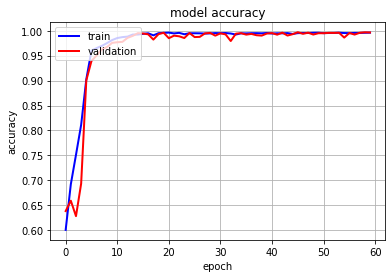

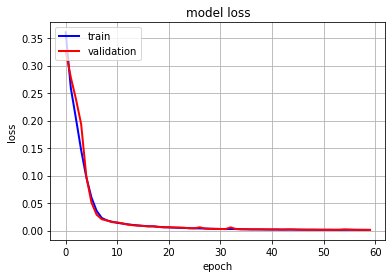

In [ ]:
plothist(history_B64LSTM)
plothist_loss(history_B64LSTM)

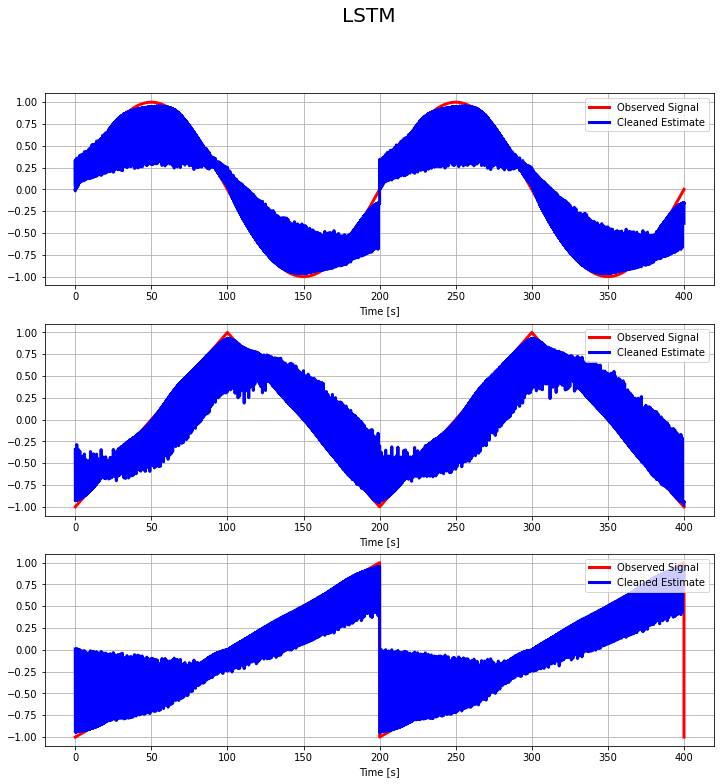

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('LSTM', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

In [ ]:
print('sin')
print(f'SNR Sin Signal is {SNRsystem(sin,noisy_sin)} dB')
print(f'SNR Sin Signal(output of LSTM) is {SNRsystem(sin_test.flatten(),sin_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Triangel')
print(f'SNR Triangle Signal is {SNRsystem(triangle,noisy_triangle)} dB')
print(f'SNR Triangle Signal(output of LSTM) is {SNRsystem(triangle_test.flatten(),triangle_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Saw thooth')
print(f'SNR Saw thooth Signal is {SNRsystem(saw_tooth,noisy_saw_tooth)} dB')
print(f'SNR Saw thooth Signal(output of LSTM) is {SNRsystem(saw_tooth_test.flatten(),saw_tooth_pred.flatten() )} dB')
print('*******************************************************************************************')

sin
SNR Sin Signal is -24.027496717875184 dB
SNR Sin Signal(output of LSTM) is 25.368520958643824 dB
*******************************************************************************************
Triangel
SNR Triangle Signal is -25.841878428981566 dB
SNR Triangle Signal(output of LSTM) is 23.416261103596305 dB
*******************************************************************************************
Saw thooth
SNR Saw thooth Signal is -25.710103962386235 dB
SNR Saw thooth Signal(output of LSTM) is 26.738501481563027 dB
*******************************************************************************************


**Batch Size=16, LSTM**

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_B16LSTM=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=16, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
88/88 [==============================] - 13s 121ms/step - loss: 0.1806 - accuracy: 0.7430 - val_loss: 0.2376 - val_accuracy: 0.6401
Epoch 2/60
88/88 [==============================] - 10s 115ms/step - loss: 0.0512 - accuracy: 0.9379 - val_loss: 0.0254 - val_accuracy: 0.9740
Epoch 3/60
88/88 [==============================] - 10s 115ms/step - loss: 0.0195 - accuracy: 0.9745 - val_loss: 0.0217 - val_accuracy: 0.9630
Epoch 4/60
88/88 [==============================] - 10s 115ms/step - loss: 0.0143 - accuracy: 0.9831 - val_loss: 0.0114 - val_accuracy: 0.9867
Epoch 5/60
88/88 [==============================] - 10s 115ms/step - loss: 0.0113 - accuracy: 0.9818 - val_loss: 0.0132 - val_accuracy: 0.9842
Epoch 6/60
88/88 [==============================] - 10s 115ms/step - loss: 0.0109 - accuracy: 0.9806 - val_loss: 0.0143 - val_accuracy: 0.9663
Epoch 7/60
88/88 [==============================] - 10s 115ms/step - loss: 0.0080 - accuracy: 0.9822 - val_loss: 0.0073 - val_accuracy: 0.9851

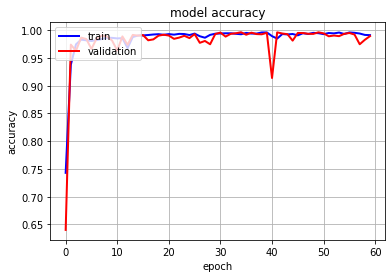

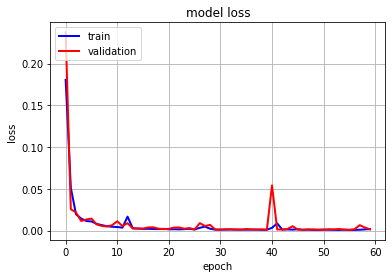

In [ ]:
plothist(history_B16LSTM)
plothist_loss(history_B16LSTM)

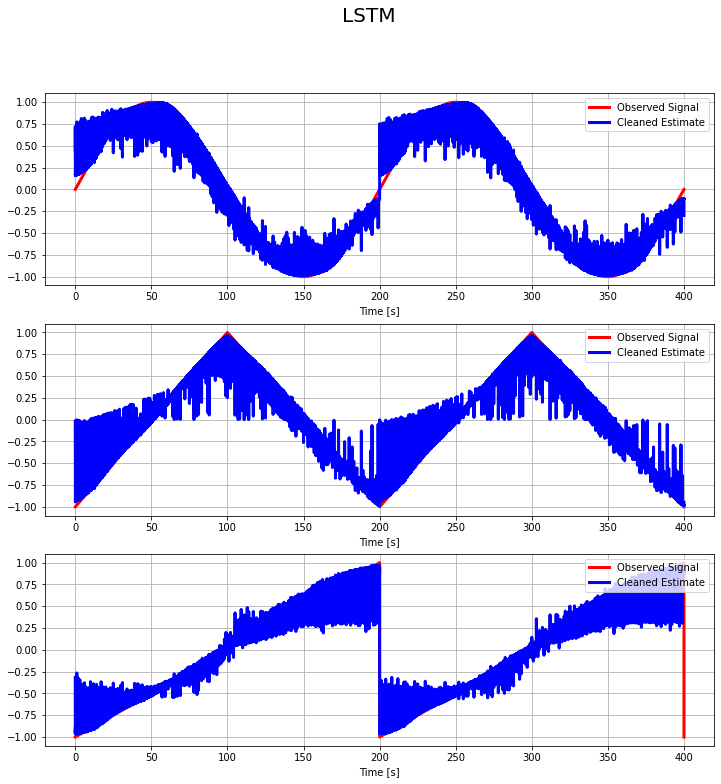

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('LSTM', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

In [ ]:
print('sin')
print(f'SNR Sin Signal is {SNRsystem(sin,noisy_sin)} dB')
print(f'SNR Sin Signal(output of LSTM) is {SNRsystem(sin_test.flatten(),sin_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Triangel')
print(f'SNR Triangle Signal is {SNRsystem(triangle,noisy_triangle)} dB')
print(f'SNR Triangle Signal(output of LSTM) is {SNRsystem(triangle_test.flatten(),triangle_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Saw thooth')
print(f'SNR Saw thooth Signal is {SNRsystem(saw_tooth,noisy_saw_tooth)} dB')
print(f'SNR Saw thooth Signal(output of LSTM) is {SNRsystem(saw_tooth_test.flatten(),saw_tooth_pred.flatten() )} dB')
print('*******************************************************************************************')

sin
SNR Sin Signal is -24.027496717875184 dB
SNR Sin Signal(output of LSTM) is 24.976521274287332 dB
*******************************************************************************************
Triangel
SNR Triangle Signal is -25.841878428981566 dB
SNR Triangle Signal(output of LSTM) is 24.33201213112632 dB
*******************************************************************************************
Saw thooth
SNR Saw thooth Signal is -25.710103962386235 dB
SNR Saw thooth Signal(output of LSTM) is 23.209783301746405 dB
*******************************************************************************************


**Batch Size=128,LSTM**

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_B128LSTM=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=128, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
11/11 [==============================] - 4s 189ms/step - loss: 0.6433 - accuracy: 0.1957 - val_loss: 0.6220 - val_accuracy: 0.3963
Epoch 2/60
11/11 [==============================] - 1s 131ms/step - loss: 0.5297 - accuracy: 0.3054 - val_loss: 0.5917 - val_accuracy: 0.3947
Epoch 3/60
11/11 [==============================] - 1s 132ms/step - loss: 0.4670 - accuracy: 0.3751 - val_loss: 0.5570 - val_accuracy: 0.3951
Epoch 4/60
11/11 [==============================] - 1s 135ms/step - loss: 0.4060 - accuracy: 0.4546 - val_loss: 0.4541 - val_accuracy: 0.3697
Epoch 5/60
11/11 [==============================] - 1s 133ms/step - loss: 0.3308 - accuracy: 0.5809 - val_loss: 0.3823 - val_accuracy: 0.4165
Epoch 6/60
11/11 [==============================] - 1s 131ms/step - loss: 0.2898 - accuracy: 0.6585 - val_loss: 0.3573 - val_accuracy: 0.4645
Epoch 7/60
11/11 [==============================] - 1s 133ms/step - loss: 0.2566 - accuracy: 0.6762 - val_loss: 0.3436 - val_accuracy: 0.4764
Epoch 

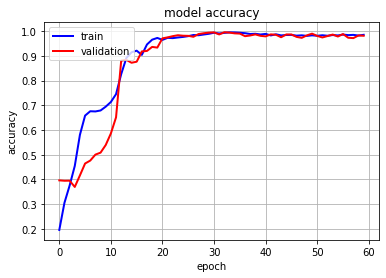

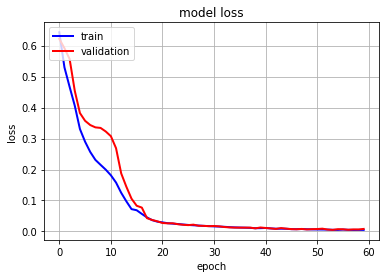

In [ ]:
plothist(history_B128LSTM)
plothist_loss(history_B128LSTM)

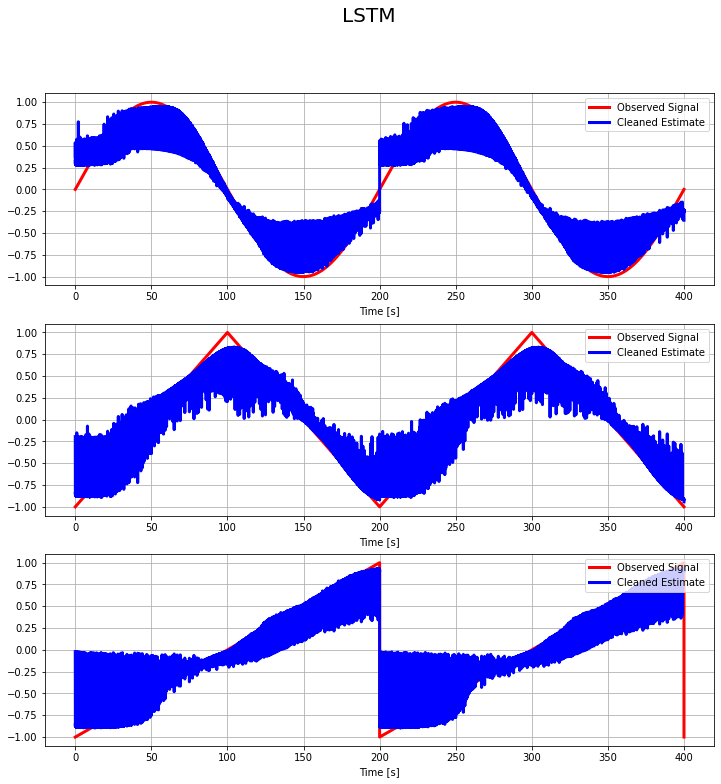

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('LSTM', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

In [ ]:
print('sin')
print(f'SNR Sin Signal is {SNRsystem(sin,noisy_sin)} dB')
print(f'SNR Sin Signal(output of LSTM) is {SNRsystem(sin_test.flatten(),sin_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Triangel')
print(f'SNR Triangle Signal is {SNRsystem(triangle,noisy_triangle)} dB')
print(f'SNR Triangle Signal(output of LSTM) is {SNRsystem(triangle_test.flatten(),triangle_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Saw thooth')
print(f'SNR Saw thooth Signal is {SNRsystem(saw_tooth,noisy_saw_tooth)} dB')
print(f'SNR Saw thooth Signal(output of LSTM) is {SNRsystem(saw_tooth_test.flatten(),saw_tooth_pred.flatten() )} dB')
print('*******************************************************************************************')

sin
SNR Sin Signal is -24.027496717875184 dB
SNR Sin Signal(output of LSTM) is 15.459830225982234 dB
*******************************************************************************************
Triangel
SNR Triangle Signal is -25.841878428981566 dB
SNR Triangle Signal(output of LSTM) is 15.651805131802021 dB
*******************************************************************************************
Saw thooth
SNR Saw thooth Signal is -25.710103962386235 dB
SNR Saw thooth Signal(output of LSTM) is 19.43740584018634 dB
*******************************************************************************************


**Comparing Batch size (B=16,32,64,128) in LSTM**

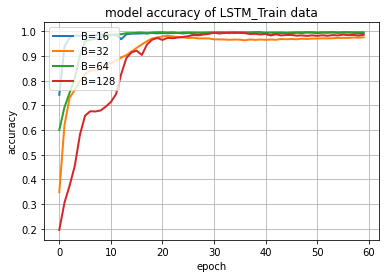

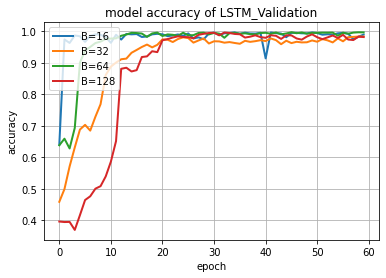

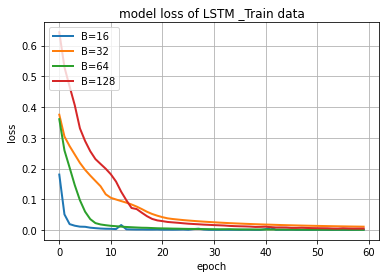

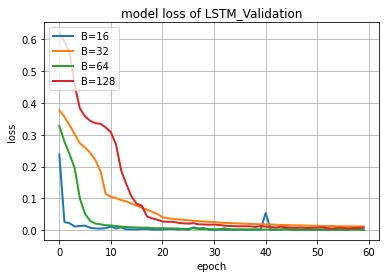

In [ ]:
plt.plot(history_B16LSTM.history['accuracy'],linewidth=2.0)
plt.plot(history_1DLSTM.history['accuracy'],linewidth=2.0)
plt.plot(history_B64LSTM.history['accuracy'],linewidth=2.0)
plt.plot(history_B128LSTM.history['accuracy'],linewidth=2.0)

plt.title('model accuracy of LSTM_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_B16LSTM.history['val_accuracy'],linewidth=2.0)
plt.plot(history_1DLSTM.history['val_accuracy'],linewidth=2.0)
plt.plot(history_B64LSTM.history['val_accuracy'],linewidth=2.0)
plt.plot(history_B128LSTM.history['val_accuracy'],linewidth=2.0)


plt.title('model accuracy of LSTM_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_B16LSTM.history['loss'],linewidth=2.0)
plt.plot(history_1DLSTM.history['loss'],linewidth=2.0)
plt.plot(history_B64LSTM.history['loss'],linewidth=2.0)
plt.plot(history_B128LSTM.history['loss'],linewidth=2.0)

plt.title('model loss of LSTM _Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_B16LSTM.history['val_loss'],linewidth=2.0)
plt.plot(history_1DLSTM.history['val_loss'],linewidth=2.0)
plt.plot(history_B64LSTM.history['val_loss'],linewidth=2.0)
plt.plot(history_B128LSTM.history['val_loss'],linewidth=2.0)

plt.title('model loss of LSTM_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

**Changing Batch Size in RNN**

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.SimpleRNN(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_B64RNN=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=64, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
22/22 [==============================] - 25s 1s/step - loss: 0.9658 - accuracy: 0.2828 - val_loss: 0.9425 - val_accuracy: 0.3199
Epoch 2/60
22/22 [==============================] - 24s 1s/step - loss: 0.7440 - accuracy: 0.4536 - val_loss: 0.7820 - val_accuracy: 0.4157
Epoch 3/60
22/22 [==============================] - 24s 1s/step - loss: 0.4333 - accuracy: 0.5425 - val_loss: 0.3925 - val_accuracy: 0.5084
Epoch 4/60
22/22 [==============================] - 25s 1s/step - loss: 0.3041 - accuracy: 0.5081 - val_loss: 0.2720 - val_accuracy: 0.4872
Epoch 5/60
22/22 [==============================] - 24s 1s/step - loss: 0.2460 - accuracy: 0.4503 - val_loss: 0.2322 - val_accuracy: 0.5208
Epoch 6/60
22/22 [==============================] - 24s 1s/step - loss: 0.2132 - accuracy: 0.4886 - val_loss: 0.2005 - val_accuracy: 0.5318
Epoch 7/60
22/22 [==============================] - 24s 1s/step - loss: 0.1917 - accuracy: 0.5773 - val_loss: 0.1836 - val_accuracy: 0.6235
Epoch 8/60
22/22 [==

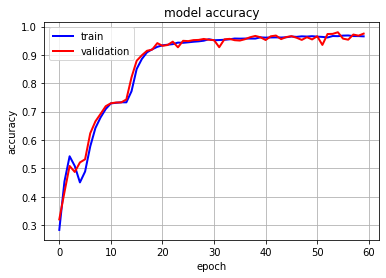

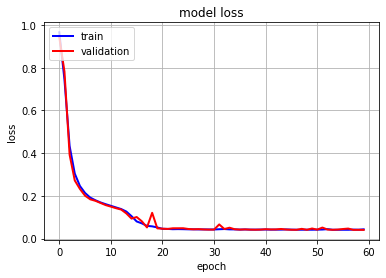

In [ ]:
plothist(history_B64RNN)
plothist_loss(history_B64RNN)

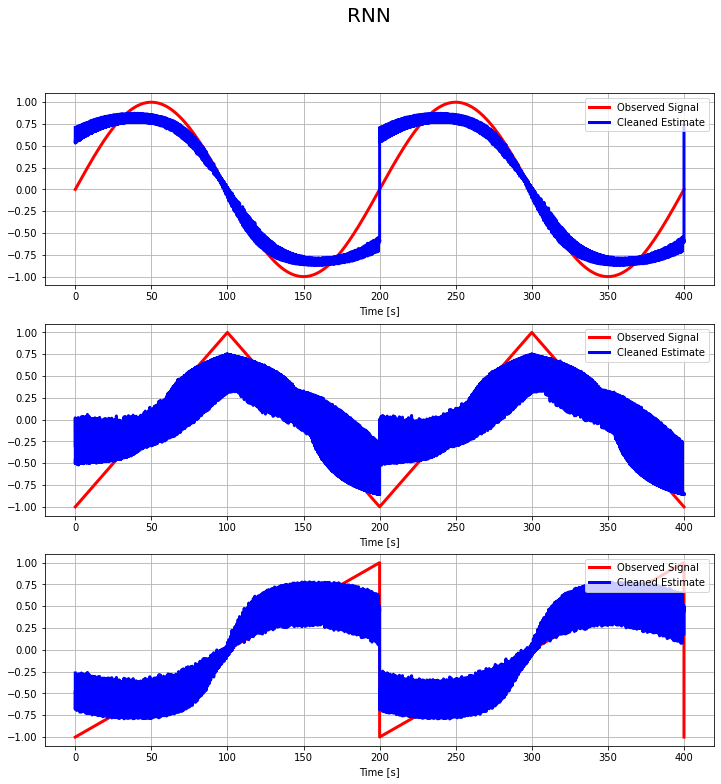

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('RNN', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

In [ ]:
print('sin')
print(f'SNR Sin Signal is {SNRsystem(sin,noisy_sin)} dB')
print(f'SNR Sin Signal(output of LSTM) is {SNRsystem(sin_test.flatten(),sin_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Triangel')
print(f'SNR Triangle Signal is {SNRsystem(triangle,noisy_triangle)} dB')
print(f'SNR Triangle Signal(output of LSTM) is {SNRsystem(triangle_test.flatten(),triangle_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Saw thooth')
print(f'SNR Saw thooth Signal is {SNRsystem(saw_tooth,noisy_saw_tooth)} dB')
print(f'SNR Saw thooth Signal(output of LSTM) is {SNRsystem(saw_tooth_test.flatten(),saw_tooth_pred.flatten() )} dB')
print('*******************************************************************************************')

sin
SNR Sin Signal is -24.027496717875184 dB
SNR Sin Signal(output of LSTM) is 9.093522916301527 dB
*******************************************************************************************
Triangel
SNR Triangle Signal is -25.841878428981566 dB
SNR Triangle Signal(output of LSTM) is 9.57579260604158 dB
*******************************************************************************************
Saw thooth
SNR Saw thooth Signal is -25.710103962386235 dB
SNR Saw thooth Signal(output of LSTM) is 7.33798766440822 dB
*******************************************************************************************


**Batch Size=16, RNN**

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.SimpleRNN(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_B16RNN=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=16, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
88/88 [==============================] - 94s 1s/step - loss: 0.3268 - accuracy: 0.7704 - val_loss: 0.0705 - val_accuracy: 0.9355
Epoch 2/60
88/88 [==============================] - 90s 1s/step - loss: 0.0405 - accuracy: 0.9803 - val_loss: 0.0339 - val_accuracy: 0.9836
Epoch 3/60
88/88 [==============================] - 93s 1s/step - loss: 0.0345 - accuracy: 0.9826 - val_loss: 0.0352 - val_accuracy: 0.9831
Epoch 4/60
88/88 [==============================] - 92s 1s/step - loss: 0.0352 - accuracy: 0.9858 - val_loss: 0.0407 - val_accuracy: 0.9760
Epoch 5/60
88/88 [==============================] - 91s 1s/step - loss: 0.0338 - accuracy: 0.9851 - val_loss: 0.0364 - val_accuracy: 0.9790
Epoch 6/60
88/88 [==============================] - 93s 1s/step - loss: 0.0331 - accuracy: 0.9886 - val_loss: 0.0620 - val_accuracy: 0.9605
Epoch 7/60
88/88 [==============================] - 91s 1s/step - loss: 0.0378 - accuracy: 0.9822 - val_loss: 0.0377 - val_accuracy: 0.9767
Epoch 8/60
88/88 [==

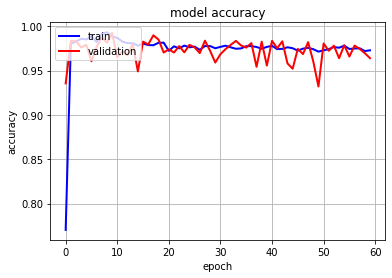

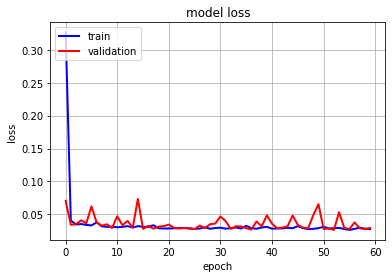

In [ ]:
plothist(history_B16RNN)
plothist_loss(history_B16RNN)

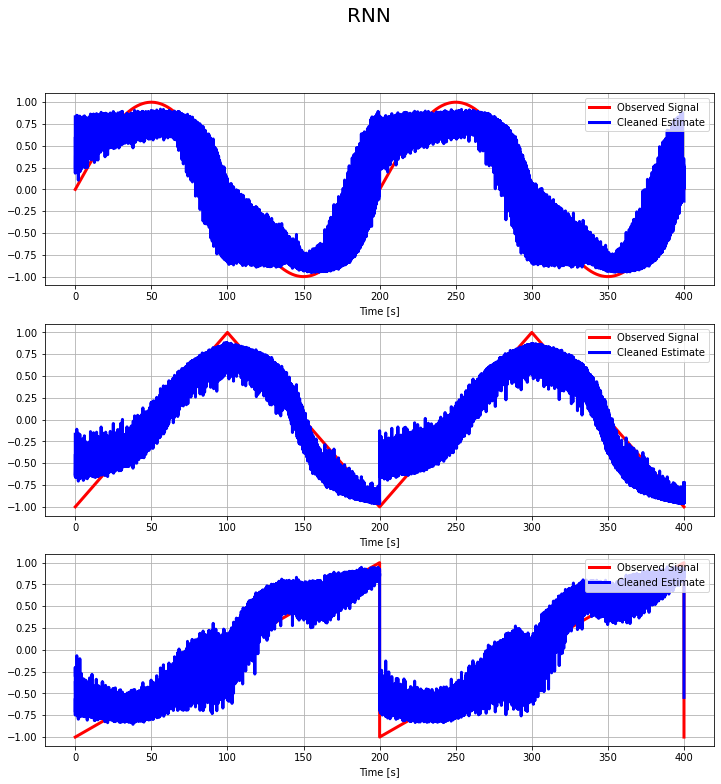

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('RNN', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

In [ ]:
print('sin')
print(f'SNR Sin Signal is {SNRsystem(sin,noisy_sin)} dB')
print(f'SNR Sin Signal(output of LSTM) is {SNRsystem(sin_test.flatten(),sin_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Triangel')
print(f'SNR Triangle Signal is {SNRsystem(triangle,noisy_triangle)} dB')
print(f'SNR Triangle Signal(output of LSTM) is {SNRsystem(triangle_test.flatten(),triangle_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Saw thooth')
print(f'SNR Saw thooth Signal is {SNRsystem(saw_tooth,noisy_saw_tooth)} dB')
print(f'SNR Saw thooth Signal(output of LSTM) is {SNRsystem(saw_tooth_test.flatten(),saw_tooth_pred.flatten() )} dB')
print('*******************************************************************************************')

sin
SNR Sin Signal is -24.027496717875184 dB
SNR Sin Signal(output of LSTM) is 11.636017286558722 dB
*******************************************************************************************
Triangel
SNR Triangle Signal is -25.841878428981566 dB
SNR Triangle Signal(output of LSTM) is 9.940838945438491 dB
*******************************************************************************************
Saw thooth
SNR Saw thooth Signal is -25.710103962386235 dB
SNR Saw thooth Signal(output of LSTM) is 9.799787334199623 dB
*******************************************************************************************


**Batch Size=128,RNN**

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.SimpleRNN(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_B128RNN=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=128, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
11/11 [==============================] - 13s 1s/step - loss: 0.8128 - accuracy: 0.4723 - val_loss: 1.2018 - val_accuracy: 0.3823
Epoch 2/60
11/11 [==============================] - 12s 1s/step - loss: 0.6981 - accuracy: 0.5287 - val_loss: 1.1644 - val_accuracy: 0.3870
Epoch 3/60
11/11 [==============================] - 12s 1s/step - loss: 0.5803 - accuracy: 0.5996 - val_loss: 1.1107 - val_accuracy: 0.3959
Epoch 4/60
11/11 [==============================] - 12s 1s/step - loss: 0.4762 - accuracy: 0.6520 - val_loss: 0.9036 - val_accuracy: 0.4397
Epoch 5/60
11/11 [==============================] - 12s 1s/step - loss: 0.3420 - accuracy: 0.6939 - val_loss: 0.5188 - val_accuracy: 0.6192
Epoch 6/60
11/11 [==============================] - 12s 1s/step - loss: 0.2139 - accuracy: 0.7269 - val_loss: 0.2566 - val_accuracy: 0.7216
Epoch 7/60
11/11 [==============================] - 12s 1s/step - loss: 0.1641 - accuracy: 0.7545 - val_loss: 0.1683 - val_accuracy: 0.7790
Epoch 8/60
11/11 [==

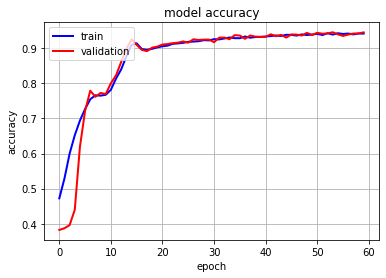

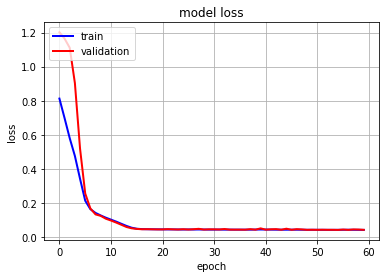

In [ ]:
plothist(history_B128RNN)
plothist_loss(history_B128RNN)

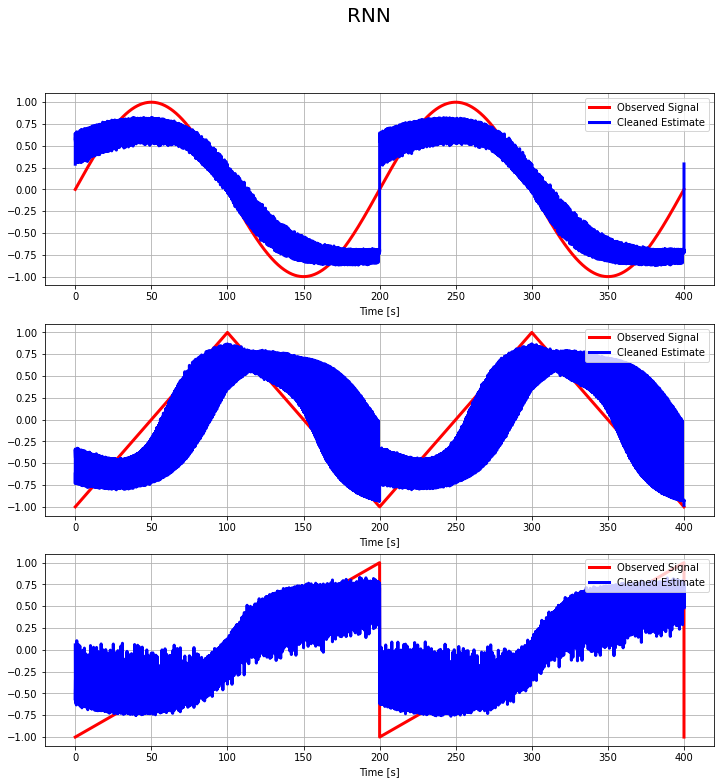

In [ ]:
sin_pred      =y_hat[:,:,0]
triangle_pred =y_hat[:,:,1]
saw_tooth_pred=y_hat[:,:,2]

sin_test      =y_test[:,:,0]
triangle_test =y_test[:,:,1]
saw_tooth_test=y_test[:,:,2]

#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(12,12))
fig.suptitle('RNN', fontsize=20)
ax1 = fig.add_subplot(311)
ax1.plot(time, sin_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, sin_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

ax2 = fig.add_subplot(312)
ax2.plot(time, triangle_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax2.plot(time, triangle_pred.flatten(), label='Cleaned Estimate',lw=3.0, c='b')
ax2.legend(loc='upper right')
ax2.grid(True)
ax2.set_xlabel('Time [s]')

ax3 = fig.add_subplot(313)
ax3.plot(time, saw_tooth_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax3.plot(time, saw_tooth_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax3.legend(loc='upper right')
ax3.grid(True)
ax3.set_xlabel('Time [s]')

plt.show()
plt.close()

In [ ]:
print('sin')
print(f'SNR Sin Signal is {SNRsystem(sin,noisy_sin)} dB')
print(f'SNR Sin Signal(output of LSTM) is {SNRsystem(sin_test.flatten(),sin_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Triangel')
print(f'SNR Triangle Signal is {SNRsystem(triangle,noisy_triangle)} dB')
print(f'SNR Triangle Signal(output of LSTM) is {SNRsystem(triangle_test.flatten(),triangle_pred.flatten() )} dB')
print('*******************************************************************************************')
print('Saw thooth')
print(f'SNR Saw thooth Signal is {SNRsystem(saw_tooth,noisy_saw_tooth)} dB')
print(f'SNR Saw thooth Signal(output of LSTM) is {SNRsystem(saw_tooth_test.flatten(),saw_tooth_pred.flatten() )} dB')
print('*******************************************************************************************')

sin
SNR Sin Signal is -24.027496717875184 dB
SNR Sin Signal(output of LSTM) is 7.585736542393211 dB
*******************************************************************************************
Triangel
SNR Triangle Signal is -25.841878428981566 dB
SNR Triangle Signal(output of LSTM) is 9.090117028534536 dB
*******************************************************************************************
Saw thooth
SNR Saw thooth Signal is -25.710103962386235 dB
SNR Saw thooth Signal(output of LSTM) is 8.193793760824446 dB
*******************************************************************************************


**Comparing Batch size (B=16,32,64,128) in RNN**

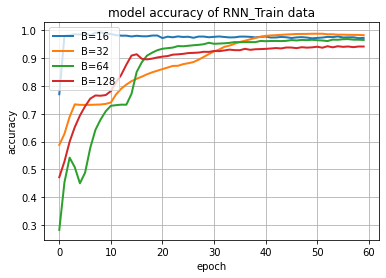

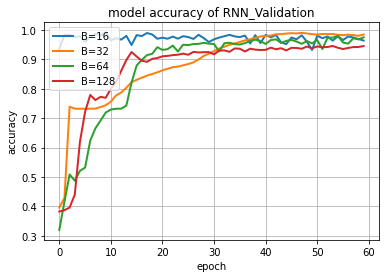

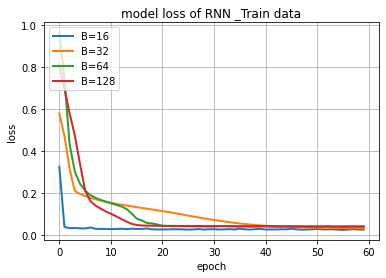

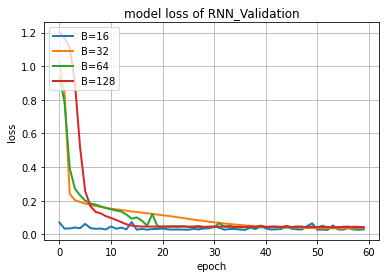

In [ ]:
plt.plot(history_B16RNN.history['accuracy'],linewidth=2.0)
plt.plot(history_1DRNN.history['accuracy'],linewidth=2.0)
plt.plot(history_B64RNN.history['accuracy'],linewidth=2.0)
plt.plot(history_B128RNN.history['accuracy'],linewidth=2.0)

plt.title('model accuracy of RNN_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_B16RNN.history['val_accuracy'],linewidth=2.0)
plt.plot(history_1DRNN.history['val_accuracy'],linewidth=2.0)
plt.plot(history_B64RNN.history['val_accuracy'],linewidth=2.0)
plt.plot(history_B128RNN.history['val_accuracy'],linewidth=2.0)


plt.title('model accuracy of RNN_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_B16RNN.history['loss'],linewidth=2.0)
plt.plot(history_1DRNN.history['loss'],linewidth=2.0)
plt.plot(history_B64RNN.history['loss'],linewidth=2.0)
plt.plot(history_B128RNN.history['loss'],linewidth=2.0)

plt.title('model loss of RNN _Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_B16RNN.history['val_loss'],linewidth=2.0)
plt.plot(history_1DRNN.history['val_loss'],linewidth=2.0)
plt.plot(history_B64RNN.history['val_loss'],linewidth=2.0)
plt.plot(history_B128RNN.history['val_loss'],linewidth=2.0)

plt.title('model loss of RNN_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['B=16', 'B=32','B=64','B=128'], loc='upper left')
plt.grid()
plt.show()

### **3: Changing Number of Epochs**

**Epoch=20,60,100; LSTM**

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_e100LSTM=model.fit(x_train, y_train, epochs=100, validation_data=(x_valid, y_valid), batch_size=128, verbose=0)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Evaluation with Test Set:
Test loss: 0.0021569160744547844
Test acc: 0.9961075186729431


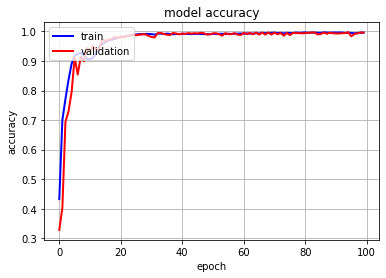

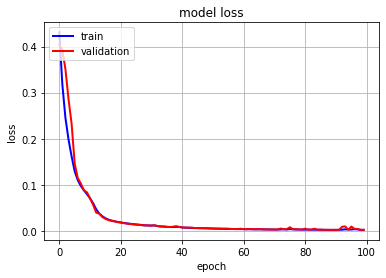

In [ ]:
plothist(history_e100LSTM)
plothist_loss(history_e100LSTM)

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_e20LSTM=model.fit(x_train, y_train, epochs=20, validation_data=(x_valid, y_valid), batch_size=128, verbose=0)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Evaluation with Test Set:
Test loss: 0.011909399181604385
Test acc: 0.972077488899231


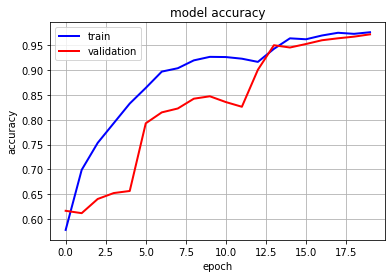

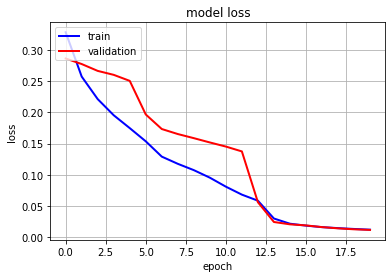

In [ ]:
plothist(history_e20LSTM)
plothist_loss(history_e20LSTM)

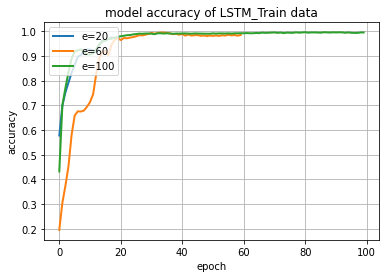

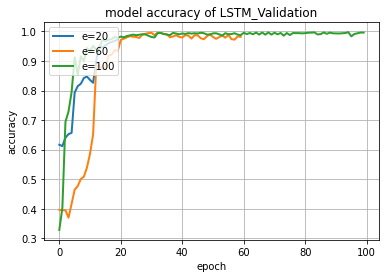

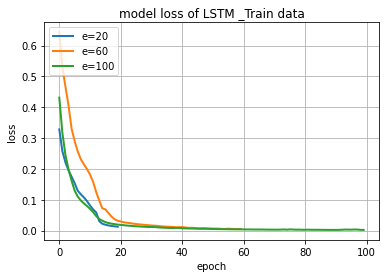

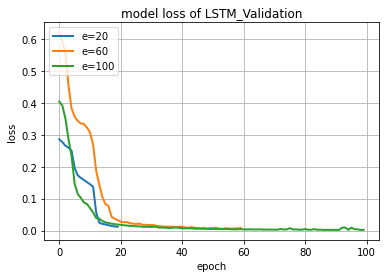

In [ ]:
plt.plot(history_e20LSTM.history['accuracy'],linewidth=2.0)
plt.plot(history_B128LSTM.history['accuracy'],linewidth=2.0)
plt.plot(history_e100LSTM.history['accuracy'],linewidth=2.0)


plt.title('model accuracy of LSTM_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_e20LSTM.history['val_accuracy'],linewidth=2.0)
plt.plot(history_B128LSTM.history['val_accuracy'],linewidth=2.0)
plt.plot(history_e100LSTM.history['val_accuracy'],linewidth=2.0)


plt.title('model accuracy of LSTM_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_e20LSTM.history['loss'],linewidth=2.0)
plt.plot(history_B128LSTM.history['loss'],linewidth=2.0)
plt.plot(history_e100LSTM.history['loss'],linewidth=2.0)

plt.title('model loss of LSTM _Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_e20LSTM.history['val_loss'],linewidth=2.0)
plt.plot(history_B128LSTM.history['val_loss'],linewidth=2.0)
plt.plot(history_e100LSTM.history['val_loss'],linewidth=2.0)

plt.title('model loss of LSTM_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.SimpleRNN(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_e100RNN=model.fit(x_train, y_train, epochs=100, validation_data=(x_valid, y_valid), batch_size=128, verbose=0)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Evaluation with Test Set:
Test loss: 0.03477780893445015
Test acc: 0.992680013179779


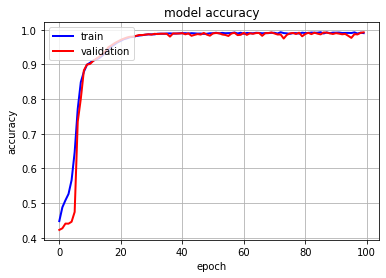

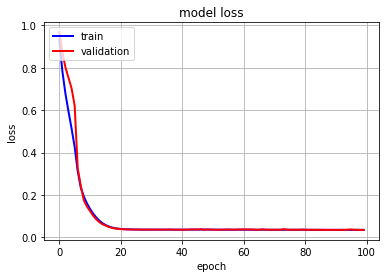

In [ ]:
plothist(history_e100RNN)
plothist_loss(history_e100RNN)

In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (1000, 3), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This LSTM will return timesteps with 3 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 3 features. So the output shape (excluding batch size) is
# (1000, 3), which matches the shape of each data point in data_y above.
model_output = L.SimpleRNN(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_e20RNN=model.fit(x_train, y_train, epochs=20, validation_data=(x_valid, y_valid), batch_size=128, verbose=0)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Evaluation with Test Set:
Test loss: 0.04517831280827522
Test acc: 0.9709625244140625


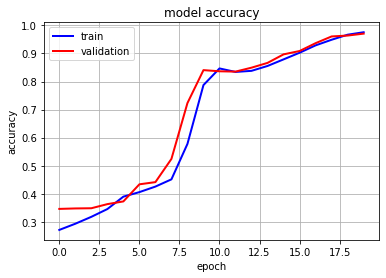

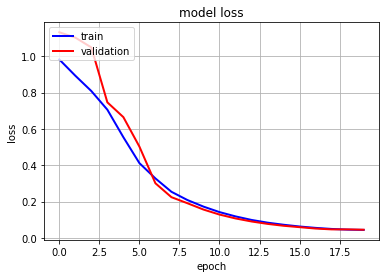

In [ ]:
plothist(history_e20RNN)
plothist_loss(history_e20RNN)

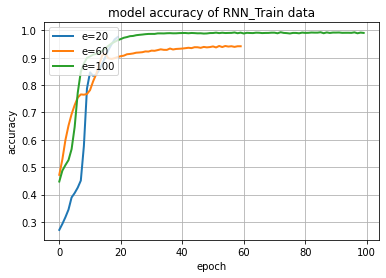

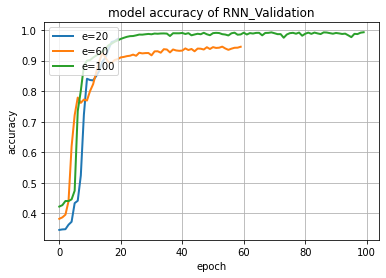

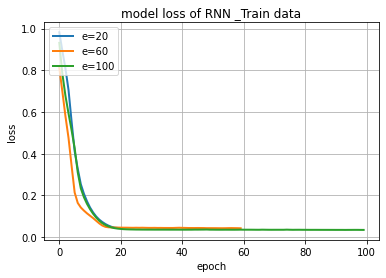

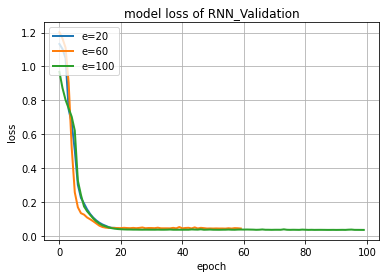

In [ ]:
plt.plot(history_e20RNN.history['accuracy'],linewidth=2.0)
plt.plot(history_B128RNN.history['accuracy'],linewidth=2.0)
plt.plot(history_e100RNN.history['accuracy'],linewidth=2.0)


plt.title('model accuracy of RNN_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_e20RNN.history['val_accuracy'],linewidth=2.0)
plt.plot(history_B128RNN.history['val_accuracy'],linewidth=2.0)
plt.plot(history_e100RNN.history['val_accuracy'],linewidth=2.0)


plt.title('model accuracy of RNN_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_e20RNN.history['loss'],linewidth=2.0)
plt.plot(history_B128RNN.history['loss'],linewidth=2.0)
plt.plot(history_e100RNN.history['loss'],linewidth=2.0)

plt.title('model loss of RNN _Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_e20RNN.history['val_loss'],linewidth=2.0)
plt.plot(history_B128RNN.history['val_loss'],linewidth=2.0)
plt.plot(history_e100RNN.history['val_loss'],linewidth=2.0)

plt.title('model loss of RNN_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['e=20','e=60','e=100'], loc='upper left')
plt.grid()
plt.show()

# **و: Two Dimensional Signals**

## **و.1: Generating true signals and noisy ones**

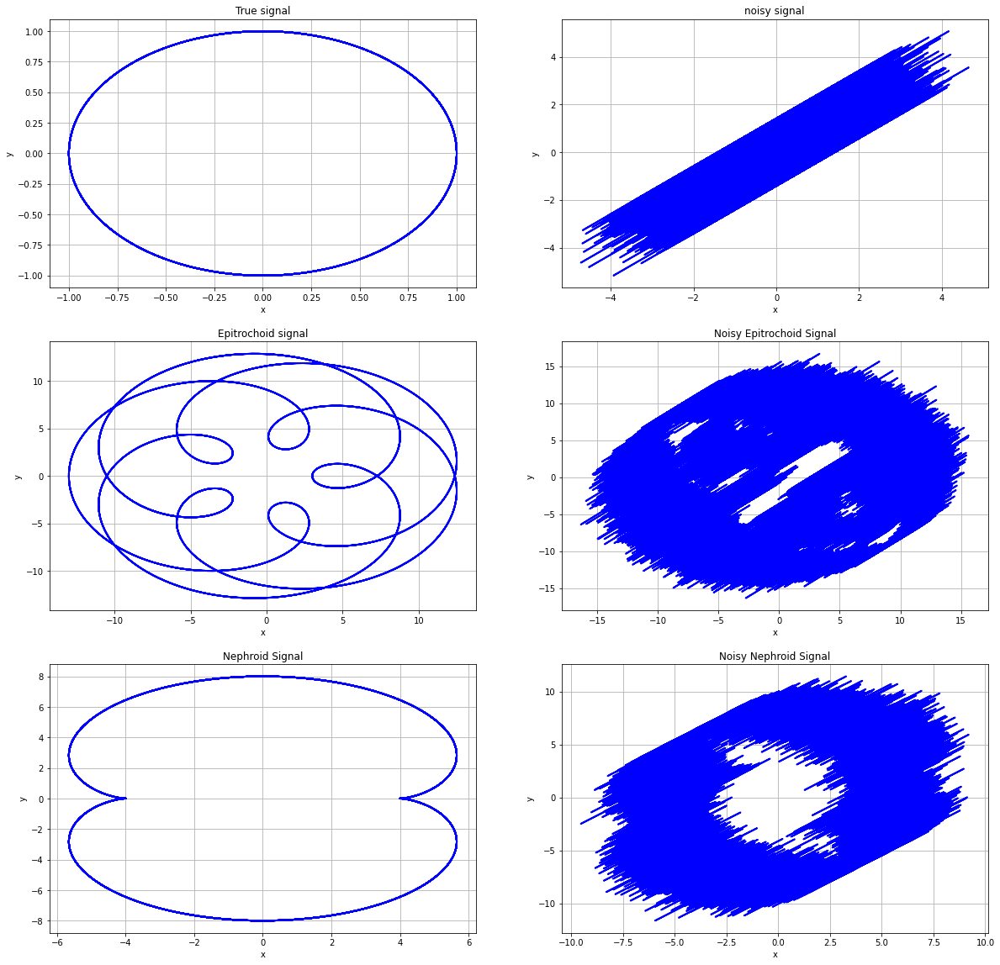

In [ ]:
dur        = 80                # Second (10*2pi)
sample_rate= 1000
freq       = 1                 #Hz, each periods of these waves is 50 second
T          = 8                 #Second

# time, 1000 seconds
t = np.linspace(0, dur, dur*sample_rate)



#true signals

#circle
x = np.cos(t)
y = np.sin(t)

#Epitrochiod
a=5
b=3
c=5
x_E = (a+b)*np.cos(t)-c*np.cos((a/b +1)* t)
y_E = (a+b)*np.sin(t)-c*np.sin((a/b +1)* t)

#Nephroid
a=2
x_N = a*(np.cos(3*t)-3*np.cos(t))
y_N = a*(np.sin(3*t)-3*np.sin(t))


# gaussian noise with mean=0 and variance=1
noise = np.random.normal(0,1,len(x))

# signals with noise
noisy_x  = x  + noise
noisy_y  = y  + noise

noisy_x_E = x_E+noise
noisy_y_E = y_E+noise

noisy_x_N = x_N+noise
noisy_y_N = y_N+noise


#plotting the true waves
plt.figure(figsize=(20,20))
plt.subplot(3,2,1)
plt.plot(x,y,linewidth=2,color='b')
plt.xlabel('x')
plt.ylabel('y')
plt.title('True signal')
plt.grid()

plt.subplot(3,2,2)
plt.plot(noisy_x,noisy_y,linewidth=2,color='b')
plt.xlabel('x')
plt.ylabel('y')
plt.title('noisy signal')
plt.grid()

plt.subplot(3,2,3)
plt.plot(x_E,y_E,linewidth=2,color='b')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Epitrochoid signal')
plt.grid()

plt.subplot(3,2,4)
plt.plot(noisy_x_E,noisy_y_E,linewidth=2,color='b')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Noisy Epitrochoid Signal')
plt.grid()

plt.subplot(3,2,5)
plt.plot(x_N,y_N,linewidth=2,color='b')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Nephroid Signal')
plt.grid()

plt.subplot(3,2,6)
plt.plot(noisy_x_N,noisy_y_N,linewidth=2,color='b')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Noisy Nephroid Signal')
plt.grid()












## **و.2: Circle**

In [ ]:
true_signal = np.array([x,y]).T
noisy_signal= np.array([noisy_x,noisy_y]).T
print(true_signal.shape)
# splitting data into 1 second chunks for our 3 signals
input_data  = np.zeros((dur, sample_rate,2)) # (10*2pi, 1000, 2)
target_data = np.zeros((dur, sample_rate,2)) # (10*2pi, 1000, 2)
y_          = np.zeros((dur, sample_rate,2)) # (10*2pi, 1000, 2)
for i in range(dur):
    st = i*sample_rate
    et = (i+1)*sample_rate
    input_data[i,:]  = noisy_signal [st:et,:]
    target_data[i,:] = true_signal  [st:et,:]


# 7 periods for training data
# 7*2pi second as train data 
ts=7*8
x_train = input_data [:ts, :]
y_train = target_data[:ts, :]


# 1 periods for validation data
# 1*2pi second as train data 
x_valid = input_data [ts:ts+T, :]
y_valid = target_data[ts:ts+T, :]

# test data is the rest of data 
t_test=dur-(ts+T)
x_test = input_data [ts+T:, :]
y_test = target_data[ts+T:, :]


print('x_train, y_train', x_train.shape, y_train.shape)
print('x_valid, y_valid', x_valid.shape, y_valid.shape)
print('x_test, y_test', x_test.shape, y_test.shape)

(80000, 2)
x_train, y_train (56, 1000, 2) (56, 1000, 2)
x_valid, y_valid (8, 1000, 2) (8, 1000, 2)
x_test, y_test (16, 1000, 2) (16, 1000, 2)


In [ ]:
# Each input data point has 1000 timesteps, each with 2 features.
# So the input shape (excluding batch_size) is (1000, 2), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This RNN will return timesteps with 2 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 2 features. So the output shape (excluding batch size) is
# (1000, 2), which matches the shape of each data point in data_y above.
model_output = L.LSTM(2, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.01)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_C=model.fit(x_train, y_train, epochs=100, validation_data=(x_valid, y_valid), batch_size=2, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/100
28/28 [==============================] - 7s 200ms/step - loss: 0.5452 - accuracy: 0.5137 - val_loss: 0.3658 - val_accuracy: 0.7510
Epoch 2/100
28/28 [==============================] - 5s 177ms/step - loss: 0.3525 - accuracy: 0.8488 - val_loss: 0.2721 - val_accuracy: 0.8338
Epoch 3/100
28/28 [==============================] - 5s 183ms/step - loss: 0.2857 - accuracy: 0.8379 - val_loss: 0.2372 - val_accuracy: 0.8265
Epoch 4/100
28/28 [==============================] - 5s 181ms/step - loss: 0.2581 - accuracy: 0.8309 - val_loss: 0.2217 - val_accuracy: 0.8251
Epoch 5/100
28/28 [==============================] - 5s 179ms/step - loss: 0.2430 - accuracy: 0.8266 - val_loss: 0.2090 - val_accuracy: 0.8332
Epoch 6/100
28/28 [==============================] - 5s 175ms/step - loss: 0.2310 - accuracy: 0.8283 - val_loss: 0.1984 - val_accuracy: 0.8305
Epoch 7/100
28/28 [==============================] - 5s 177ms/step - loss: 0.2194 - accuracy: 0.8273 - val_loss: 0.1885 - val_accuracy: 0.8242

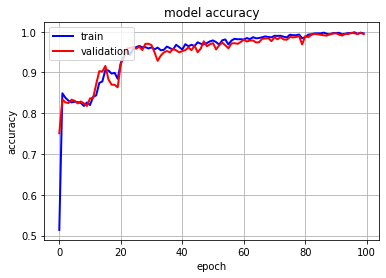

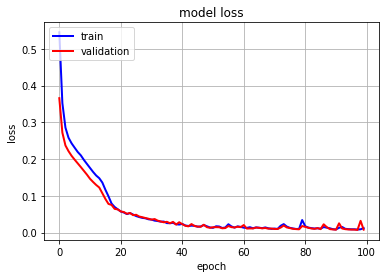

In [ ]:
plothist(history_C)
plothist_loss(history_C)

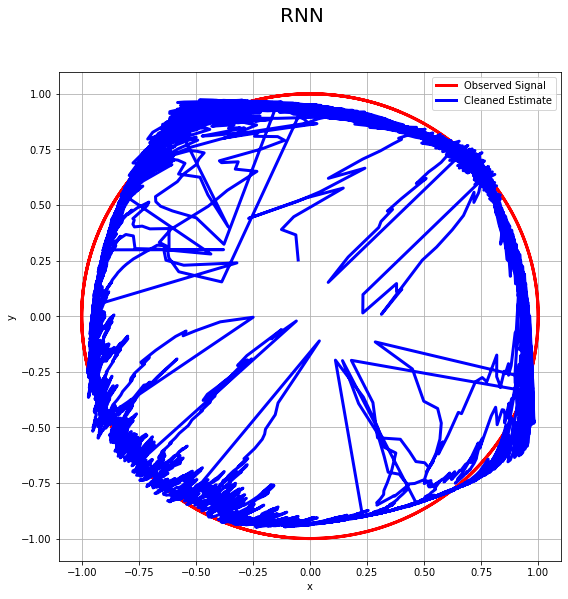

In [ ]:
x_pred =y_hat[:,:,0]
y_pred =y_hat[:,:,1]


x_test_ =y_test[:,:,0]
y_test_ =y_test[:,:,1]


#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(9,9))
fig.suptitle('RNN', fontsize=20)
ax1 = fig.add_subplot(111)
ax1.plot(x_test_.flatten(), y_test_.flatten() , label='Observed Signal', lw=3.0, c='r')
ax1.plot(x_pred.flatten(), y_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('x')
ax1.set_ylabel('y')

plt.show()
plt.close()

## **و,2:Epitrochoid signal**

In [ ]:
true_signal = np.array([x_E,y_E]).T
noisy_signal= np.array([noisy_x_E,noisy_y_E]).T
print(true_signal.shape)
# splitting data into 1 second chunks for our 3 signals
input_data  = np.zeros((dur, sample_rate,2)) # (10*2pi, 1000, 2)
target_data = np.zeros((dur, sample_rate,2)) # (10*2pi, 1000, 2)
y_          = np.zeros((dur, sample_rate,2)) # (10*2pi, 1000, 2)
for i in range(dur):
    st = i*sample_rate
    et = (i+1)*sample_rate
    input_data[i,:]  = noisy_signal [st:et,:]
    target_data[i,:] = true_signal  [st:et,:]


# 7 periods for training data
# 7*2pi second as train data 
ts=7*8
x_train = input_data [:ts, :]
y_train = target_data[:ts, :]


# 1 periods for validation data
# 1*2pi second as validation data 
x_valid = input_data [ts:ts+T, :]
y_valid = target_data[ts:ts+T, :]

# test data is the rest of data 
t_test=dur-(ts+T)
x_test = input_data [ts+T:, :]
y_test = target_data[ts+T:, :]


print('x_train, y_train', x_train.shape, y_train.shape)
print('x_valid, y_valid', x_valid.shape, y_valid.shape)
print('x_test, y_test', x_test.shape, y_test.shape)

(80000, 2)
x_train, y_train (56, 1000, 2) (56, 1000, 2)
x_valid, y_valid (8, 1000, 2) (8, 1000, 2)
x_test, y_test (16, 1000, 2) (16, 1000, 2)


In [ ]:
# Each input data point has 1000 timesteps, each with 2 features.
# So the input shape (excluding batch_size) is (1000, 2), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This RNN will return timesteps with 2 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 2 features. So the output shape (excluding batch size) is
# (1000, 2), which matches the shape of each data point in data_y above.
model_output = L.LSTM(2, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

# Wou need to pick appropriate loss/optimizers for your problem.
opt = keras.optimizers.Adam(learning_rate=0.01)
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_E=model.fit(x_train, y_train, epochs=100, validation_data=(x_valid, y_valid), batch_size=2, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/100
28/28 [==============================] - 8s 214ms/step - loss: 42.7933 - accuracy: 0.6975 - val_loss: 39.9686 - val_accuracy: 0.6141
Epoch 2/100
28/28 [==============================] - 5s 189ms/step - loss: 41.4208 - accuracy: 0.7791 - val_loss: 39.0059 - val_accuracy: 0.6726
Epoch 3/100
28/28 [==============================] - 5s 182ms/step - loss: 40.6778 - accuracy: 0.7978 - val_loss: 38.3060 - val_accuracy: 0.6791
Epoch 4/100
28/28 [==============================] - 5s 190ms/step - loss: 40.0633 - accuracy: 0.8057 - val_loss: 37.4161 - val_accuracy: 0.7082
Epoch 5/100
28/28 [==============================] - 5s 191ms/step - loss: 39.1995 - accuracy: 0.8185 - val_loss: 36.2818 - val_accuracy: 0.7379
Epoch 6/100
28/28 [==============================] - 5s 190ms/step - loss: 38.6106 - accuracy: 0.8133 - val_loss: 35.9967 - val_accuracy: 0.7405
Epoch 7/100
28/28 [==============================] - 5s 183ms/step - loss: 38.4170 - accuracy: 0.8189 - val_loss: 35.8146 - val_ac

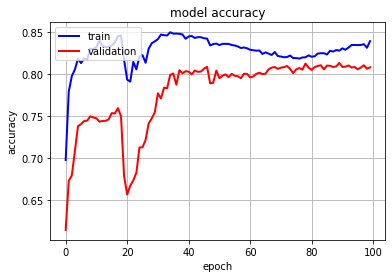

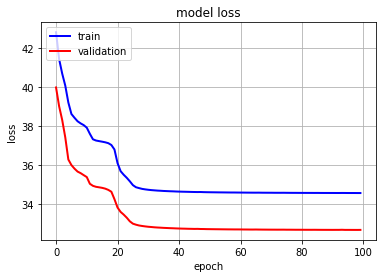

In [ ]:
plothist(history_E)
plothist_loss(history_E)

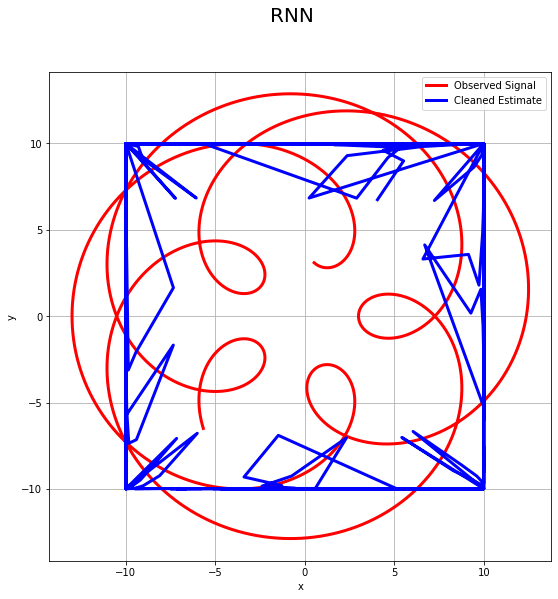

In [ ]:
x_pred =y_hat[:,:,0]
y_pred =y_hat[:,:,1]


x_test_ =y_test[:,:,0]
y_test_ =y_test[:,:,1]




#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(9,9))
fig.suptitle('RNN', fontsize=20)
ax1 = fig.add_subplot(111)
ax1.plot(x_test_.flatten(), y_test_.flatten() , label='Observed Signal', lw=3.0, c='r')
ax1.plot(x_pred.flatten(), y_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('x')
ax1.set_ylabel('y')

plt.show()
plt.close()

## **و.4:Nephroid Signal**

In [ ]:
true_signal = np.array([x_N,y_N]).T
noisy_signal= np.array([noisy_x_N,noisy_y_N]).T
print(true_signal.shape)
# splitting data into 1 second chunks for our 3 signals
input_data  = np.zeros((dur, sample_rate,2)) # (10*2pi, 1000, 2)
target_data = np.zeros((dur, sample_rate,2)) # (10*2pi, 1000, 2)
y_          = np.zeros((dur, sample_rate,2)) # (10*2pi, 1000, 2)
for i in range(dur):
    st = i*sample_rate
    et = (i+1)*sample_rate
    input_data[i,:]  = noisy_signal [st:et,:]
    target_data[i,:] = true_signal  [st:et,:]


# 7 periods for training data
# 7*2pi second as train data 
ts=7*8
x_train = input_data [:ts, :]
y_train = target_data[:ts, :]


# 1 periods for validation data
# 1*2pi second as validation data
x_valid = input_data [ts:ts+T, :]
y_valid = target_data[ts:ts+T, :]

# test data is the rest of data 
t_test=dur-(ts+T)
x_test = input_data [ts+T:, :]
y_test = target_data[ts+T:, :]


print('x_train, y_train', x_train.shape, y_train.shape)
print('x_valid, y_valid', x_valid.shape, y_valid.shape)
print('x_test, y_test', x_test.shape, y_test.shape)

(80000, 2)
x_train, y_train (56, 1000, 2) (56, 1000, 2)
x_valid, y_valid (8, 1000, 2) (8, 1000, 2)
x_test, y_test (16, 1000, 2) (16, 1000, 2)


In [ ]:
# Each input data point has 1000 timesteps, each with 2 features.
# So the input shape (excluding batch_size) is (1000, 2), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This RNN will return timesteps with 2 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 2 features. So the output shape (excluding batch size) is
# (1000, 2), which matches the shape of each data point in data_y above.
model_output = L.LSTM(2, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

# Wou need to pick appropriate loss/optimizers for your problem.
opt = keras.optimizers.Adam(learning_rate=0.01)
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_N=model.fit(x_train, y_train, epochs=100, validation_data=(x_valid, y_valid), batch_size=2, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/100
28/28 [==============================] - 8s 204ms/step - loss: 17.6765 - accuracy: 0.6059 - val_loss: 16.2927 - val_accuracy: 0.5075
Epoch 2/100
28/28 [==============================] - 5s 182ms/step - loss: 16.8397 - accuracy: 0.6419 - val_loss: 15.6364 - val_accuracy: 0.5605
Epoch 3/100
28/28 [==============================] - 5s 185ms/step - loss: 16.2046 - accuracy: 0.6911 - val_loss: 14.9564 - val_accuracy: 0.6535
Epoch 4/100
28/28 [==============================] - 6s 198ms/step - loss: 15.6074 - accuracy: 0.8127 - val_loss: 14.2942 - val_accuracy: 0.8729
Epoch 5/100
28/28 [==============================] - 6s 197ms/step - loss: 15.1937 - accuracy: 0.9025 - val_loss: 13.8507 - val_accuracy: 0.9041
Epoch 6/100
28/28 [==============================] - 5s 190ms/step - loss: 14.7303 - accuracy: 0.8701 - val_loss: 13.4153 - val_accuracy: 0.8709
Epoch 7/100
28/28 [==============================] - 5s 186ms/step - loss: 14.3005 - accuracy: 0.8731 - val_loss: 13.1553 - val_ac

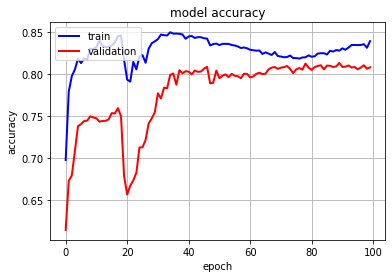

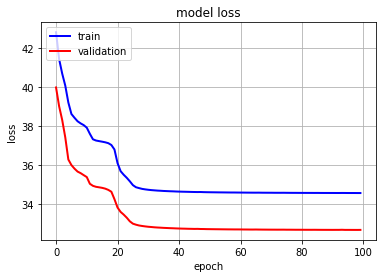

In [ ]:
plothist(history_E)
plothist_loss(history_E)

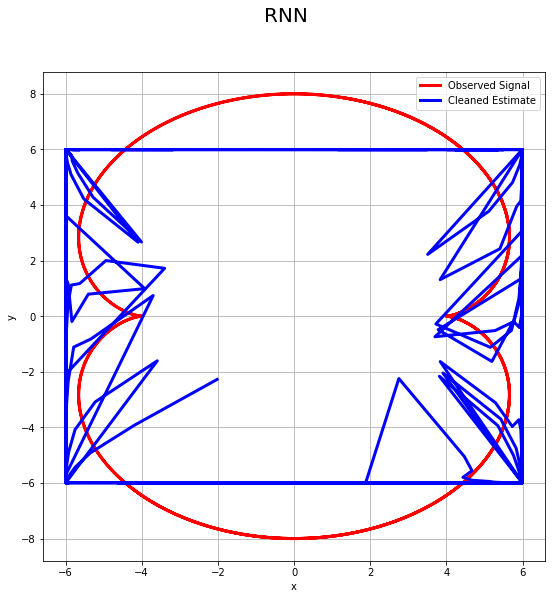

In [ ]:
x_pred =y_hat[:,:,0]
y_pred =y_hat[:,:,1]


x_test_ =y_test[:,:,0]
y_test_ =y_test[:,:,1]




#Plotting Output
time = np.linspace(0,t_test, sample_rate*t_test)
fig = plt.figure(figsize=(9,9))
fig.suptitle('RNN', fontsize=20)
ax1 = fig.add_subplot(111)
ax1.plot(x_test_.flatten(), y_test_.flatten() , label='Observed Signal', lw=3.0, c='r')
ax1.plot(x_pred.flatten() , y_pred.flatten(), label='Cleaned Estimate', lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('x')
ax1.set_ylabel('y')
plt.show()
plt.close()

# **ز:.Audio**

## **ز.1: Loading Audio File**

In [ ]:
file = "/content/kiss_the_rain.wav"

# load audio file with Librosa
audio0, sample_rate = librosa.load(file, sr=22050)

audio_Longer=audio0[:int(audio0.shape[0])]
audio_Shorter=audio0[:int(audio0.shape[0]/2)]

soundfile.write('audio_Longer.wav',audio_Longer, 22050)
soundfile.write('audio_Shorter.wav',audio_Shorter, 22050)



## **ز.2: plotting waveform, power spectrum and adding noise**

Text(0.5, 1.0, 'Power spectrum of noisy signal')

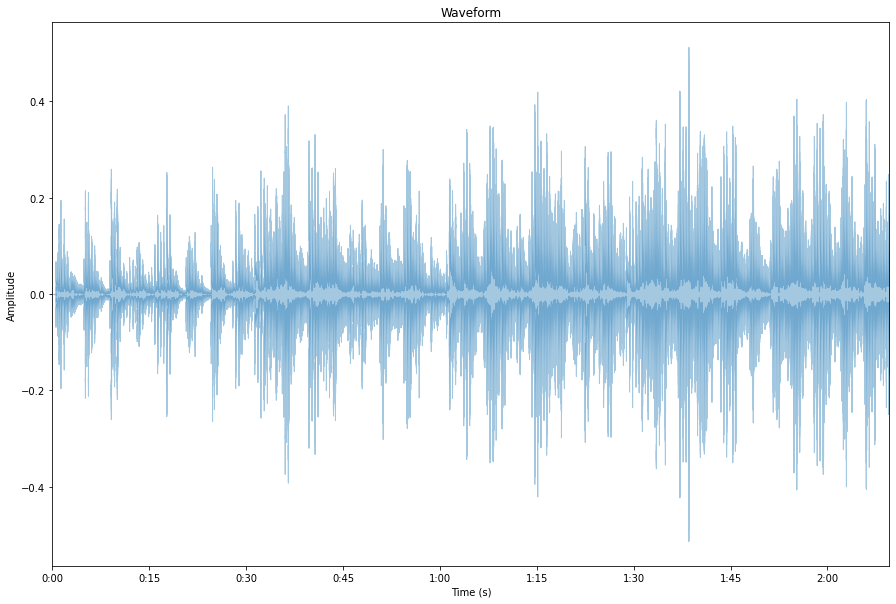

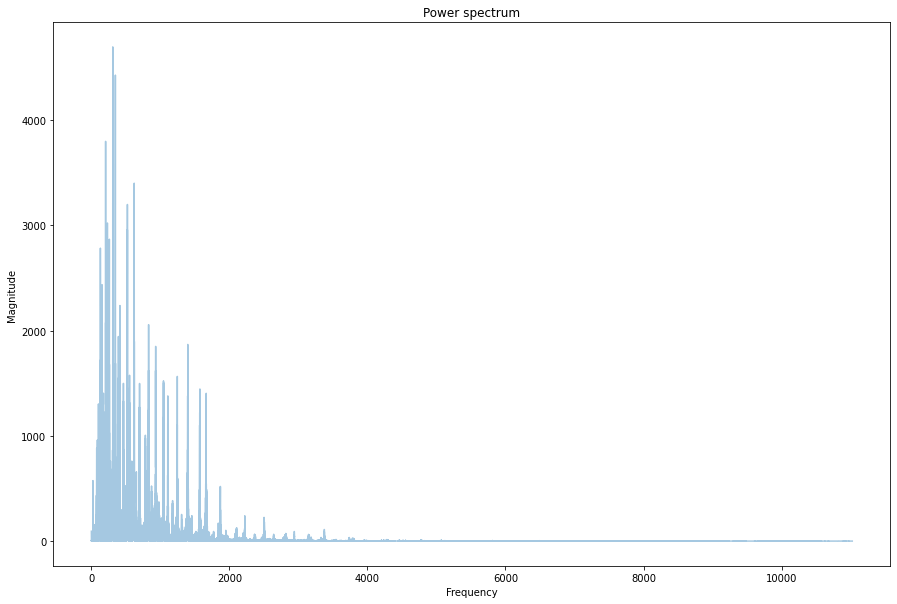

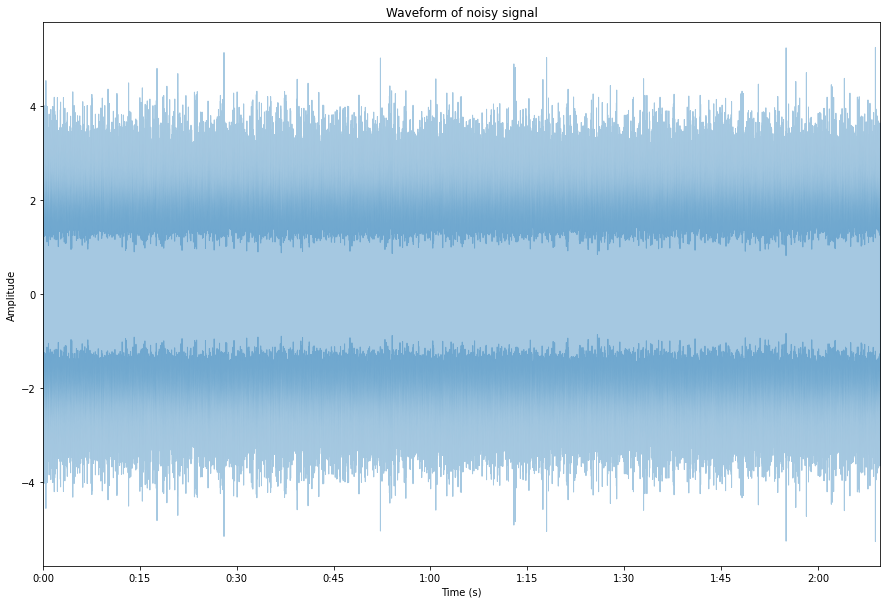

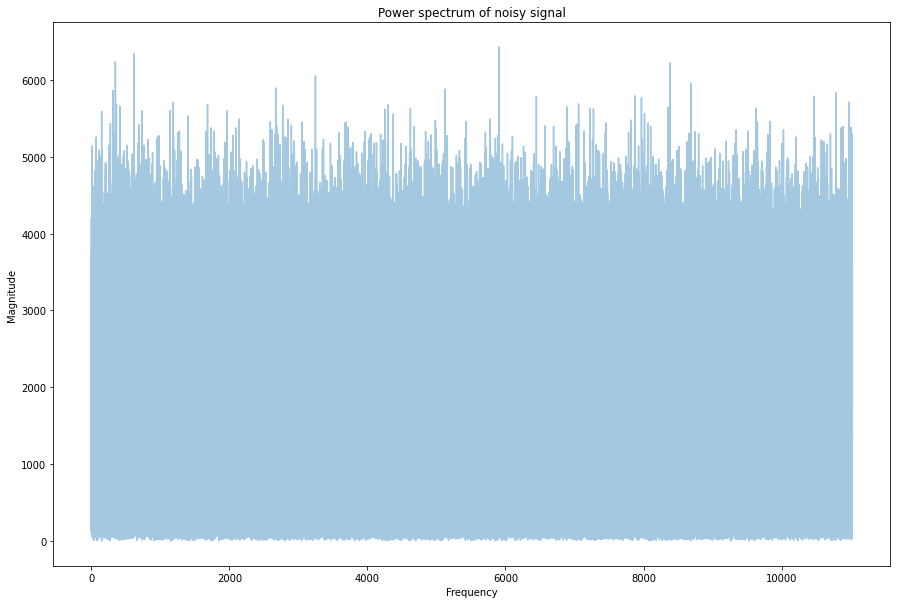

In [ ]:

FIG_SIZE = (15,10)

file = "/content/audio_Shorter.wav"

# load audio file with Librosa
signal, sample_rate = librosa.load(file, sr=22050)
dur        = int(len(signal)/sample_rate)              # Second



# WAVEFORM
# display waveform
plt.figure(figsize=FIG_SIZE)
librosa.display.waveplot(signal, sample_rate, alpha=0.4)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title("Waveform")

# FFT -> power spectrum
# perform Fourier transform
fft = np.fft.fft(signal)

# calculate abs values on complex numbers to get magnitude
spectrum = np.abs(fft)

# create frequency variable
f = np.linspace(0, sample_rate, len(spectrum))

# take half of the spectrum and frequency
left_spectrum = spectrum[:int(len(spectrum)/2)]
left_f = f[:int(len(spectrum)/2)]

# plot spectrum
plt.figure(figsize=FIG_SIZE)
plt.plot(left_f, left_spectrum, alpha=0.4)
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.title("Power spectrum")

# gaussian noise with mean=0 and variance=1
noise = np.random.normal(0,1,len(signal))

# Adding noise to signal
noisy_signal=signal+noise
soundfile.write('noisy_signal.wav',noisy_signal, 22050)

# display waveform of noisy signal
plt.figure(figsize=FIG_SIZE)
librosa.display.waveplot(noisy_signal, sample_rate, alpha=0.4)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title("Waveform of noisy signal")


# FFT -> power spectrum
# perform Fourier transform
noisy_fft = np.fft.fft(noisy_signal)

# calculate abs values on complex numbers to get magnitude
noisy_spectrum = np.abs(noisy_fft)

# create frequency variable
noisy_f = np.linspace(0, sample_rate, len(noisy_spectrum))

# take half of the spectrum and frequency
noisy_left_spectrum = noisy_spectrum[:int(len(noisy_spectrum)/2)]
noisy_left_f = noisy_f[:int(len(noisy_spectrum)/2)]

# plot spectrum
plt.figure(figsize=FIG_SIZE)
plt.plot(noisy_left_f, noisy_left_spectrum, alpha=0.4)
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.title("Power spectrum of noisy signal")


## **ز.3 : Splitting dataset**

In [ ]:
true_signal = np.array([signal,signal,signal]).T
noisy_signal_= np.array([noisy_signal,noisy_signal,noisy_signal]).T
print(true_signal.shape)
# splitting data into 1 second chunks for our  signal
input_data  = np.zeros((dur, sample_rate,3)) # (30, 22050,1)
target_data = np.zeros((dur, sample_rate,3)) # (30, 22050,1)
for i in range(dur):
    st = i*sample_rate
    et = (i+1)*sample_rate
    input_data[i,:]  = noisy_signal_ [st:et]
    target_data[i,:] = true_signal  [st:et]


# train on 64 seconds
x_train = input_data [:, :]
y_train = target_data[:, :]


# 10 second as validation data
x_valid = input_data [30:40, :]
y_valid = target_data[30:40, :]

# 24 second as test data
x_test = input_data [40:, :]
y_test = target_data[40:, :]

print('x_train, y_train', x_train.shape, y_train.shape)
print('x_valid, y_valid', x_valid.shape, y_valid.shape)
print('x_test, y_test', x_test.shape, y_test.shape)

(2857836, 3)
x_train, y_train (129, 22050, 3) (129, 22050, 3)
x_valid, y_valid (10, 22050, 3) (10, 22050, 3)
x_test, y_test (89, 22050, 3) (89, 22050, 3)


## **ز.4 : LSTM Network**

**LSTM**
* Optimizer : ADAM
* Learning Rate: 0.001
* Loss Function: MSE
* Batch Size:16
* Number of Epochs: 50


In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (22050, 1), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This RNN will return timesteps with 1 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 1 features. So the output shape (excluding batch size) is
# (22050, 1), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.001)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_S=model.fit(x_train, y_train, epochs=50, validation_data=(x_valid, y_valid), batch_size=16, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/50
9/9 [==============================] - 15s 1s/step - loss: 0.0193 - accuracy: 0.4114 - val_loss: 0.0175 - val_accuracy: 0.4248
Epoch 2/50
9/9 [==============================] - 12s 1s/step - loss: 0.0164 - accuracy: 0.4338 - val_loss: 0.0150 - val_accuracy: 0.4424
Epoch 3/50
9/9 [==============================] - 12s 1s/step - loss: 0.0142 - accuracy: 0.4484 - val_loss: 0.0131 - val_accuracy: 0.4534
Epoch 4/50
9/9 [==============================] - 12s 1s/step - loss: 0.0125 - accuracy: 0.4586 - val_loss: 0.0117 - val_accuracy: 0.4636
Epoch 5/50
9/9 [==============================] - 12s 1s/step - loss: 0.0111 - accuracy: 0.4702 - val_loss: 0.0105 - val_accuracy: 0.4778
Epoch 6/50
9/9 [==============================] - 12s 1s/step - loss: 0.0100 - accuracy: 0.4860 - val_loss: 0.0095 - val_accuracy: 0.4964
Epoch 7/50
9/9 [==============================] - 12s 1s/step - loss: 0.0091 - accuracy: 0.5050 - val_loss: 0.0087 - val_accuracy: 0.5163
Epoch 8/50
9/9 [==================

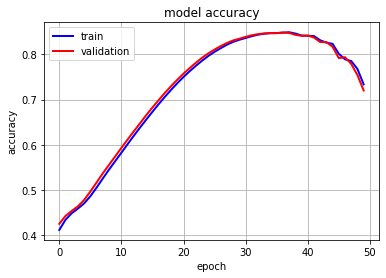

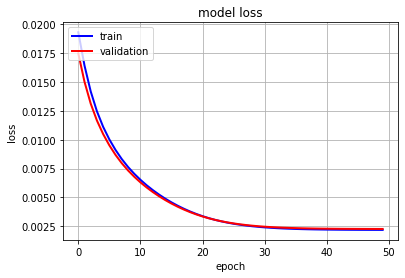

In [ ]:
plothist(history_S)
plothist_loss(history_S)

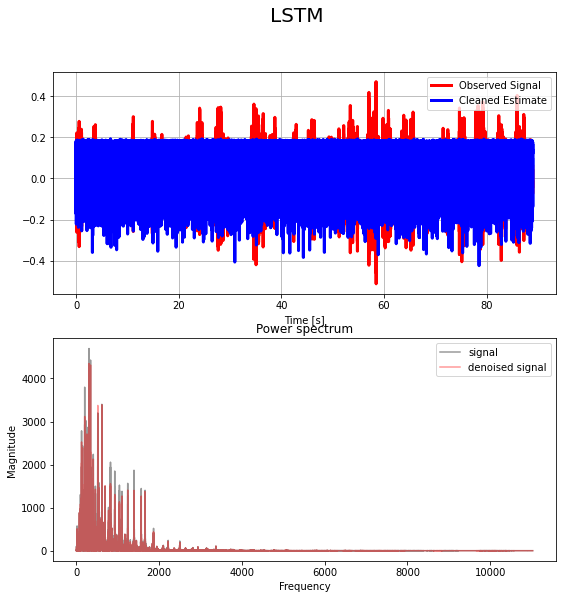

In [ ]:
signal_pred=y_hat[:,:,0]
plot=[x*6+0.1 for x in signal_pred.flatten() ]
signal_test=y_test[:,:,1]

denoised_signal=y_test[:,:,1].flatten()

# # saving denoised signal
# soundfile.write('denoised signal.wav',denoised_signal, 22050)

# FFT -> power spectrum
# perform Fourier transform
denoised_fft = np.fft.fft(denoised_signal)

# calculate abs values on complex numbers to get magnitude
denoised_spectrum = np.abs(denoised_fft)

# create frequency variable
denoised_f = np.linspace(0, sample_rate, len(denoised_spectrum))

# take half of the spectrum and frequency
denoised_left_spectrum = denoised_spectrum[:int(len(denoised_spectrum)/2)]
denoised_left_f = denoised_f[:int(len(denoised_spectrum)/2)]



#Plotting Output
time = np.linspace(0,89, sample_rate*89)
fig = plt.figure(figsize=(9,9))
fig.suptitle('LSTM', fontsize=20)
ax1 = fig.add_subplot(211)

ax1.plot(time, signal_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, plot, label='Cleaned Estimate',lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

# plot spectrum
ax1 = fig.add_subplot(212)
plt.plot(left_f, left_spectrum, alpha=0.4,color='k',label='signal')
plt.plot(denoised_left_f, denoised_left_spectrum, alpha=0.4,color='r',label='denoised signal')
# plt.plot(noisy_left_f, noisy_left_spectrum, alpha=0.4,color='r',labele='noisy signal')
plt.legend()
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.title("Power spectrum")



plt.show()
plt.close()

## **ز.5 : Longer Audio Signal**

Text(0.5, 1.0, 'Power spectrum of noisy signal')

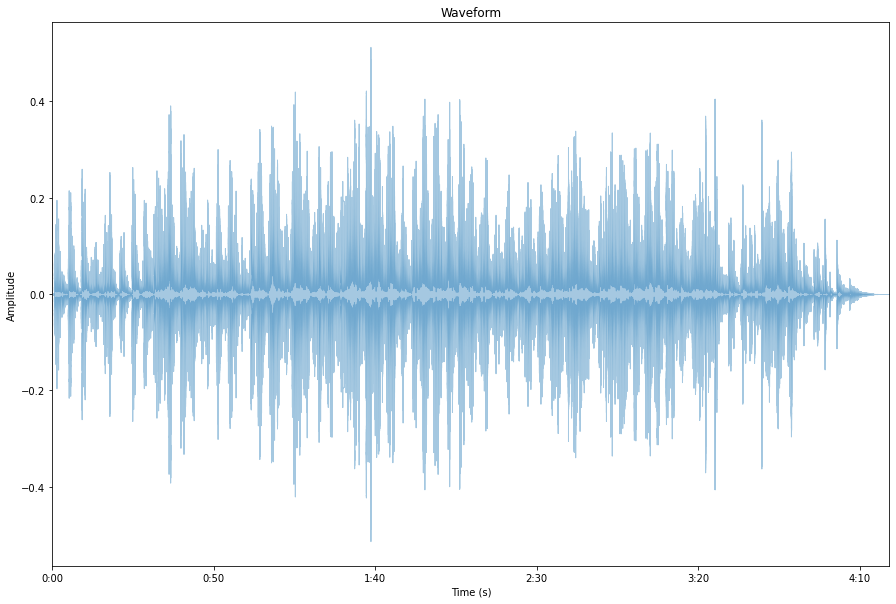

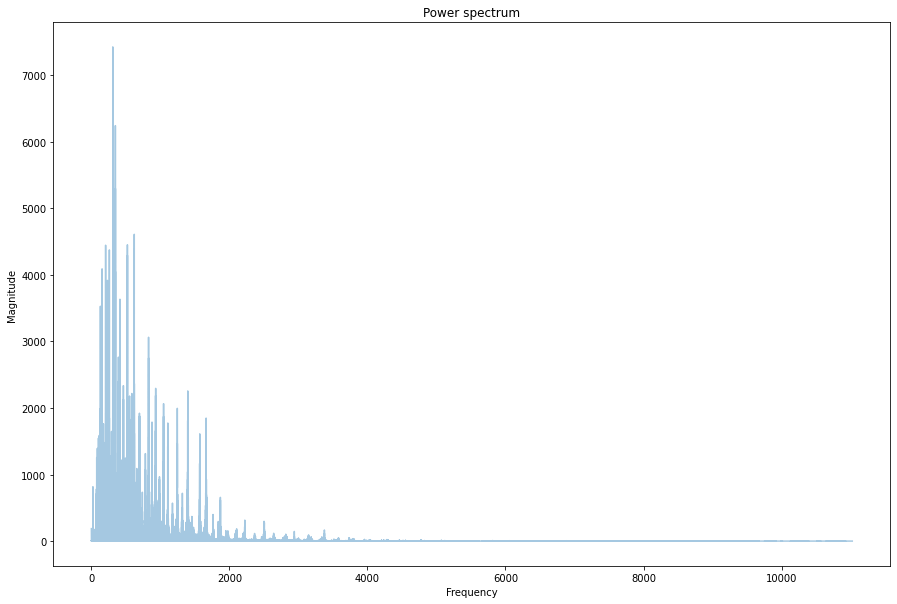

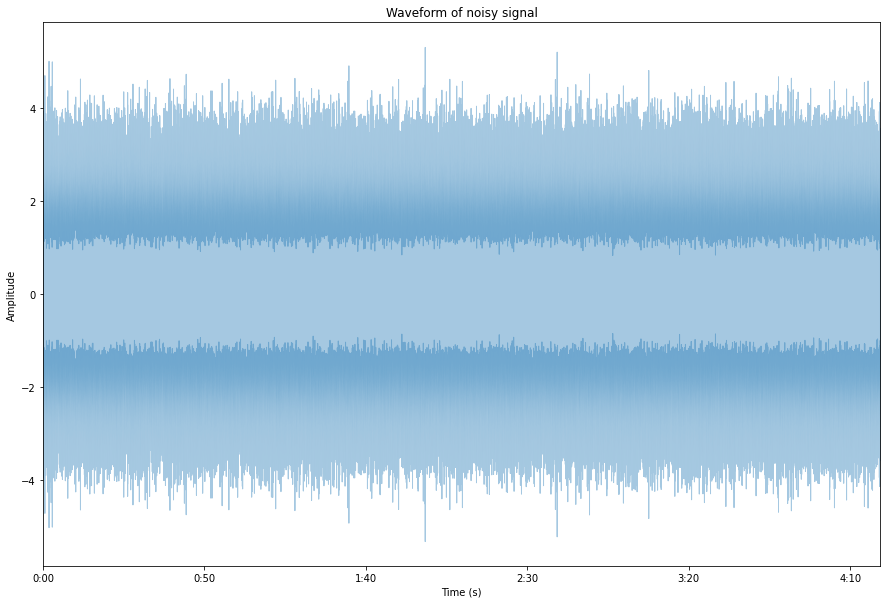

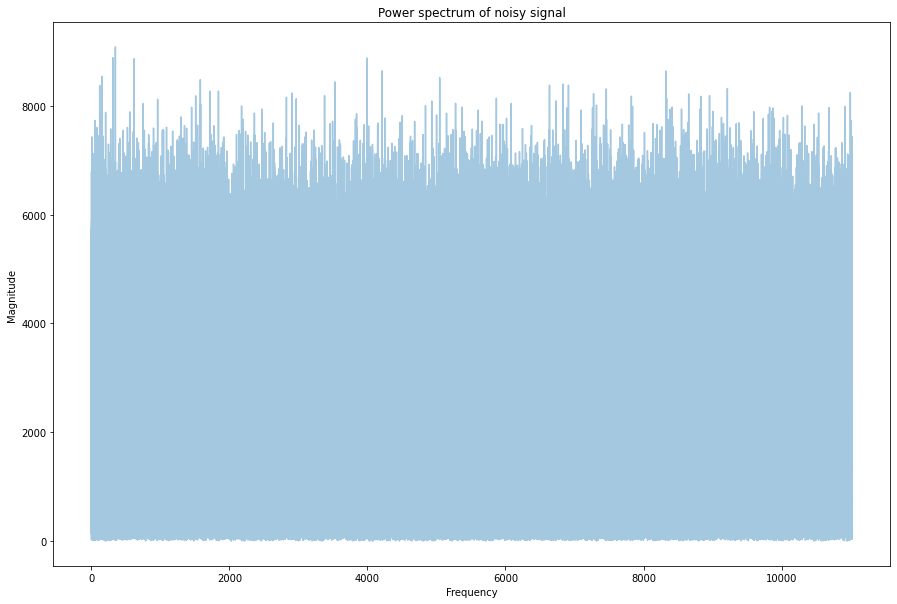

In [ ]:

FIG_SIZE = (15,10)

file = "/content/audio_Longer.wav"

# load audio file with Librosa
signal, sample_rate = librosa.load(file, sr=22050)
dur        = int(len(signal)/sample_rate)              # Second



# WAVEFORM
# display waveform
plt.figure(figsize=FIG_SIZE)
librosa.display.waveplot(signal, sample_rate, alpha=0.4)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title("Waveform")

# FFT -> power spectrum
# perform Fourier transform
fft = np.fft.fft(signal)

# calculate abs values on complex numbers to get magnitude
spectrum = np.abs(fft)

# create frequency variable
f = np.linspace(0, sample_rate, len(spectrum))

# take half of the spectrum and frequency
left_spectrum = spectrum[:int(len(spectrum)/2)]
left_f = f[:int(len(spectrum)/2)]

# plot spectrum
plt.figure(figsize=FIG_SIZE)
plt.plot(left_f, left_spectrum, alpha=0.4)
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.title("Power spectrum")

# gaussian noise with mean=0 and variance=1
noise = np.random.normal(0,1,len(signal))

# Adding noise to signal
noisy_signal=signal+noise
soundfile.write('noisy_signal.wav',noisy_signal, 22050)

# display waveform of noisy signal
plt.figure(figsize=FIG_SIZE)
librosa.display.waveplot(noisy_signal, sample_rate, alpha=0.4)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title("Waveform of noisy signal")


# FFT -> power spectrum
# perform Fourier transform
noisy_fft = np.fft.fft(noisy_signal)

# calculate abs values on complex numbers to get magnitude
noisy_spectrum = np.abs(noisy_fft)

# create frequency variable
noisy_f = np.linspace(0, sample_rate, len(noisy_spectrum))

# take half of the spectrum and frequency
noisy_left_spectrum = noisy_spectrum[:int(len(noisy_spectrum)/2)]
noisy_left_f = noisy_f[:int(len(noisy_spectrum)/2)]

# plot spectrum
plt.figure(figsize=FIG_SIZE)
plt.plot(noisy_left_f, noisy_left_spectrum, alpha=0.4)
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.title("Power spectrum of noisy signal")


In [ ]:
true_signal = np.array([signal,signal]).T
noisy_signal_= np.array([noisy_signal,noisy_signal]).T
print(true_signal.shape)
# splitting data into 1 second chunks for our  signal
input_data  = np.zeros((dur, sample_rate,2)) # (30, 22050,1)
target_data = np.zeros((dur, sample_rate,2)) # (30, 22050,1)
for i in range(dur):
    st = i*sample_rate
    et = (i+1)*sample_rate
    input_data[i,:]  = noisy_signal_ [st:et]
    target_data[i,:] = true_signal  [st:et]


# train on 64 seconds
x_train = input_data [:, :]
y_train = target_data[:, :]


# 10 second as validation data
x_valid = input_data [30:40, :]
y_valid = target_data[30:40, :]

# 24 second as test data
x_test = input_data [100:, :]
y_test = target_data[100:, :]

print('x_train, y_train', x_train.shape, y_train.shape)
print('x_valid, y_valid', x_valid.shape, y_valid.shape)
print('x_test, y_test', x_test.shape, y_test.shape)

(5715672, 2)
x_train, y_train (259, 22050, 2) (259, 22050, 2)
x_valid, y_valid (10, 22050, 2) (10, 22050, 2)
x_test, y_test (159, 22050, 2) (159, 22050, 2)


In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (22050, 1), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This RNN will return timesteps with 1 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 1 features. So the output shape (excluding batch size) is
# (22050, 1), which matches the shape of each data point in data_y above.
model_output = L.LSTM(2, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

opt = keras.optimizers.Adam(learning_rate=0.001)
# Wou need to pick appropriate loss/optimizers for your problem.
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_L=model.fit(x_train, y_train, epochs=50, validation_data=(x_valid, y_valid), batch_size=16, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/50
17/17 [==============================] - 25s 1s/step - loss: 0.0418 - accuracy: 0.2347 - val_loss: 0.0384 - val_accuracy: 0.2508
Epoch 2/50
17/17 [==============================] - 23s 1s/step - loss: 0.0356 - accuracy: 0.2671 - val_loss: 0.0330 - val_accuracy: 0.2871
Epoch 3/50
17/17 [==============================] - 23s 1s/step - loss: 0.0306 - accuracy: 0.3061 - val_loss: 0.0286 - val_accuracy: 0.3299
Epoch 4/50
17/17 [==============================] - 23s 1s/step - loss: 0.0266 - accuracy: 0.3528 - val_loss: 0.0250 - val_accuracy: 0.3808
Epoch 5/50
17/17 [==============================] - 23s 1s/step - loss: 0.0233 - accuracy: 0.4060 - val_loss: 0.0220 - val_accuracy: 0.4363
Epoch 6/50
17/17 [==============================] - 23s 1s/step - loss: 0.0205 - accuracy: 0.4618 - val_loss: 0.0195 - val_accuracy: 0.4922
Epoch 7/50
17/17 [==============================] - 23s 1s/step - loss: 0.0182 - accuracy: 0.5166 - val_loss: 0.0173 - val_accuracy: 0.5449
Epoch 8/50
17/17 [==

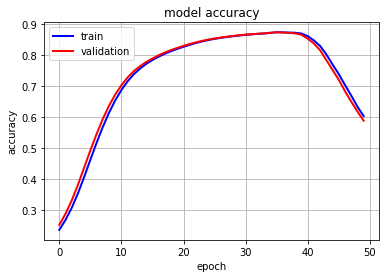

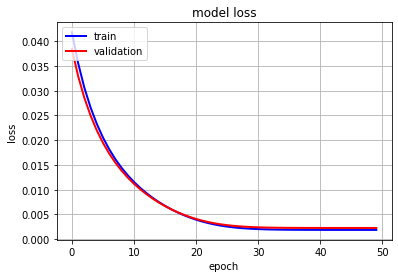

In [ ]:
plothist(history_L)
plothist_loss(history_L)

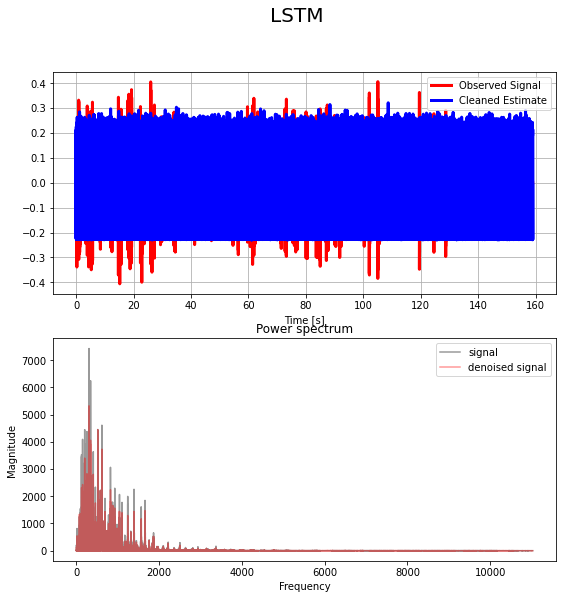

In [ ]:
signal_pred=y_hat[:,:,0]
signal_test=y_test[:,:,0]
plot=[x-0.1 for x in signal_pred.flatten() ]
denoised_signal=y_test[:,:,1].flatten()

# # saving denoised signal
# soundfile.write('denoised signal.wav',denoised_signal, 22050)

# FFT -> power spectrum
# perform Fourier transform
denoised_fft = np.fft.fft(denoised_signal)

# calculate abs values on complex numbers to get magnitude
denoised_spectrum = np.abs(denoised_fft)

# create frequency variable
denoised_f = np.linspace(0, sample_rate, len(denoised_spectrum))

# take half of the spectrum and frequency
denoised_left_spectrum = denoised_spectrum[:int(len(denoised_spectrum)/2)]
denoised_left_f = denoised_f[:int(len(denoised_spectrum)/2)]



#Plotting Output
time = np.linspace(0,159, sample_rate*159)
fig = plt.figure(figsize=(9,9))
fig.suptitle('LSTM', fontsize=20)
ax1 = fig.add_subplot(211)
ax1.plot(time, signal_test.flatten(), label='Observed Signal', lw=3.0, c='r')
ax1.plot(time, plot, label='Cleaned Estimate',lw=3.0, c='b')
ax1.legend(loc='upper right')
ax1.grid(True)
ax1.set_xlabel('Time [s]')

# plot spectrum
ax1 = fig.add_subplot(212)
plt.plot(left_f, left_spectrum, alpha=0.4,color='k',label='signal')
plt.plot(denoised_left_f, denoised_left_spectrum, alpha=0.4,color='r',label='denoised signal')
# plt.plot(noisy_left_f, noisy_left_spectrum, alpha=0.4,color='r',labele='noisy signal')
plt.legend()
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.title("Power spectrum")



plt.show()
plt.close()

**Comparing training between longer and shorter audio**

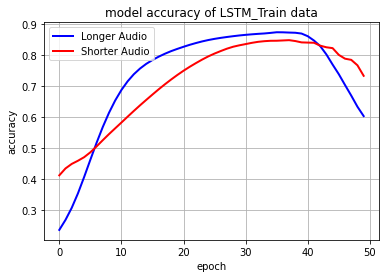

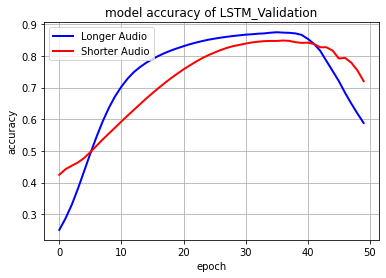

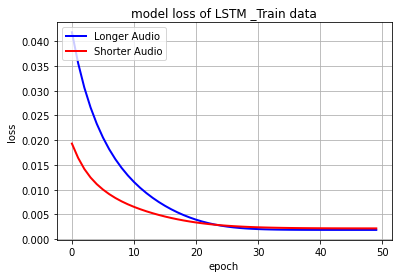

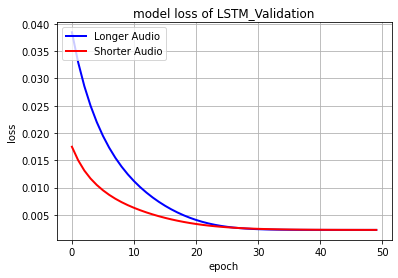

In [ ]:
plt.plot(history_L.history['accuracy'],color='b',linewidth=2.0)
plt.plot(history_S.history['accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy of LSTM_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['Longer Audio', 'Shorter Audio'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_L.history['val_accuracy'],color='b',linewidth=2.0)
plt.plot(history_S.history['val_accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy of LSTM_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['Longer Audio', 'Shorter Audio'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_L.history['loss'],color='b',linewidth=2.0)
plt.plot(history_S.history['loss'],color='r',linewidth=2.0)

plt.title('model loss of LSTM _Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['Longer Audio', 'Shorter Audio'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_L.history['val_loss'],color='b',linewidth=2.0)
plt.plot(history_S.history['val_loss'],color='r',linewidth=2.0)

plt.title('model loss of LSTM_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['Longer Audio', 'Shorter Audio'], loc='upper left')
plt.grid()
plt.show()

# **ح: Image**

## **ح.1 : Adding Guassian noise**

Text(0.5, 1.0, 'noisy image')

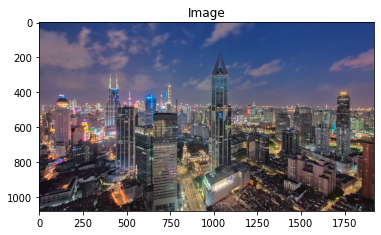

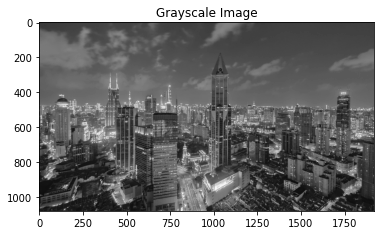

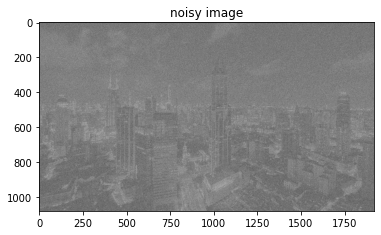

In [ ]:
#Loading Image and Ploting it
image = cv2.imread('/content/city-sample.jpg')

plt.figure()
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Image')
#Converting image to grayscale one and plotting it
img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
plt.figure()
plt.imshow(img_gray,cmap="gray")
plt.title('Grayscale Image')

# noise
# Adding Gaussian noise to image and plotting it 
# gaussian = np.random.normal(0, 1, (img_gray.shape[0],img_gray.shape[1])) 
# noisy_image = img_gray + gaussian
noisy_image =noisy('gauss',img_gray)
plt.figure()
plt.imshow(noisy_image, cmap="gray")
plt.title('noisy image')



In [ ]:
dur=img_gray.shape[0]
sample_rate=img_gray.shape[1]
true_signal = np.array([img_gray.flatten(),img_gray.flatten(),img_gray.flatten()]).T
noisy_signal= np.array([noisy_image.flatten(),noisy_image.flatten(),noisy_image.flatten()]).T
print(true_signal.shape)
# splitting data into 1 second chunks for our  signal
input_data  = np.zeros((dur, sample_rate,3)) # (30, 22050,1)
target_data = np.zeros((dur, sample_rate,3)) # (30, 22050,1)
for i in range(dur):
    st = i*sample_rate
    et = (i+1)*sample_rate
    input_data[i,:]  = noisy_signal [st:et]
    target_data[i,:] = true_signal  [st:et]


# train data
x_train = input_data [:, :]
y_train = target_data[:, :]


# validation data
x_valid = input_data [540:810, :]
y_valid = target_data[540:810, :]

# test data  
x_test = input_data [810: , :]
y_test = target_data[810:, :]

########
# test_= np.zeros((y_test.shape[0],1,1))
# for i in range(0,y_test.shape[0]):
#     test_[i,:,:]  = y_test[i,0,0]
# test_=test_.flatten()
########

print('x_train, y_train', x_train.shape, y_train.shape)
print('x_valid, y_valid', x_valid.shape, y_valid.shape)
print('x_test, y_test', x_test.shape, y_test.shape)

(2073600, 3)
x_train, y_train (1080, 1920, 3) (1080, 1920, 3)
x_valid, y_valid (270, 1920, 3) (270, 1920, 3)
x_test, y_test (270, 1920, 3) (270, 1920, 3)


**LSTM**
* Optimizer : ADAM
* Learning Rate: 0.001
* Loss Function: MSE
* Batch Size:32
* Number of Epochs: 60


In [ ]:
# Each input data point has 1000 timesteps, each with 2 features.
# So the input shape (excluding batch_size) is (1920, 2), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This RNN will return timesteps with 1 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 2 features. So the output shape (excluding batch size) is
# (1920, 2), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

# Wou need to pick appropriate loss/optimizers for your problem.
opt = keras.optimizers.Adam(learning_rate=0.001)
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_G=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=32, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_train, y_train, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_train)



Epoch 1/60
34/34 [==============================] - 10s 224ms/step - loss: 9080.4238 - accuracy: 0.6825 - val_loss: 9735.5146 - val_accuracy: 0.6823
Epoch 2/60
34/34 [==============================] - 7s 207ms/step - loss: 9073.2080 - accuracy: 0.6783 - val_loss: 9706.1797 - val_accuracy: 0.6707
Epoch 3/60
34/34 [==============================] - 7s 206ms/step - loss: 9050.2568 - accuracy: 0.6716 - val_loss: 9704.7754 - val_accuracy: 0.6668
Epoch 4/60
34/34 [==============================] - 7s 207ms/step - loss: 9049.3535 - accuracy: 0.6657 - val_loss: 9703.8164 - val_accuracy: 0.6608
Epoch 5/60
34/34 [==============================] - 7s 206ms/step - loss: 9048.0371 - accuracy: 0.6729 - val_loss: 9702.2422 - val_accuracy: 0.6778
Epoch 6/60
34/34 [==============================] - 7s 207ms/step - loss: 9046.3896 - accuracy: 0.6834 - val_loss: 9700.4697 - val_accuracy: 0.6884
Epoch 7/60
34/34 [==============================] - 7s 206ms/step - loss: 9043.6484 - accuracy: 0.7488 - val_lo

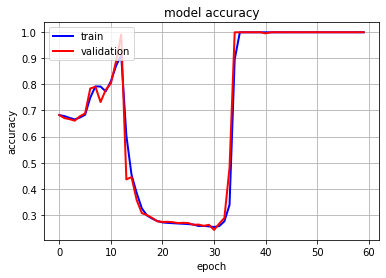

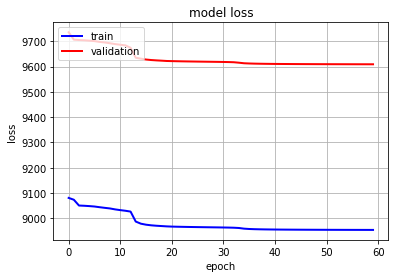

In [ ]:
plothist(history_G)
plothist_loss(history_G)

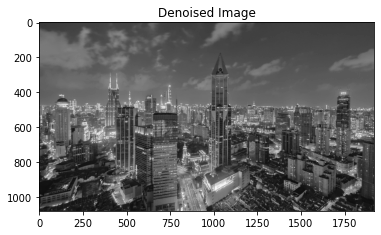

In [ ]:
signal_pred=y_hat[:,:,1]
signal_test=y_train[:,:,1]

denoised_img=y_train[:,:,1]



#Plotting Output
plt.figure()
plt.imshow(denoised_img,cmap="gray")
plt.title('Denoised Image')


plt.show()
plt.close()

## **ح.2 : Salt and Pepper Noise**

Text(0.5, 1.0, 'noisy image')

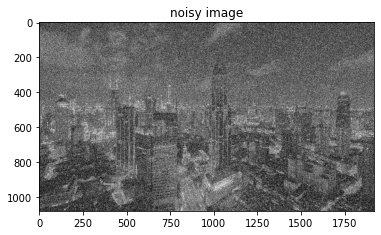

In [ ]:
# salt-and-pepper noise can
# be applied only to grayscale images

noisy_image=noisy('snp',img_gray)
cv2.imwrite('salt-and-pepper_city_sample.jpg',noisy('snp',img_gray))
plt.figure()
plt.imshow(noisy_image,cmap="gray")
plt.title('noisy image')


**LSTM**
* Optimizer : ADAM
* Learning Rate: 0.001
* Loss Function: MSE
* Batch Size:8
* Number of Epochs: 60


In [ ]:
dur=img_gray.shape[0]
sample_rate=img_gray.shape[1]
true_signal = np.array([img_gray.flatten(),img_gray.flatten(),img_gray.flatten()]).T
noisy_signal= np.array([noisy_image.flatten(),noisy_image.flatten(),noisy_image.flatten()]).T
print(true_signal.shape)
# splitting data into 1 second chunks for our  signal
input_data  = np.zeros((dur, sample_rate,3)) # (30, 22050,1)
target_data = np.zeros((dur, sample_rate,3)) # (30, 22050,1)
for i in range(dur):
    st = i*sample_rate
    et = (i+1)*sample_rate
    input_data[i,:]  = noisy_signal [st:et]
    target_data[i,:] = true_signal  [st:et]


# train data
x_train = input_data [:, :]
y_train = target_data[:, :]


# validation data
x_valid = input_data [540:810, :]
y_valid = target_data[540:810, :]

# test data  
x_test = input_data [810: , :]
y_test = target_data[810: , :]

print('x_train, y_train', x_train.shape, y_train.shape)
print('x_valid, y_valid', x_valid.shape, y_valid.shape)
print('x_test, y_test', x_test.shape, y_test.shape)

(2073600, 3)
x_train, y_train (1080, 1920, 3) (1080, 1920, 3)
x_valid, y_valid (270, 1920, 3) (270, 1920, 3)
x_test, y_test (270, 1920, 3) (270, 1920, 3)


In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (22050, 1), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This RNN will return timesteps with 1 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 1 features. So the output shape (excluding batch size) is
# (22050, 1), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

# Wou need to pick appropriate loss/optimizers for your problem.
opt = keras.optimizers.Adam(learning_rate=0.001)
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_S=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=8, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_train, y_train, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_train)



Epoch 1/60
135/135 [==============================] - 29s 201ms/step - loss: 8966.7051 - accuracy: 0.8061 - val_loss: 9616.9160 - val_accuracy: 0.9925
Epoch 2/60
135/135 [==============================] - 27s 197ms/step - loss: 8960.5850 - accuracy: 0.9759 - val_loss: 9614.0566 - val_accuracy: 0.9894
Epoch 3/60
135/135 [==============================] - 27s 197ms/step - loss: 8953.9424 - accuracy: 0.9630 - val_loss: 9608.3564 - val_accuracy: 0.9832
Epoch 4/60
135/135 [==============================] - 27s 197ms/step - loss: 8953.2725 - accuracy: 0.9575 - val_loss: 9608.2393 - val_accuracy: 0.9728
Epoch 5/60
135/135 [==============================] - 27s 197ms/step - loss: 8953.1758 - accuracy: 0.9497 - val_loss: 9608.1592 - val_accuracy: 0.9725
Epoch 6/60
135/135 [==============================] - 26s 196ms/step - loss: 8953.1162 - accuracy: 0.9493 - val_loss: 9608.1084 - val_accuracy: 0.9725
Epoch 7/60
135/135 [==============================] - 26s 196ms/step - loss: 8953.0713 - accur

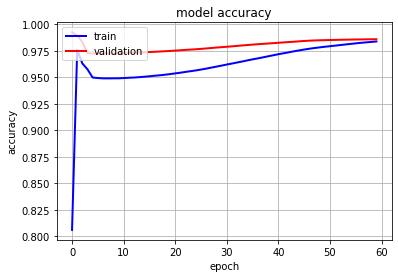

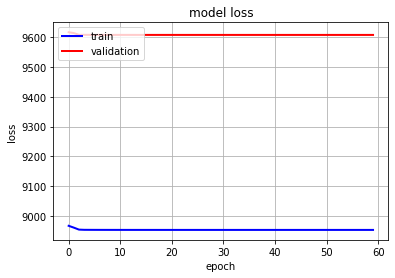

In [ ]:
plothist(history_S)
plothist_loss(history_S)

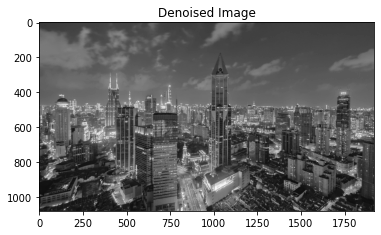

In [ ]:
signal_pred=y_hat[:,:,1]
signal_test=y_train[:,:,1]

denoised_img=y_train[:,:,1]


#Plotting Output
plt.figure()
plt.imshow(denoised_img,cmap='gray')
plt.title('Denoised Image')



plt.show()
plt.close()

## **ح.3 : Comparing training between two type of noise**

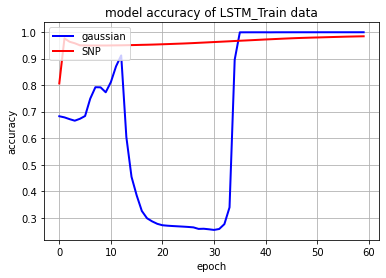

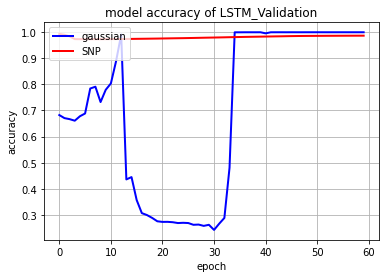

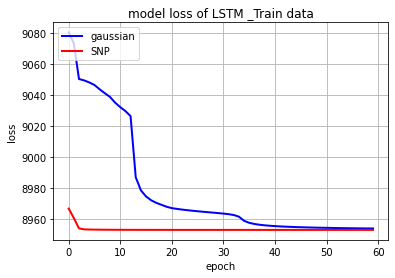

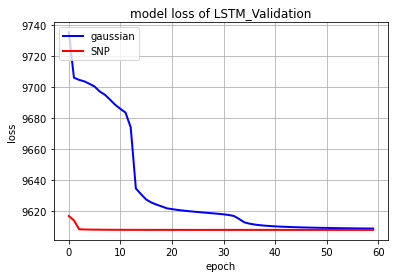

In [ ]:
plt.plot(history_G.history['accuracy'],color='b',linewidth=2.0)
plt.plot(history_S.history['accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy of LSTM_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['gaussian', 'SNP'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_G.history['val_accuracy'],color='b',linewidth=2.0)
plt.plot(history_S.history['val_accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy of LSTM_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['gaussian', 'SNP'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_G.history['loss'],color='b',linewidth=2.0)
plt.plot(history_S.history['loss'],color='r',linewidth=2.0)

plt.title('model loss of LSTM _Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['gaussian', 'SNP'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_G.history['val_loss'],color='b',linewidth=2.0)
plt.plot(history_S.history['val_loss'],color='r',linewidth=2.0)

plt.title('model loss of LSTM_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['gaussian', 'SNP'], loc='upper left')
plt.grid()
plt.show()

## **ح.4 : Comaring Pixel Dependency**

**Training with First Pixels**

In [ ]:
dur=img_gray.shape[0]
sample_rate=img_gray.shape[1]
true_signal = np.array([img_gray.flatten(),img_gray.flatten(),img_gray.flatten()]).T
noisy_signal= np.array([noisy_image.flatten(),noisy_image.flatten(),noisy_image.flatten()]).T
print(true_signal.shape)
# splitting data into 1 second chunks for our  signal
input_data  = np.zeros((dur, sample_rate,3)) # (30, 22050,1)
target_data = np.zeros((dur, sample_rate,3)) # (30, 22050,1)
for i in range(dur):
    st = i*sample_rate
    et = (i+1)*sample_rate
    input_data[i,:]  = noisy_signal [st:et]
    target_data[i,:] = true_signal  [st:et]


# train data
x_train = input_data [:864, :]
y_train = target_data[:864, :]


# validation data
x_valid = input_data [864:972, :]
y_valid = target_data[864:972, :]

# test data  
x_test = input_data [810: , :]
y_test = target_data[810:, :]

########
# test_= np.zeros((y_test.shape[0],1,1))
# for i in range(0,y_test.shape[0]):
#     test_[i,:,:]  = y_test[i,0,0]
# test_=test_.flatten()
########

print('x_train, y_train', x_train.shape, y_train.shape)
print('x_valid, y_valid', x_valid.shape, y_valid.shape)
print('x_test, y_test', x_test.shape, y_test.shape)

(2073600, 3)
x_train, y_train (864, 1920, 3) (864, 1920, 3)
x_valid, y_valid (108, 1920, 3) (108, 1920, 3)
x_test, y_test (270, 1920, 3) (270, 1920, 3)


In [ ]:
# Each input data point has 1000 timesteps, each with 2 features.
# So the input shape (excluding batch_size) is (1920, 2), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This RNN will return timesteps with 1 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 2 features. So the output shape (excluding batch size) is
# (1920, 2), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

# Wou need to pick appropriate loss/optimizers for your problem.
opt = keras.optimizers.Adam(learning_rate=0.001)
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_h1=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=32, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_train, y_train, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
27/27 [==============================] - 8s 222ms/step - loss: 9567.3242 - accuracy: 0.0028 - val_loss: 8562.5879 - val_accuracy: 0.0013
Epoch 2/60
27/27 [==============================] - 5s 201ms/step - loss: 9562.3018 - accuracy: 0.0062 - val_loss: 8557.9453 - val_accuracy: 0.0118
Epoch 3/60
27/27 [==============================] - 5s 202ms/step - loss: 9540.6426 - accuracy: 0.2572 - val_loss: 8499.6201 - val_accuracy: 0.6829
Epoch 4/60
27/27 [==============================] - 5s 202ms/step - loss: 9481.4951 - accuracy: 0.8016 - val_loss: 8490.8516 - val_accuracy: 0.7537
Epoch 5/60
27/27 [==============================] - 5s 201ms/step - loss: 9479.5293 - accuracy: 0.8061 - val_loss: 8490.2168 - val_accuracy: 0.7537
Epoch 6/60
27/27 [==============================] - 5s 202ms/step - loss: 9477.9805 - accuracy: 0.8055 - val_loss: 8488.1074 - val_accuracy: 0.7520
Epoch 7/60
27/27 [==============================] - 5s 202ms/step - loss: 9471.0146 - accuracy: 0.8029 - val_los

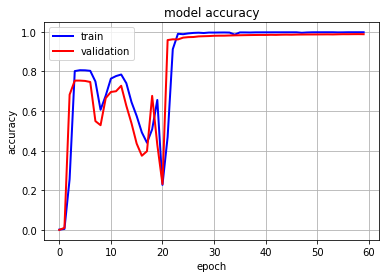

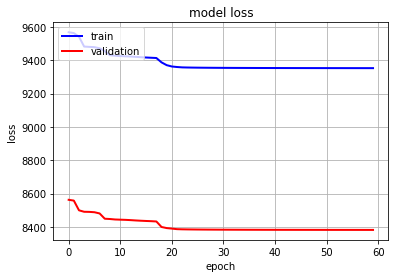

In [ ]:
plothist(history_h1)
plothist_loss(history_h1)

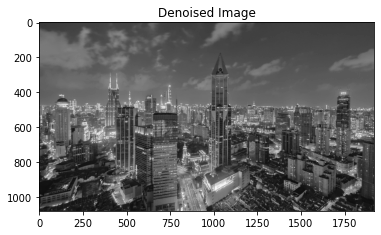

In [ ]:
signal_pred=y_hat[:,:,1]
signal_test=y_train[:,:,1]

denoised_img=y_train[:,:,1]



#Plotting Output
plt.figure()
plt.imshow(denoised_img,cmap="gray")
plt.title('Denoised Image')


plt.show()
plt.close()

**Training with Last Pixels**

In [ ]:
dur=img_gray.shape[0]
sample_rate=img_gray.shape[1]
true_signal = np.array([img_gray.flatten(),img_gray.flatten(),img_gray.flatten()]).T
noisy_signal= np.array([noisy_image.flatten(),noisy_image.flatten(),noisy_image.flatten()]).T
print(true_signal.shape)
# splitting data into 1 second chunks for our  signal
input_data  = np.zeros((dur, sample_rate,3)) # (30, 22050,1)
target_data = np.zeros((dur, sample_rate,3)) # (30, 22050,1)
for i in range(dur):
    st = i*sample_rate
    et = (i+1)*sample_rate
    input_data[i,:]  = noisy_signal [st:et]
    target_data[i,:] = true_signal  [st:et]


# train data
x_train = input_data [216:, :]
y_train = target_data[216:, :]


# validation data
x_valid = input_data [864:972, :]
y_valid = target_data[864:972, :]

# test data  
x_test = input_data [810: , :]
y_test = target_data[810:, :]

########
# test_= np.zeros((y_test.shape[0],1,1))
# for i in range(0,y_test.shape[0]):
#     test_[i,:,:]  = y_test[i,0,0]
# test_=test_.flatten()
########

print('x_train, y_train', x_train.shape, y_train.shape)
print('x_valid, y_valid', x_valid.shape, y_valid.shape)
print('x_test, y_test', x_test.shape, y_test.shape)

(2073600, 3)
x_train, y_train (864, 1920, 3) (864, 1920, 3)
x_valid, y_valid (108, 1920, 3) (108, 1920, 3)
x_test, y_test (270, 1920, 3) (270, 1920, 3)


In [ ]:
# Each input data point has 1000 timesteps, each with 2 features.
# So the input shape (excluding batch_size) is (1920, 2), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This RNN will return timesteps with 1 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 2 features. So the output shape (excluding batch size) is
# (1920, 2), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

# Wou need to pick appropriate loss/optimizers for your problem.
opt = keras.optimizers.Adam(learning_rate=0.001)
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history_h2=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=32, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_train, y_train, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_test)



Epoch 1/60
27/27 [==============================] - 8s 223ms/step - loss: 9654.7764 - accuracy: 0.0029 - val_loss: 8505.2959 - val_accuracy: 0.0035
Epoch 2/60
27/27 [==============================] - 5s 200ms/step - loss: 9652.9072 - accuracy: 0.0047 - val_loss: 8503.8320 - val_accuracy: 0.0063
Epoch 3/60
27/27 [==============================] - 5s 201ms/step - loss: 9650.9395 - accuracy: 0.0062 - val_loss: 8501.6289 - val_accuracy: 0.0077
Epoch 4/60
27/27 [==============================] - 6s 213ms/step - loss: 9645.5781 - accuracy: 0.0067 - val_loss: 8489.0488 - val_accuracy: 0.0103
Epoch 5/60
27/27 [==============================] - 5s 202ms/step - loss: 9583.3516 - accuracy: 0.4665 - val_loss: 8429.2266 - val_accuracy: 0.5937
Epoch 6/60
27/27 [==============================] - 5s 200ms/step - loss: 9560.8193 - accuracy: 0.6204 - val_loss: 8420.1455 - val_accuracy: 0.5264
Epoch 7/60
27/27 [==============================] - 5s 201ms/step - loss: 9552.9355 - accuracy: 0.5552 - val_los

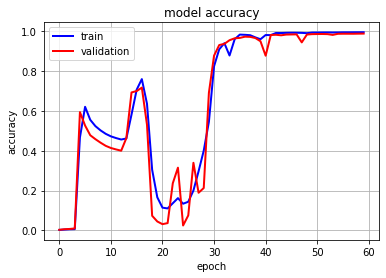

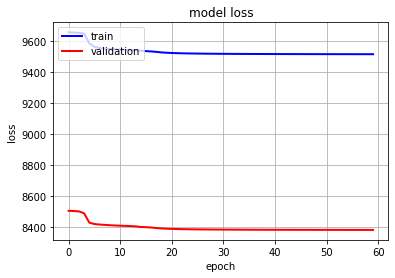

In [ ]:
plothist(history_h2)
plothist_loss(history_h2)

**Comparing usage of different pixels**

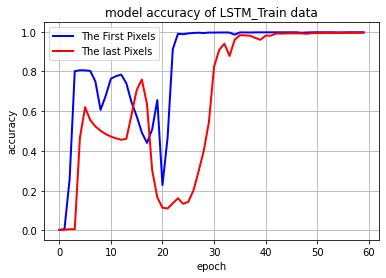

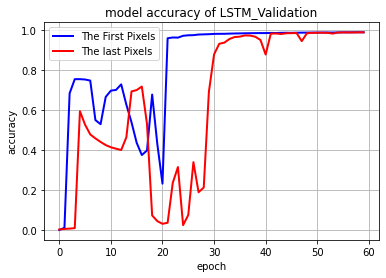

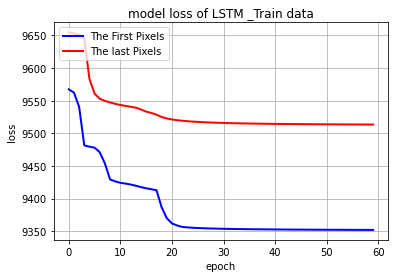

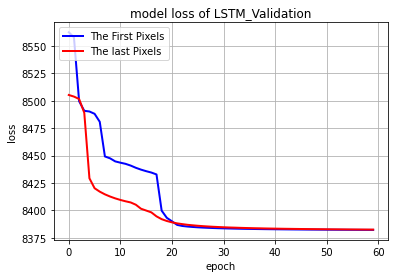

In [ ]:
plt.plot(history_h1.history['accuracy'],color='b',linewidth=2.0)
plt.plot(history_h2.history['accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy of LSTM_Train data')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['The First Pixels', 'The last Pixels'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_h1.history['val_accuracy'],color='b',linewidth=2.0)
plt.plot(history_h2.history['val_accuracy'],color='r',linewidth=2.0)

plt.title('model accuracy of LSTM_Validation')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['The First Pixels', 'The last Pixels'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_h1.history['loss'],color='b',linewidth=2.0)
plt.plot(history_h2.history['loss'],color='r',linewidth=2.0)

plt.title('model loss of LSTM _Train data')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['The First Pixels', 'The last Pixels'], loc='upper left')
plt.grid()
plt.show()

plt.plot(history_h1.history['val_loss'],color='b',linewidth=2.0)
plt.plot(history_h2.history['val_loss'],color='r',linewidth=2.0)

plt.title('model loss of LSTM_Validation')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['The First Pixels', 'The last Pixels'], loc='upper left')
plt.grid()
plt.show()

# **ط امتیازی : Image/3 channels**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'noisy image')

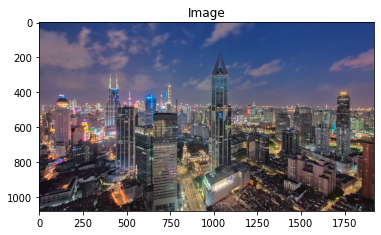

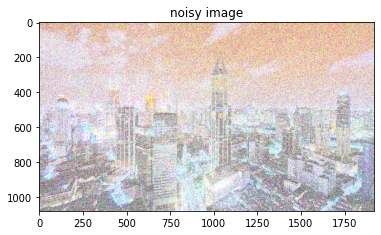

In [ ]:


image = cv2.imread('/content/city-sample.jpg')
plt.figure()
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Image')
b, g, r = cv2.split(image)
# Adding noise
noisy_b = noisy('gauss',b)
noisy_g = noisy('gauss',g)
noisy_r = noisy('gauss',r)
noisy_image = cv2.merge([noisy_b, noisy_g, noisy_r])

plt.figure()
#plt.imshow(cv2.cvtColor(noisy_image, cv2.COLOR_BGR2RGB))
plt.imshow(noisy_image)
plt.title('noisy image')


In [ ]:
dur=image.shape[0]
sample_rate=image.shape[1]
true_signal = np.array([b.flatten(),g.flatten(),r.flatten()]).T
noisy_signal= np.array([noisy_b.flatten(),noisy_g.flatten(),noisy_r.flatten()]).T
print(true_signal.shape)
# splitting data into 1 second chunks for our  signal
input_data  = np.zeros((dur, sample_rate,3)) # (30, 22050,3)
target_data = np.zeros((dur, sample_rate,3)) # (30, 22050,3)
for i in range(dur):
    st = i*sample_rate
    et = (i+1)*sample_rate
    input_data[i,:]  = noisy_signal [st:et]
    target_data[i,:] = true_signal  [st:et]


# train data
x_train = input_data [:, :]
y_train = target_data[:, :]


# validation data
x_valid = input_data [540:810, :]
y_valid = target_data[540:810, :]

# test data  
x_test = input_data [810: , :]
y_test = target_data[810: , :]


print('x_train, y_train', x_train.shape, y_train.shape)
print('x_valid, y_valid', x_valid.shape, y_valid.shape)
print('x_test, y_test', x_test.shape, y_test.shape)

(2073600, 3)
x_train, y_train (1080, 1920, 3) (1080, 1920, 3)
x_valid, y_valid (270, 1920, 3) (270, 1920, 3)
x_test, y_test (270, 1920, 3) (270, 1920, 3)


**LSTM**
* Optimizer : ADAM
* Learning Rate: 0.001
* Loss Function: MSE
* Batch Size:8
* Number of Epochs: 60


In [ ]:
# Each input data point has 1000 timesteps, each with 3 features.
# So the input shape (excluding batch_size) is (22050, 1), which
# matches the shape of each data point in data_x above.
model_input = L.Input(shape=(x_train.shape[1], x_train.shape[2]))

# This RNN will return timesteps with 1 features each.
# Because return_sequences=True, it will output 1000 timesteps, each
# with 1 features. So the output shape (excluding batch size) is
# (22050, 1), which matches the shape of each data point in data_y above.
model_output = L.LSTM(3, return_sequences=True)(model_input)

# Create the model.
model = M.Model(inputs=model_input, outputs=model_output)

# Wou need to pick appropriate loss/optimizers for your problem.
opt = keras.optimizers.Adam(learning_rate=0.001)
model.compile(loss='mse', optimizer=opt ,metrics=['accuracy'])


# Train
history=model.fit(x_train, y_train, epochs=60, validation_data=(x_valid, y_valid), batch_size=8, verbose=1)

# Evaluation on the training
print('Evaluation with Test Set:')
loss, acc = model.evaluate(x_train, y_train, verbose=0)
print('Test loss:', loss)
print('Test acc:', acc)


#Prediction
y_hat = model.predict(x_train)



Epoch 1/60
135/135 [==============================] - 31s 201ms/step - loss: 10138.1455 - accuracy: 0.2935 - val_loss: 9807.3945 - val_accuracy: 0.3457
Epoch 2/60
135/135 [==============================] - 27s 198ms/step - loss: 10087.0469 - accuracy: 0.2135 - val_loss: 9761.3975 - val_accuracy: 0.2520
Epoch 3/60
135/135 [==============================] - 27s 198ms/step - loss: 10042.9941 - accuracy: 0.2843 - val_loss: 9733.5869 - val_accuracy: 0.2832
Epoch 4/60
135/135 [==============================] - 27s 198ms/step - loss: 10023.4365 - accuracy: 0.3859 - val_loss: 9725.8076 - val_accuracy: 0.2937
Epoch 5/60
135/135 [==============================] - 27s 197ms/step - loss: 10012.3018 - accuracy: 0.4764 - val_loss: 9710.8242 - val_accuracy: 0.3776
Epoch 6/60
135/135 [==============================] - 27s 197ms/step - loss: 10001.8369 - accuracy: 0.5533 - val_loss: 9706.7842 - val_accuracy: 0.3869
Epoch 7/60
135/135 [==============================] - 27s 197ms/step - loss: 9998.8154 -

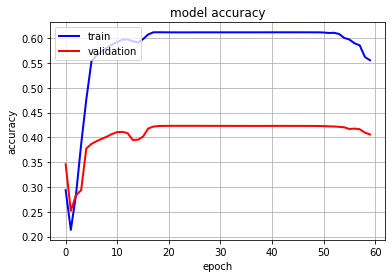

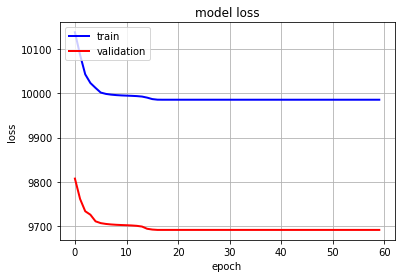

In [ ]:
plothist(history)
plothist_loss(history)

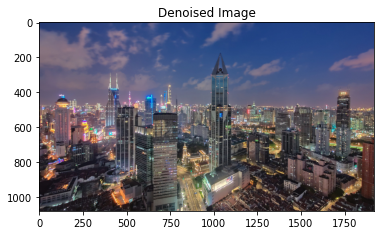

In [ ]:
b_pred=y_hat[:,:,0]
g_pred=y_hat[:,:,1]
r_pred=y_hat[:,:,2]

denoised_image = cv2.merge([b_pred,g_pred, r_pred])


#Plotting Output
plt.figure()
plt.imshow(cv2.cvtColor(denoised_image, cv2.COLOR_BGR2RGB))
plt.title('Denoised Image')



plt.show()
plt.close()